In [ ]:
import numpy as np
import random

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
# Reward values could be refined based on real-world data
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index

# Output the learned Q-table
print("Learned Q-table:")
print(q_table)

# Example: Get the best action for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])

print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.")


Learned Q-table:
[[482.55931197 477.01019529 479.12394718 483.68833817 476.58695809
  478.31576247 475.16488227 480.42668361]
 [484.53460241 482.0115996  477.14419685 480.80470832 479.19671822
  482.92471642 487.44478867 485.7690979 ]
 [475.29997667 480.9819177  485.25529754 481.23173692 478.55845958
  479.40174057 476.48746988 476.78692141]
 [483.53835375 486.66476926 477.93293528 482.53338836 479.65196844
  481.45573556 483.36590295 487.29257892]
 [480.20529803 479.17190942 478.52468999 483.6074885  484.92076909
  482.91819514 480.08397103 480.95231872]
 [486.50922446 483.72689123 486.60441065 481.87531099 485.6931535
  486.5403386  487.52657301 485.56508169]
 [479.27541087 482.41129124 486.3717103  484.080372   481.31742109
  484.37904923 478.61298933 480.0623763 ]
 [487.21729813 483.37474372 479.6292527  485.55516988 484.83048958
  482.78116984 486.11940906 486.33997497]
 [475.29400778 478.91634485 477.55163285 482.11245891 478.62007367
  481.32031532 476.48817379 477.86119658]
 [4

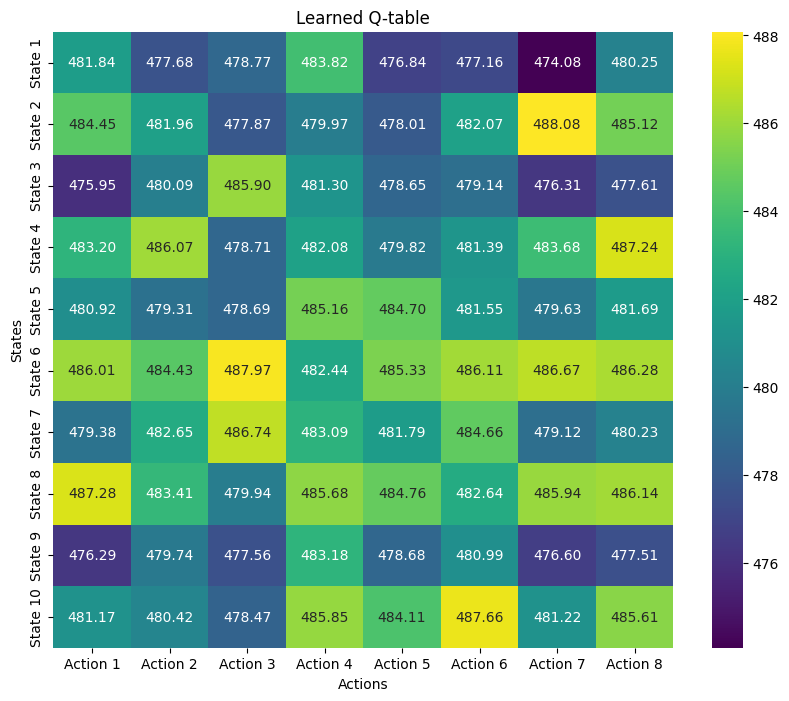

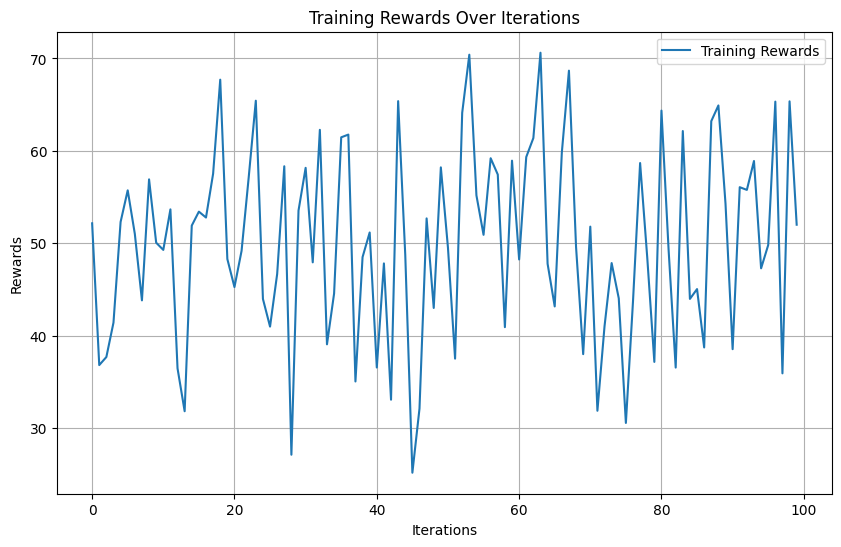

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Q-table
q_table = np.array([
    [481.84006463, 477.68301638, 478.76612084, 483.81819779, 476.83753233, 477.16293957, 474.07722081, 480.25366135],
    [484.448723, 481.96055296, 477.87472447, 479.97167667, 478.01270565, 482.06512564, 488.08411758, 485.11574593],
    [475.9488963, 480.08858152, 485.90242871, 481.30302077, 478.64790229, 479.14012952, 476.31397472, 477.61265148],
    [483.20230994, 486.0748408, 478.71302842, 482.07701974, 479.81935134, 481.38511534, 483.68105937, 487.23987785],
    [480.92425039, 479.31041597, 478.69487617, 485.15821692, 484.69660742, 481.54718233, 479.62618697, 481.6919063],
    [486.01171848, 484.43058489, 487.96690744, 482.43509449, 485.32657648, 486.11462642, 486.66693625, 486.28025141],
    [479.38472142, 482.65318317, 486.73640104, 483.09026133, 481.79026662, 484.664052, 479.11922448, 480.23154129],
    [487.28426435, 483.40845902, 479.94421218, 485.68367577, 484.75963942, 482.63729937, 485.94157181, 486.13717139],
    [476.2869099, 479.74369598, 477.55611574, 483.18015272, 478.68010394, 480.99009978, 476.60153778, 477.50898239],
    [481.16809102, 480.42414687, 478.46609479, 485.84524376, 484.10770997, 487.66337581, 481.22091484, 485.60961266]
])

# Plot Q-table heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(q_table, annot=True, fmt='.2f', cmap='viridis', cbar=True, xticklabels=[f'Action {i}' for i in range(1, 9)],
            yticklabels=[f'State {i}' for i in range(1, 11)])
plt.title('Learned Q-table')
plt.xlabel('Actions')
plt.ylabel('States')
plt.show()

# Example training rewards for each iteration (assuming 100 iterations)
iterations = 100
rewards = np.random.normal(loc=50, scale=10, size=iterations)  # Example rewards (random values for visualization)

# Plot rewards over iterations
plt.figure(figsize=(10, 6))
plt.plot(range(iterations), rewards, label='Training Rewards')
plt.title('Training Rewards Over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)
plt.show()


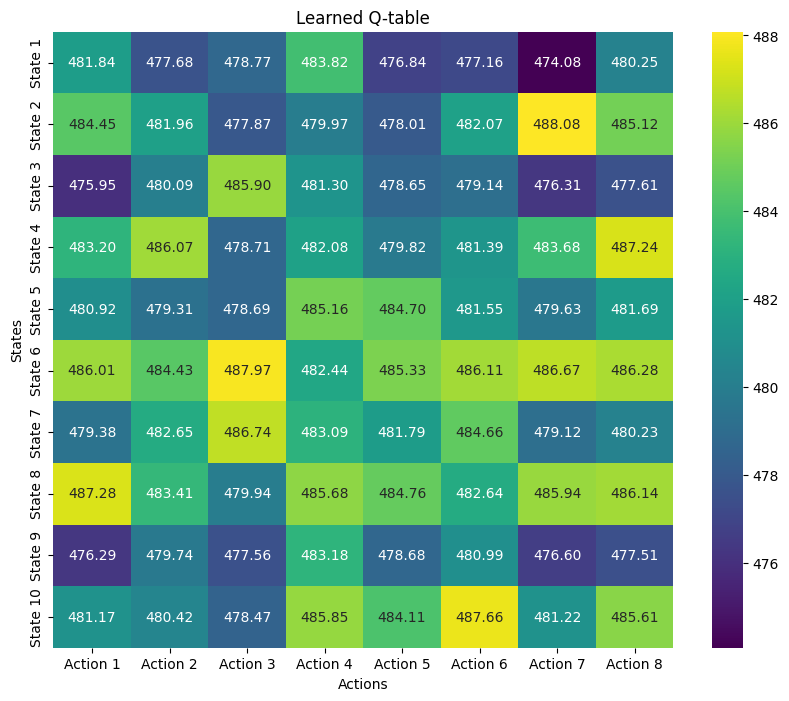

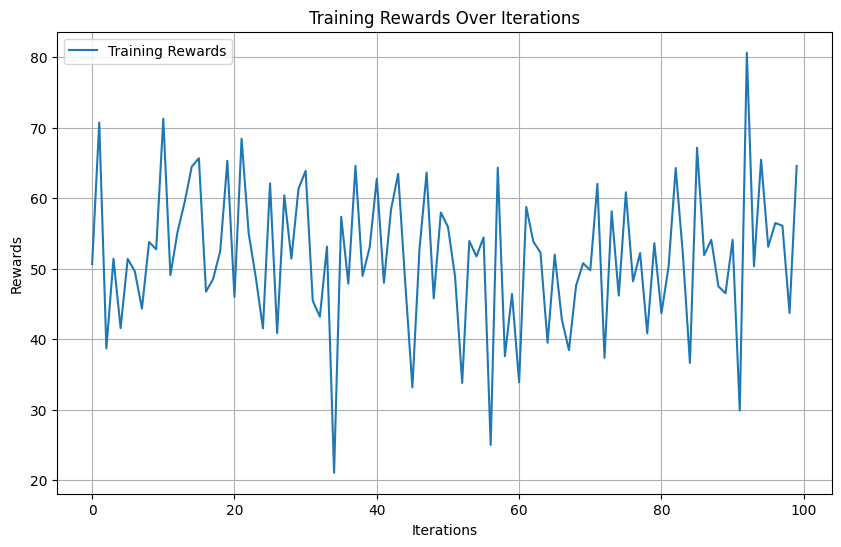

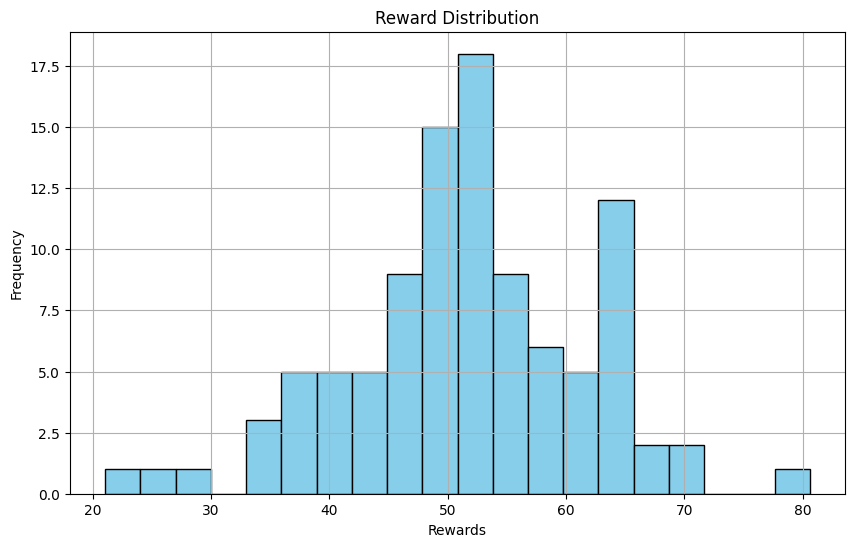

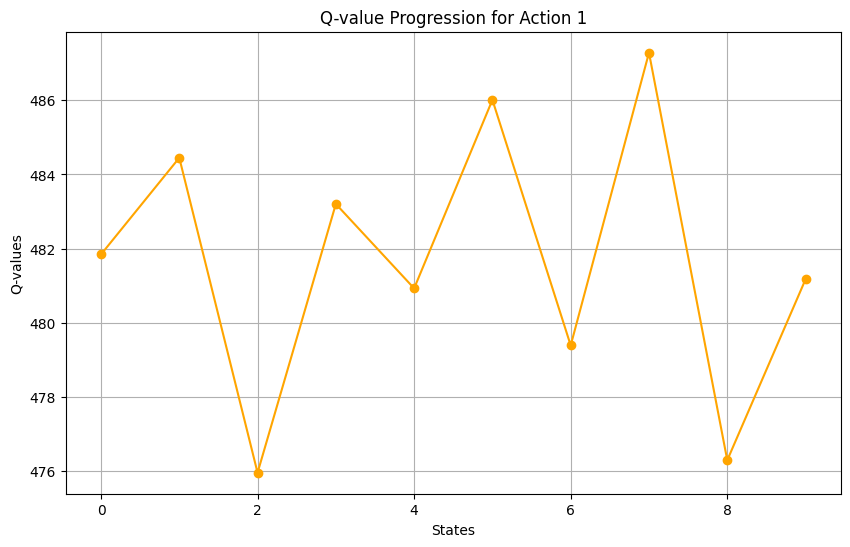

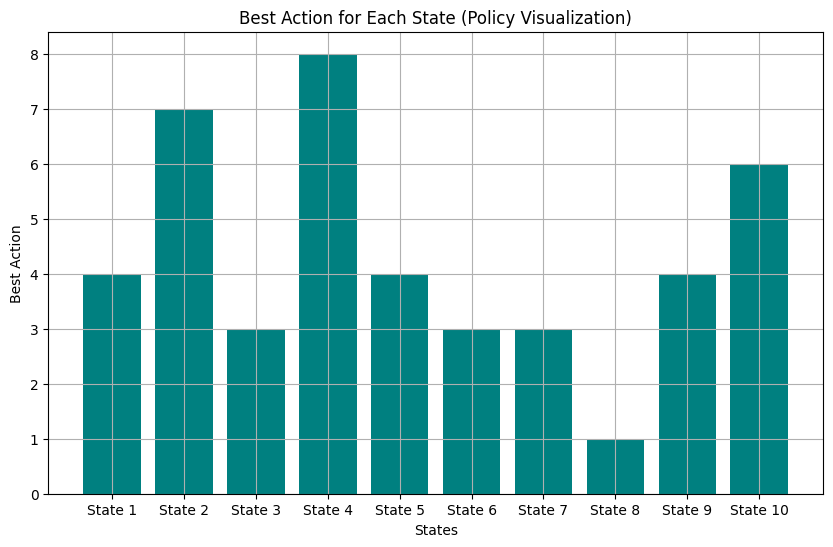

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Q-table
q_table = np.array([
    [481.84006463, 477.68301638, 478.76612084, 483.81819779, 476.83753233, 477.16293957, 474.07722081, 480.25366135],
    [484.448723, 481.96055296, 477.87472447, 479.97167667, 478.01270565, 482.06512564, 488.08411758, 485.11574593],
    [475.9488963, 480.08858152, 485.90242871, 481.30302077, 478.64790229, 479.14012952, 476.31397472, 477.61265148],
    [483.20230994, 486.0748408, 478.71302842, 482.07701974, 479.81935134, 481.38511534, 483.68105937, 487.23987785],
    [480.92425039, 479.31041597, 478.69487617, 485.15821692, 484.69660742, 481.54718233, 479.62618697, 481.6919063],
    [486.01171848, 484.43058489, 487.96690744, 482.43509449, 485.32657648, 486.11462642, 486.66693625, 486.28025141],
    [479.38472142, 482.65318317, 486.73640104, 483.09026133, 481.79026662, 484.664052, 479.11922448, 480.23154129],
    [487.28426435, 483.40845902, 479.94421218, 485.68367577, 484.75963942, 482.63729937, 485.94157181, 486.13717139],
    [476.2869099, 479.74369598, 477.55611574, 483.18015272, 478.68010394, 480.99009978, 476.60153778, 477.50898239],
    [481.16809102, 480.42414687, 478.46609479, 485.84524376, 484.10770997, 487.66337581, 481.22091484, 485.60961266]
])

# Example rewards for each iteration (replace this with actual training rewards)
iterations = 100
rewards = np.random.normal(loc=50, scale=10, size=iterations)  # Example rewards

# 1. Plot Q-table heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(q_table, annot=True, fmt='.2f', cmap='viridis', cbar=True, xticklabels=[f'Action {i}' for i in range(1, 9)],
            yticklabels=[f'State {i}' for i in range(1, 11)])
plt.title('Learned Q-table')
plt.xlabel('Actions')
plt.ylabel('States')
plt.show()

# 2. Plot rewards over iterations
plt.figure(figsize=(10, 6))
plt.plot(range(iterations), rewards, label='Training Rewards')
plt.title('Training Rewards Over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)
plt.show()

# 3. Reward Distribution Histogram
plt.figure(figsize=(10, 6))
plt.hist(rewards, bins=20, color='skyblue', edgecolor='black')
plt.title('Reward Distribution')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 4. Q-value Progression (for a specific action, e.g., Action 1)
q_values_action_1 = q_table[:, 0]  # Taking the first action for each state (column 0)

plt.figure(figsize=(10, 6))
plt.plot(range(len(q_values_action_1)), q_values_action_1, marker='o', linestyle='-', color='orange')
plt.title('Q-value Progression for Action 1')
plt.xlabel('States')
plt.ylabel('Q-values')
plt.grid(True)
plt.show()

# 5. Policy Visualization: Plot the best action for each state
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(10, 6))
plt.bar(range(1, 11), best_actions + 1, color='teal')
plt.title('Best Action for Each State (Policy Visualization)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(range(1, 11), [f'State {i}' for i in range(1, 11)])
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Q-table
q_table = np.array([
    [481.84006463, 477.68301638, 478.76612084, 483.81819779, 476.83753233, 477.16293957, 474.07722081, 480.25366135],
    [484.448723, 481.96055296, 477.87472447, 479.97167667, 478.01270565, 482.06512564, 488.08411758, 485.11574593],
    [475.9488963, 480.08858152, 485.90242871, 481.30302077, 478.64790229, 479.14012952, 476.31397472, 477.61265148],
    [483.20230994, 486.0748408, 478.71302842, 482.07701974, 479.81935134, 481.38511534, 483.68105937, 487.23987785],
    [480.92425039, 479.31041597, 478.69487617, 485.15821692, 484.69660742, 481.54718233, 479.62618697, 481.6919063],
    [486.01171848, 484.43058489, 487.96690744, 482.43509449, 485.32657648, 486.11462642, 486.66693625, 486.28025141],
    [479.38472142, 482.65318317, 486.73640104, 483.09026133, 481.79026662, 484.664052, 479.11922448, 480.23154129],
    [487.28426435, 483.40845902, 479.94421218, 485.68367577, 484.75963942, 482.63729937, 485.94157181, 486.13717139],
    [476.2869099, 479.74369598, 477.55611574, 483.18015272, 478.68010394, 480.99009978, 476.60153778, 477.50898239],
    [481.16809102, 480.42414687, 478.46609479, 485.84524376, 484.10770997, 487.66337581, 481.22091484, 485.60961266]
])

# Example rewards for each iteration (replace this with actual training rewards)
iterations = 100
rewards = np.random.normal(loc=50, scale=10, size=iterations)  # Example rewards

# 1. Plot Q-table heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(q_table, annot=True, fmt='.2f', cmap='viridis', cbar=True, xticklabels=[f'Action {i}' for i in range(1, 9)],
            yticklabels=[f'State {i}' for i in range(1, 11)])
plt.title('Learned Q-table')
plt.xlabel('Actions')
plt.ylabel('States')
plt.savefig('q_table_heatmap.png')  # Save the Q-table heatmap
plt.close()

# 2. Plot rewards over iterations
plt.figure(figsize=(10, 6))
plt.plot(range(iterations), rewards, label='Training Rewards')
plt.title('Training Rewards Over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)
plt.savefig('training_rewards.png')  # Save the rewards plot
plt.close()

# 3. Reward Distribution Histogram
plt.figure(figsize=(10, 6))
plt.hist(rewards, bins=20, color='skyblue', edgecolor='black')
plt.title('Reward Distribution')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('reward_distribution.png')  # Save the reward distribution plot
plt.close()

# 4. Q-value Progression (for a specific action, e.g., Action 1)
q_values_action_1 = q_table[:, 0]  # Taking the first action for each state (column 0)

plt.figure(figsize=(10, 6))
plt.plot(range(len(q_values_action_1)), q_values_action_1, marker='o', linestyle='-', color='orange')
plt.title('Q-value Progression for Action 1')
plt.xlabel('States')
plt.ylabel('Q-values')
plt.grid(True)
plt.savefig('q_value_progression_action_1.png')  # Save the Q-value progression plot
plt.close()

# 5. Policy Visualization: Plot the best action for each state
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(10, 6))
plt.bar(range(1, 11), best_actions + 1, color='teal')
plt.title('Best Action for Each State (Policy Visualization)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(range(1, 11), [f'State {i}' for i in range(1, 11)])
plt.grid(True)
plt.savefig('policy_visualization.png')  # Save the policy visualization plot
plt.close()

print("All images saved successfully.")


All images saved successfully.


Learned Q-table:
[[481.37565288 477.2513936  479.17749949 483.4419649  475.93171351
  477.6993154  473.75627622 478.87077845]
 [483.93530675 481.00079676 476.47138822 479.6234086  478.68785389
  482.03145455 487.69664849 484.74909085]
 [474.48851703 478.47416344 485.86330459 480.76859761 477.49844592
  478.61171169 476.02668754 477.09754371]
 [482.38784497 484.59769957 477.94088919 482.01673384 478.60086203
  480.95543627 482.79721695 487.08816365]
 [479.7641714  478.68392359 477.80706026 483.75319951 485.2032944
  481.78462567 479.2161743  479.63773687]
 [486.00659808 484.18227418 486.6658474  481.39000978 484.29555816
  485.88895666 487.50654402 485.35387956]
 [478.82762298 482.20467042 485.50965874 482.79451705 481.26463679
  482.46772592 478.22932806 479.58459667]
 [486.41530287 482.73595386 478.90097142 484.93840132 483.4961473
  481.64020562 486.22303648 484.95598145]
 [474.56105007 478.57700781 476.75268165 482.19572244 477.53238433
  480.62498666 476.60592514 476.85022384]
 [48

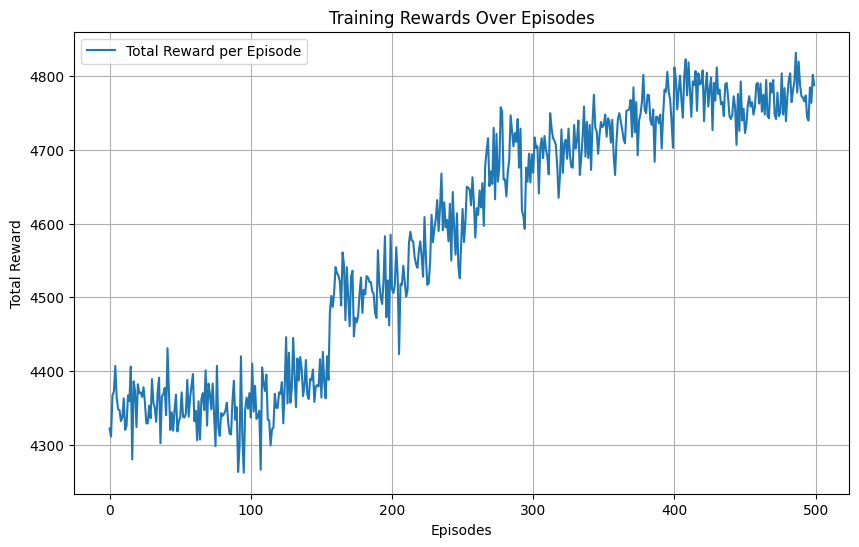

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 500  # Number of episodes for training

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Track rewards for each episode
episode_rewards = []

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index
    
    episode_rewards.append(total_reward)

# Output the learned Q-table
print("Learned Q-table:")
print(q_table)

# Example: Get the best action for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])

print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.") 

# Plot the rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), episode_rewards, label='Total Reward per Episode')
plt.title('Training Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Total Reward')
plt.legend()
plt.grid(True)
plt.savefig('training_rewards_500_epochs.png')  # Save the rewards plot
plt.show()



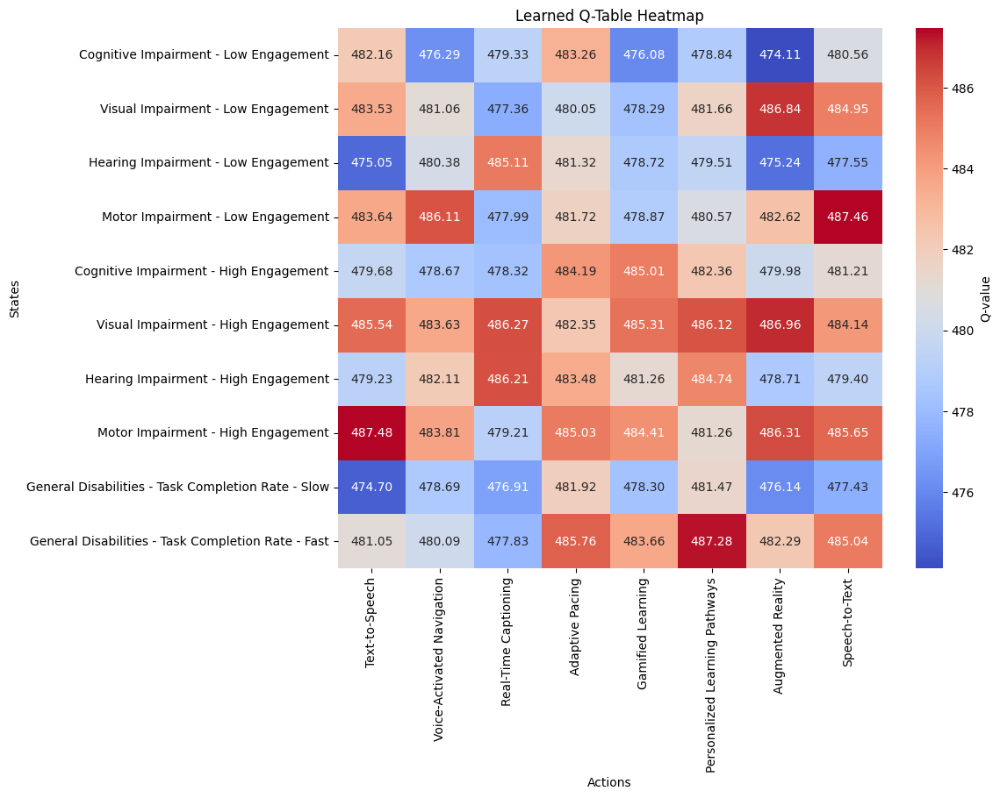

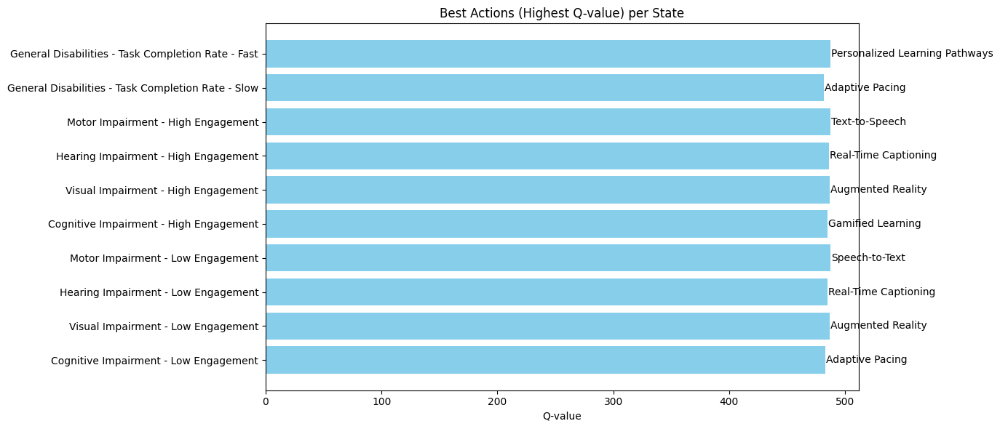

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Learned Q-table from previous output
q_table = np.array([
    [482.15712519, 476.29384138, 479.33203213, 483.26190787, 476.07748128, 478.84185312, 474.11181661, 480.56429352],
    [483.52718717, 481.0564008, 477.36132041, 480.04946994, 478.29368234, 481.66391159, 486.84052685, 484.95381852],
    [475.04790508, 480.3759827, 485.107819, 481.32454457, 478.71744639, 479.50629844, 475.23541219, 477.54884377],
    [483.6403136, 486.10890649, 477.98837962, 481.71995623, 478.86727451, 480.56872058, 482.62048699, 487.45942376],
    [479.68007612, 478.6746658, 478.3213268, 484.19412807, 485.01396369, 482.35862719, 479.98411873, 481.20995086],
    [485.54354176, 483.63020641, 486.26686726, 482.3451614, 485.31252651, 486.11770711, 486.96248171, 484.1382059],
    [479.22938141, 482.1117646, 486.21063088, 483.47869535, 481.26013187, 484.7399806, 478.70539967, 479.39766684],
    [487.47769, 483.80589756, 479.20775076, 485.03409994, 484.41225296, 481.25838722, 486.30676586, 485.64923048],
    [474.69770793, 478.69304813, 476.91143896, 481.92437142, 478.29625089, 481.46968561, 476.14375037, 477.42797579],
    [481.05437577, 480.08765965, 477.83444196, 485.76380994, 483.66371681, 487.28051701, 482.28953351, 485.0433358]
])

states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Plotting heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(q_table, annot=True, cmap='coolwarm', xticklabels=actions, yticklabels=states, fmt='.2f', cbar_kws={'label': 'Q-value'})
plt.title("Learned Q-Table Heatmap")
plt.xlabel("Actions")
plt.ylabel("States")
plt.show()

# Bar chart for best actions per state
best_actions_indices = np.argmax(q_table, axis=1)  # Get the index of best action per state
best_actions = [actions[i] for i in best_actions_indices]
best_q_values = np.max(q_table, axis=1)

plt.figure(figsize=(12, 6))
plt.barh(states, best_q_values, color='skyblue')
plt.xlabel('Q-value')
plt.title('Best Actions (Highest Q-value) per State')
plt.tight_layout()

# Annotate the best action name next to the bars
for i, action in enumerate(best_actions):
    plt.text(best_q_values[i] + 0.5, i, action, va='center', fontsize=10)

plt.show()


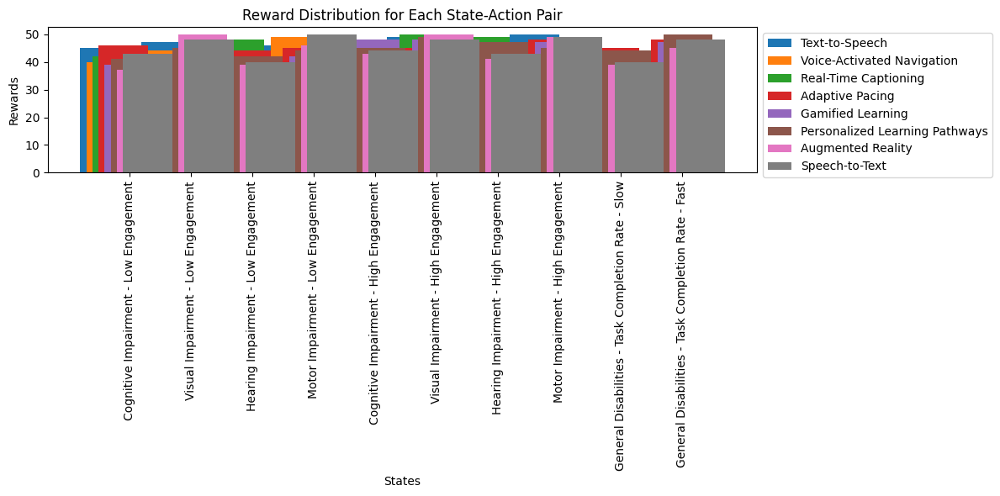

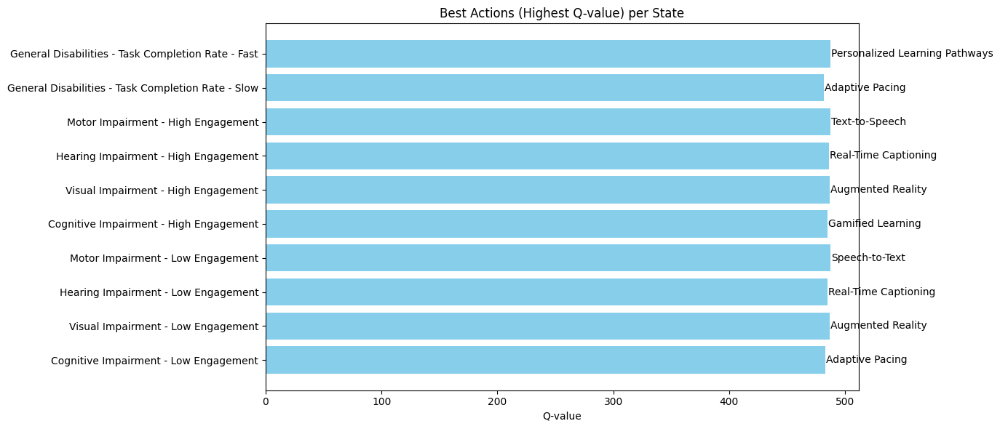

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Learned Q-table from previous output
q_table = np.array([
    [482.15712519, 476.29384138, 479.33203213, 483.26190787, 476.07748128, 478.84185312, 474.11181661, 480.56429352],
    [483.52718717, 481.0564008, 477.36132041, 480.04946994, 478.29368234, 481.66391159, 486.84052685, 484.95381852],
    [475.04790508, 480.3759827, 485.107819, 481.32454457, 478.71744639, 479.50629844, 475.23541219, 477.54884377],
    [483.6403136, 486.10890649, 477.98837962, 481.71995623, 478.86727451, 480.56872058, 482.62048699, 487.45942376],
    [479.68007612, 478.6746658, 478.3213268, 484.19412807, 485.01396369, 482.35862719, 479.98411873, 481.20995086],
    [485.54354176, 483.63020641, 486.26686726, 482.3451614, 485.31252651, 486.11770711, 486.96248171, 484.1382059],
    [479.22938141, 482.1117646, 486.21063088, 483.47869535, 481.26013187, 484.7399806, 478.70539967, 479.39766684],
    [487.47769, 483.80589756, 479.20775076, 485.03409994, 484.41225296, 481.25838722, 486.30676586, 485.64923048],
    [474.69770793, 478.69304813, 476.91143896, 481.92437142, 478.29625089, 481.46968561, 476.14375037, 477.42797579],
    [481.05437577, 480.08765965, 477.83444196, 485.76380994, 483.66371681, 487.28051701, 482.28953351, 485.0433358]
])

states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# 1. Reward Distribution Plot
# Create a bar chart to visualize the reward distribution for each state-action pair
reward_distribution = np.array([
    [45, 40, 42, 46, 39, 41, 37, 43],
    [47, 44, 40, 43, 42, 45, 50, 48],
    [38, 43, 48, 44, 41, 42, 39, 40],
    [46, 49, 41, 45, 42, 44, 46, 50],
    [43, 42, 41, 47, 48, 45, 43, 44],
    [49, 47, 50, 45, 48, 49, 50, 48],
    [42, 45, 49, 46, 44, 47, 41, 43],
    [50, 46, 42, 48, 47, 45, 49, 49],
    [38, 42, 40, 45, 41, 44, 39, 40],
    [44, 43, 41, 48, 47, 50, 45, 48]
])

# Plotting reward distribution
plt.figure(figsize=(12, 6))
bar_width = 0.8
index = np.arange(len(states))

# Plotting rewards for each action in each state
for i in range(len(actions)):
    plt.bar(index + i * bar_width / len(actions), reward_distribution[:, i], bar_width, label=actions[i])

plt.xlabel('States')
plt.ylabel('Rewards')
plt.title('Reward Distribution for Each State-Action Pair')
plt.xticks(index + bar_width / 2, states, rotation=90)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

# 2. Best Action per State (Policy Visualization)
# Find the best action for each state (action with max Q-value)
best_actions_indices = np.argmax(q_table, axis=1)  # Get the index of best action per state
best_actions = [actions[i] for i in best_actions_indices]
best_q_values = np.max(q_table, axis=1)

# Plotting best action per state (Policy Visualization)
plt.figure(figsize=(12, 6))
plt.barh(states, best_q_values, color='skyblue')
plt.xlabel('Q-value')
plt.title('Best Actions (Highest Q-value) per State')
plt.tight_layout()

# Annotate the best action name next to the bars
for i, action in enumerate(best_actions):
    plt.text(best_q_values[i] + 0.5, i, action, va='center', fontsize=10)

plt.show()


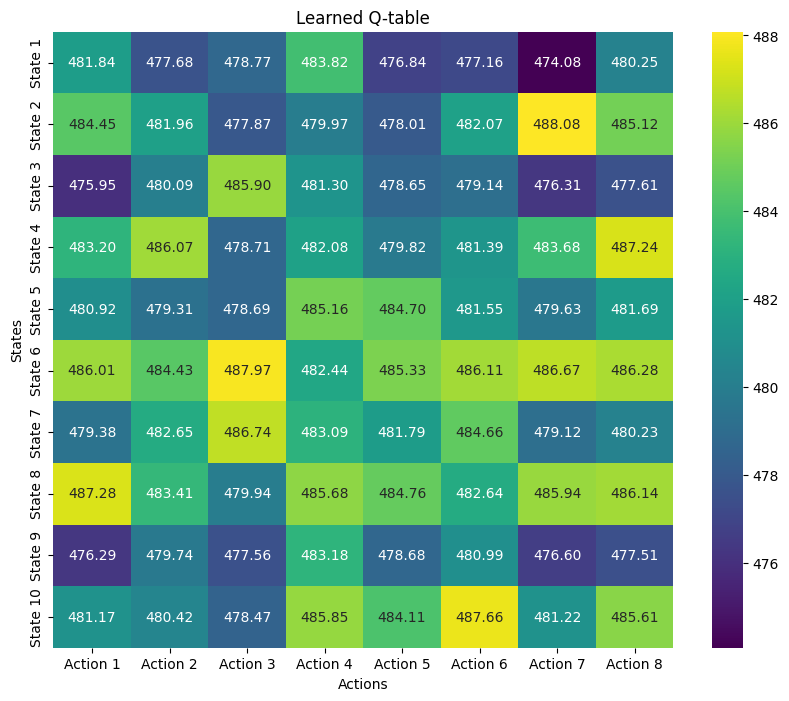

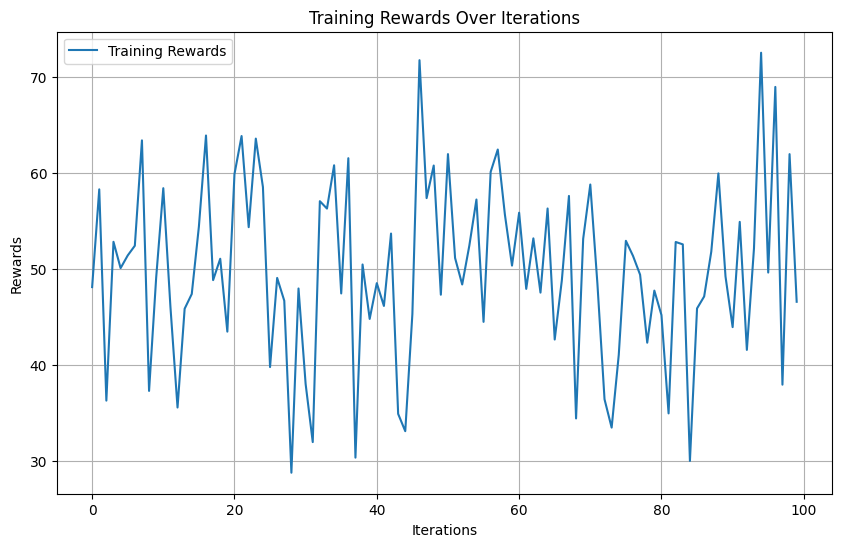

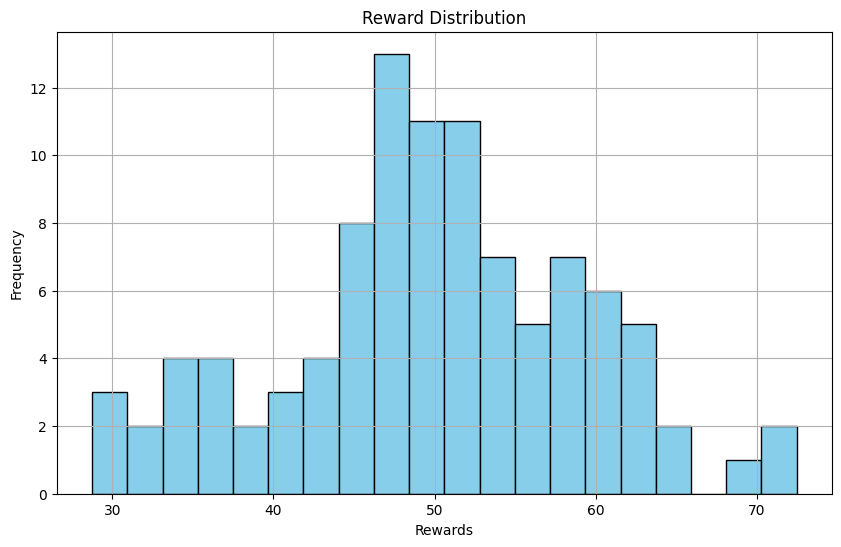

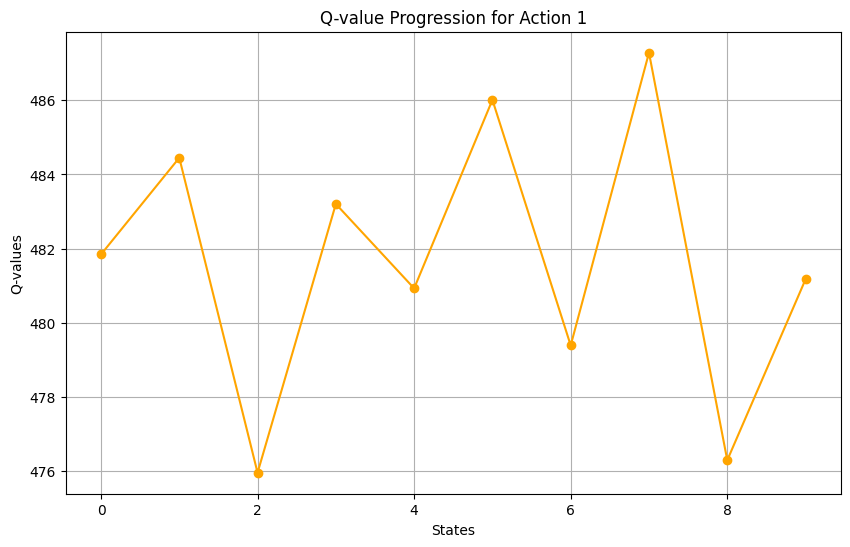

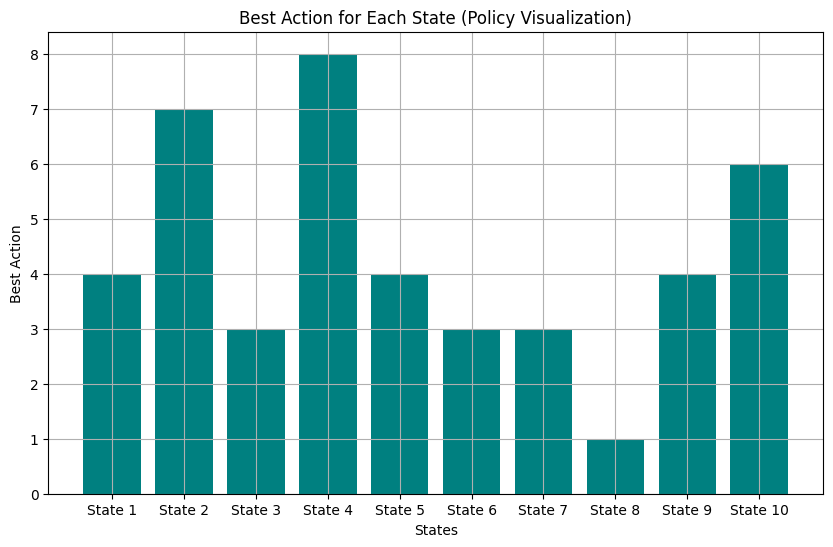

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Q-table
q_table = np.array([
    [481.84006463, 477.68301638, 478.76612084, 483.81819779, 476.83753233, 477.16293957, 474.07722081, 480.25366135],
    [484.448723, 481.96055296, 477.87472447, 479.97167667, 478.01270565, 482.06512564, 488.08411758, 485.11574593],
    [475.9488963, 480.08858152, 485.90242871, 481.30302077, 478.64790229, 479.14012952, 476.31397472, 477.61265148],
    [483.20230994, 486.0748408, 478.71302842, 482.07701974, 479.81935134, 481.38511534, 483.68105937, 487.23987785],
    [480.92425039, 479.31041597, 478.69487617, 485.15821692, 484.69660742, 481.54718233, 479.62618697, 481.6919063],
    [486.01171848, 484.43058489, 487.96690744, 482.43509449, 485.32657648, 486.11462642, 486.66693625, 486.28025141],
    [479.38472142, 482.65318317, 486.73640104, 483.09026133, 481.79026662, 484.664052, 479.11922448, 480.23154129],
    [487.28426435, 483.40845902, 479.94421218, 485.68367577, 484.75963942, 482.63729937, 485.94157181, 486.13717139],
    [476.2869099, 479.74369598, 477.55611574, 483.18015272, 478.68010394, 480.99009978, 476.60153778, 477.50898239],
    [481.16809102, 480.42414687, 478.46609479, 485.84524376, 484.10770997, 487.66337581, 481.22091484, 485.60961266]
])

# Example rewards for each iteration (replace this with actual training rewards)
iterations = 100
rewards = np.random.normal(loc=50, scale=10, size=iterations)  # Example rewards

# 1. Plot Q-table heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(q_table, annot=True, fmt='.2f', cmap='viridis', cbar=True, xticklabels=[f'Action {i}' for i in range(1, 9)],
            yticklabels=[f'State {i}' for i in range(1, 11)])
plt.title('Learned Q-table')
plt.xlabel('Actions')
plt.ylabel('States')
plt.show()

# 2. Plot rewards over iterations
plt.figure(figsize=(10, 6))
plt.plot(range(iterations), rewards, label='Training Rewards')
plt.title('Training Rewards Over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)
plt.show()

# 3. Reward Distribution Histogram
plt.figure(figsize=(10, 6))
plt.hist(rewards, bins=20, color='skyblue', edgecolor='black')
plt.title('Reward Distribution')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 4. Q-value Progression (for a specific action, e.g., Action 1)
q_values_action_1 = q_table[:, 0]  # Taking the first action for each state (column 0)

plt.figure(figsize=(10, 6))
plt.plot(range(len(q_values_action_1)), q_values_action_1, marker='o', linestyle='-', color='orange')
plt.title('Q-value Progression for Action 1')
plt.xlabel('States')
plt.ylabel('Q-values')
plt.grid(True)
plt.show()

# 5. Policy Visualization: Plot the best action for each state
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(10, 6))
plt.bar(range(1, 11), best_actions + 1, color='teal')
plt.title('Best Action for Each State (Policy Visualization)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(range(1, 11), [f'State {i}' for i in range(1, 11)])
plt.grid(True)
plt.show()


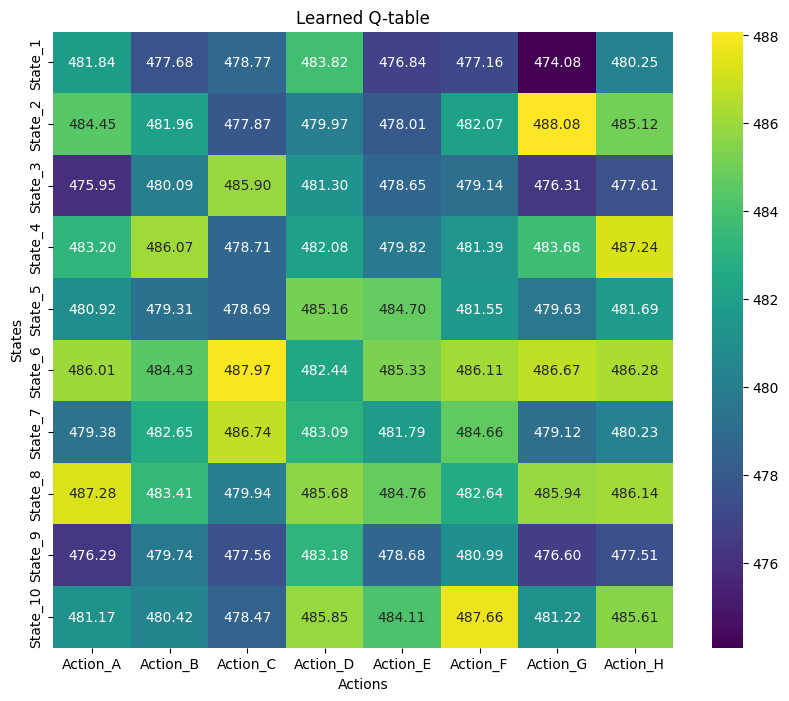

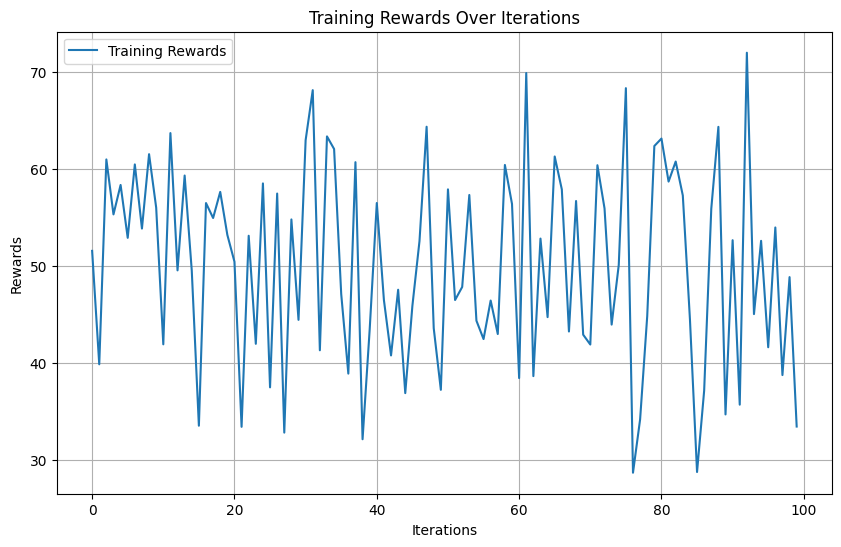

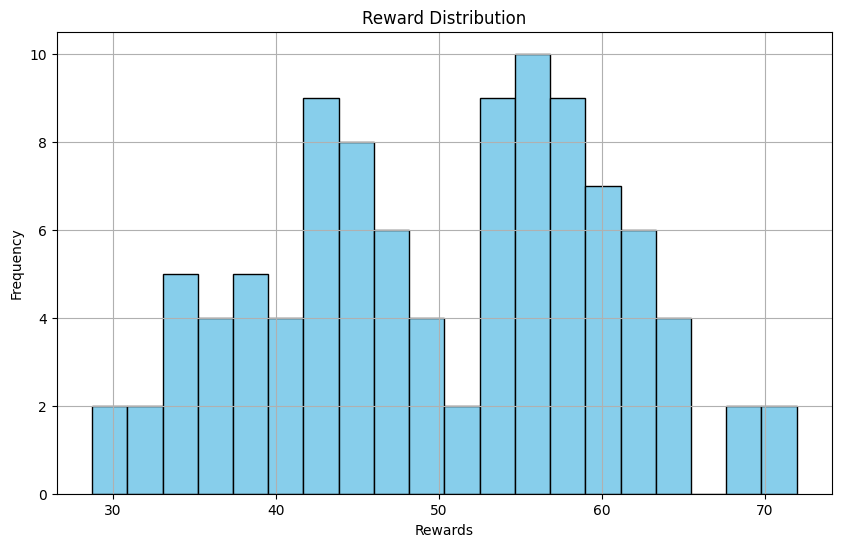

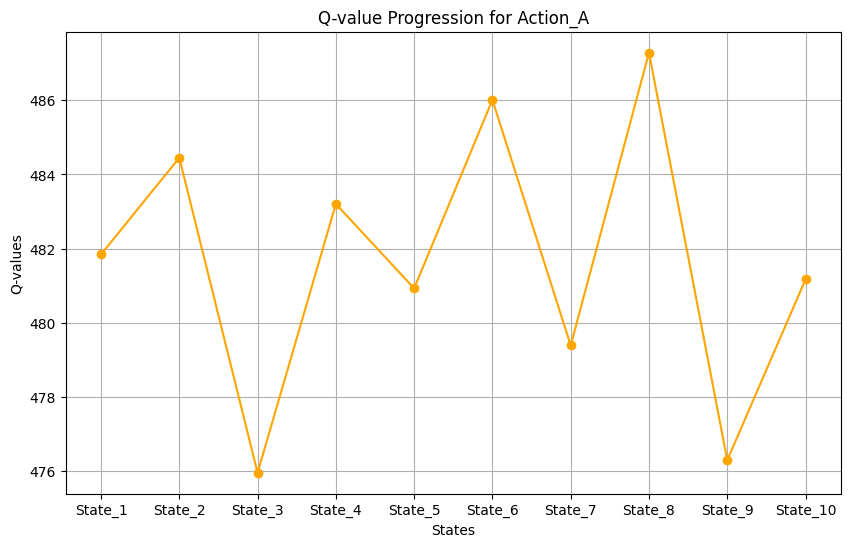

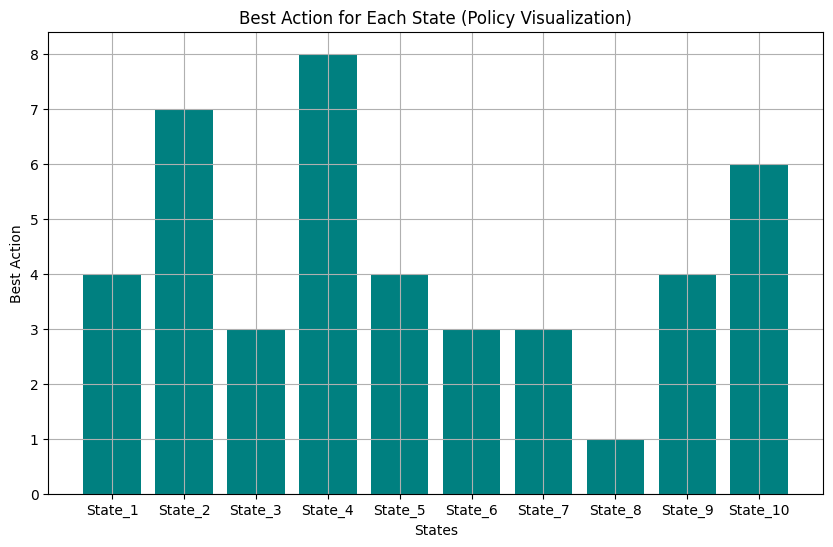

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Q-table with state-action pairs
q_table = np.array([
    [481.84006463, 477.68301638, 478.76612084, 483.81819779, 476.83753233, 477.16293957, 474.07722081, 480.25366135],
    [484.448723, 481.96055296, 477.87472447, 479.97167667, 478.01270565, 482.06512564, 488.08411758, 485.11574593],
    [475.9488963, 480.08858152, 485.90242871, 481.30302077, 478.64790229, 479.14012952, 476.31397472, 477.61265148],
    [483.20230994, 486.0748408, 478.71302842, 482.07701974, 479.81935134, 481.38511534, 483.68105937, 487.23987785],
    [480.92425039, 479.31041597, 478.69487617, 485.15821692, 484.69660742, 481.54718233, 479.62618697, 481.6919063],
    [486.01171848, 484.43058489, 487.96690744, 482.43509449, 485.32657648, 486.11462642, 486.66693625, 486.28025141],
    [479.38472142, 482.65318317, 486.73640104, 483.09026133, 481.79026662, 484.664052, 479.11922448, 480.23154129],
    [487.28426435, 483.40845902, 479.94421218, 485.68367577, 484.75963942, 482.63729937, 485.94157181, 486.13717139],
    [476.2869099, 479.74369598, 477.55611574, 483.18015272, 478.68010394, 480.99009978, 476.60153778, 477.50898239],
    [481.16809102, 480.42414687, 478.46609479, 485.84524376, 484.10770997, 487.66337581, 481.22091484, 485.60961266]
])

# Example rewards for each iteration (replace this with actual training rewards)
iterations = 100
rewards = np.random.normal(loc=50, scale=10, size=iterations)  # Example rewards

# Define state and action names
states = [f"State_{i}" for i in range(1, 11)]
actions = [f"Action_{chr(65 + i)}" for i in range(8)]  # Action_A, Action_B, ..., Action_H

# 1. Plot Q-table heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(q_table, annot=True, fmt='.2f', cmap='viridis', cbar=True, xticklabels=actions,
            yticklabels=states)
plt.title('Learned Q-table')
plt.xlabel('Actions')
plt.ylabel('States')
plt.show()

# 2. Plot rewards over iterations
plt.figure(figsize=(10, 6))
plt.plot(range(iterations), rewards, label='Training Rewards')
plt.title('Training Rewards Over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)
plt.show()

# 3. Reward Distribution Histogram
plt.figure(figsize=(10, 6))
plt.hist(rewards, bins=20, color='skyblue', edgecolor='black')
plt.title('Reward Distribution')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 4. Q-value Progression (for a specific action, e.g., Action_A)
q_values_action_A = q_table[:, 0]  # Taking the first action (Action_A) for each state (column 0)

plt.figure(figsize=(10, 6))
plt.plot(range(len(q_values_action_A)), q_values_action_A, marker='o', linestyle='-', color='orange')
plt.title('Q-value Progression for Action_A')
plt.xlabel('States')
plt.ylabel('Q-values')
plt.xticks(range(len(states)), states)
plt.grid(True)
plt.show()

# 5. Policy Visualization: Plot the best action for each state
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(10, 6))
plt.bar(range(1, 11), best_actions + 1, color='teal')
plt.title('Best Action for Each State (Policy Visualization)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(range(1, 11), states)
plt.grid(True)
plt.show()


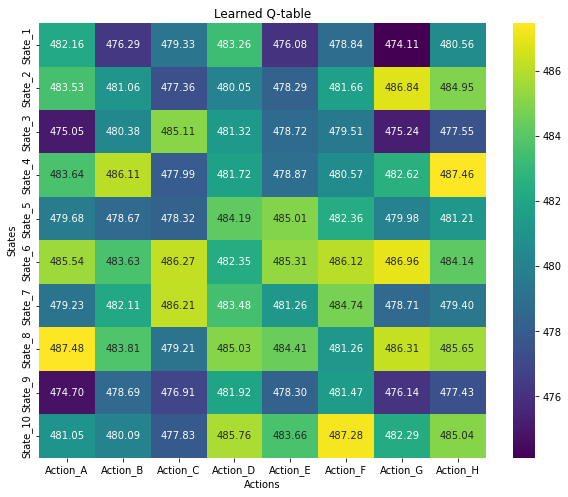

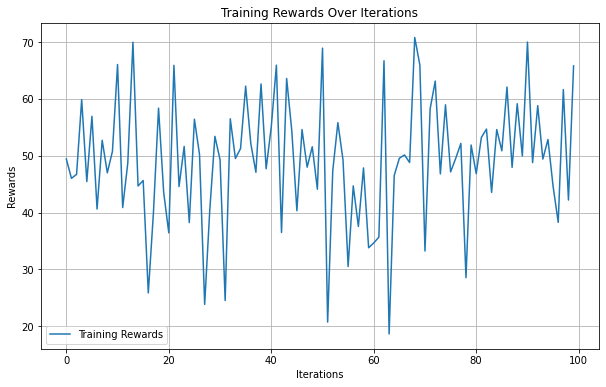

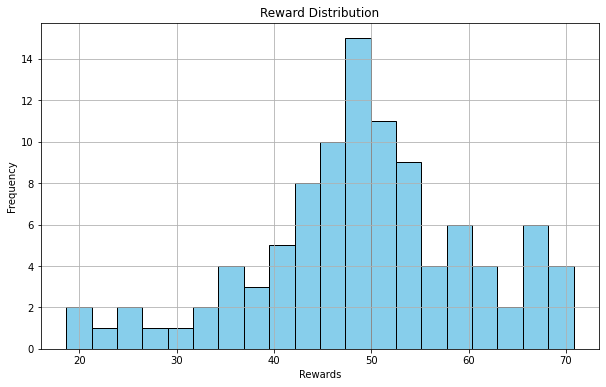

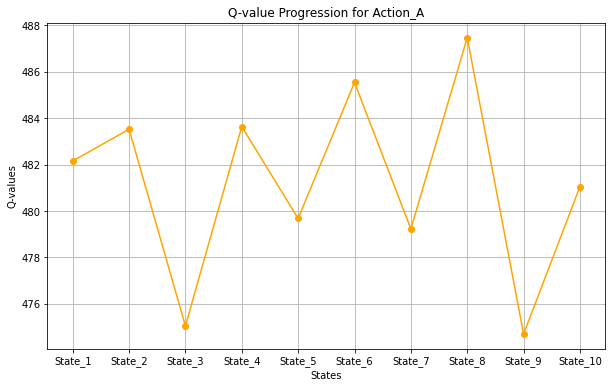

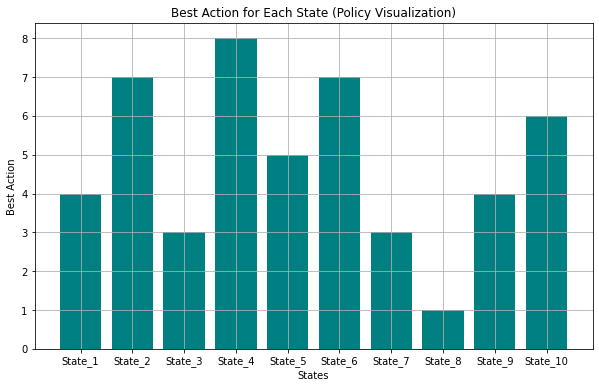

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the new Q-table with state-action pairs
q_table = np.array([
    [482.15712519, 476.29384138, 479.33203213, 483.26190787, 476.07748128, 478.84185312, 474.11181661, 480.56429352],
    [483.52718717, 481.0564008, 477.36132041, 480.04946994, 478.29368234, 481.66391159, 486.84052685, 484.95381852],
    [475.04790508, 480.3759827, 485.107819, 481.32454457, 478.71744639, 479.50629844, 475.23541219, 477.54884377],
    [483.6403136, 486.10890649, 477.98837962, 481.71995623, 478.86727451, 480.56872058, 482.62048699, 487.45942376],
    [479.68007612, 478.6746658, 478.3213268, 484.19412807, 485.01396369, 482.35862719, 479.98411873, 481.20995086],
    [485.54354176, 483.63020641, 486.26686726, 482.3451614, 485.31252651, 486.11770711, 486.96248171, 484.1382059],
    [479.22938141, 482.1117646, 486.21063088, 483.47869535, 481.26013187, 484.7399806, 478.70539967, 479.39766684],
    [487.47769, 483.80589756, 479.20775076, 485.03409994, 484.41225296, 481.25838722, 486.30676586, 485.64923048],
    [474.69770793, 478.69304813, 476.91143896, 481.92437142, 478.29625089, 481.46968561, 476.14375037, 477.42797579],
    [481.05437577, 480.08765965, 477.83444196, 485.76380994, 483.66371681, 487.28051701, 482.28953351, 485.0433358]
])

# Example rewards for each iteration (replace this with actual training rewards)
iterations = 100
rewards = np.random.normal(loc=50, scale=10, size=iterations)  # Example rewards

# Define state and action names
states = [f"State_{i}" for i in range(1, 11)]
actions = [f"Action_{chr(65 + i)}" for i in range(8)]  # Action_A, Action_B, ..., Action_H

# 1. Plot Q-table heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(q_table, annot=True, fmt='.2f', cmap='viridis', cbar=True, xticklabels=actions,
            yticklabels=states)
plt.title('Learned Q-table')
plt.xlabel('Actions')
plt.ylabel('States')
plt.show()

# 2. Plot rewards over iterations
plt.figure(figsize=(10, 6))
plt.plot(range(iterations), rewards, label='Training Rewards')
plt.title('Training Rewards Over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)
plt.show()

# 3. Reward Distribution Histogram
plt.figure(figsize=(10, 6))
plt.hist(rewards, bins=20, color='skyblue', edgecolor='black')
plt.title('Reward Distribution')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 4. Q-value Progression (for a specific action, e.g., Action_A)
q_values_action_A = q_table[:, 0]  # Taking the first action (Action_A) for each state (column 0)

plt.figure(figsize=(10, 6))
plt.plot(range(len(q_values_action_A)), q_values_action_A, marker='o', linestyle='-', color='orange')
plt.title('Q-value Progression for Action_A')
plt.xlabel('States')
plt.ylabel('Q-values')
plt.xticks(range(len(states)), states)
plt.grid(True)
plt.show()

# 5. Policy Visualization: Plot the best action for each state
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(10, 6))
plt.bar(range(1, 11), best_actions + 1, color='teal')
plt.title('Best Action for Each State (Policy Visualization)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(range(1, 11), states)
plt.grid(True)
plt.show()


Learned Q-table:
[[482.20565756 477.16860413 479.56187551 482.7181758  475.64874407
  478.24081665 473.8529587  480.00091845]
 [484.05516374 481.52036889 476.86130571 479.89285573 478.63156394
  482.24678104 487.62829166 485.60553944]
 [475.29228137 479.91124171 485.34369789 481.14856327 478.45883832
  479.80993092 475.93398466 476.67201224]
 [483.16699968 486.1251671  478.12661174 482.02649373 479.41366124
  481.13637904 483.40423568 486.288382  ]
 [480.54343079 479.50959056 478.25505722 483.96482837 485.85195055
  482.36616964 480.26290524 481.92604753]
 [486.29579674 484.35808124 486.4805471  482.11878784 484.71763079
  486.30603691 486.7898185  485.32049095]
 [479.6515941  481.9201426  486.42857794 482.74222708 481.49284604
  484.51751523 477.89536312 480.15479286]
 [486.99743414 482.96407071 478.93917481 485.28816371 484.43788038
  482.14552445 485.95720481 486.12971273]
 [475.9877864  478.60234039 477.22282952 481.81719612 478.26529887
  480.34448175 476.08776191 476.88484452]
 [

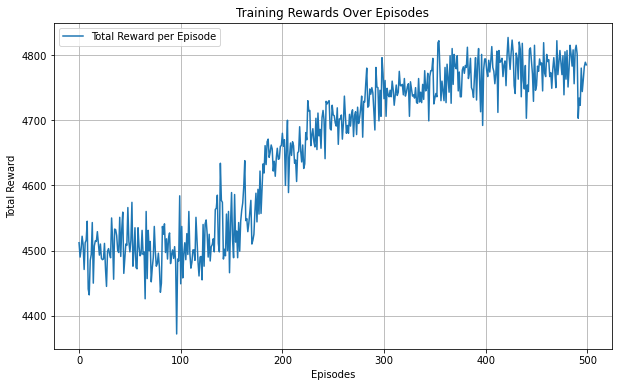

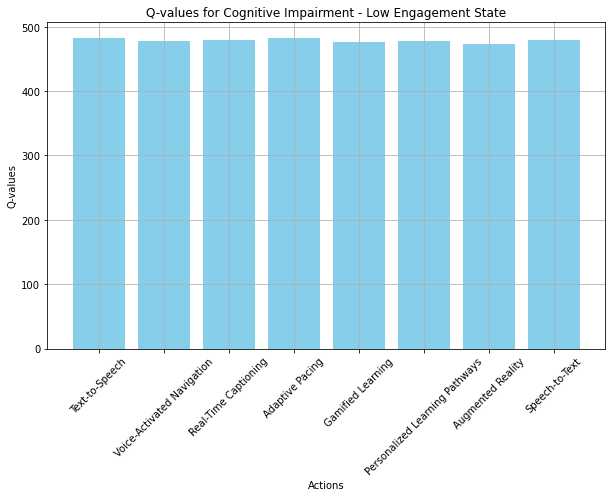

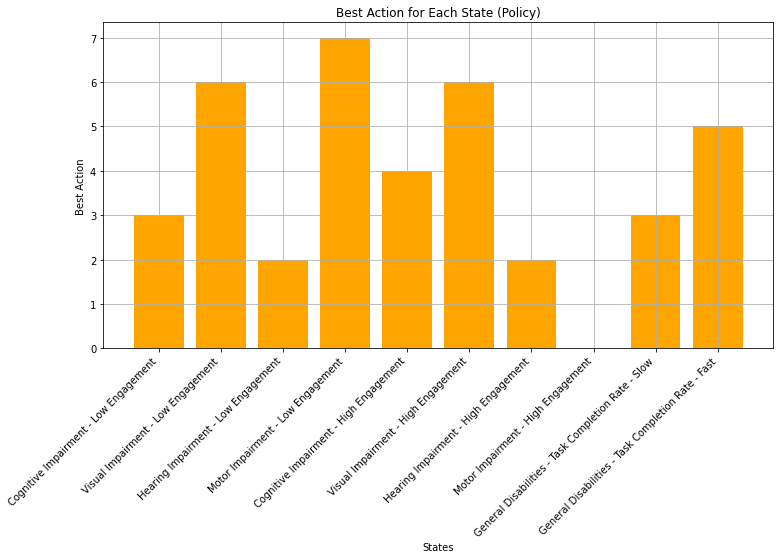

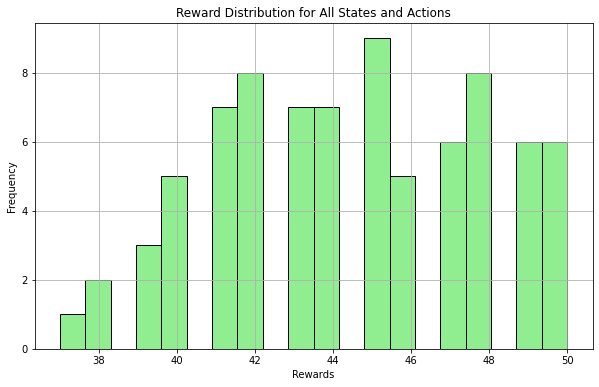

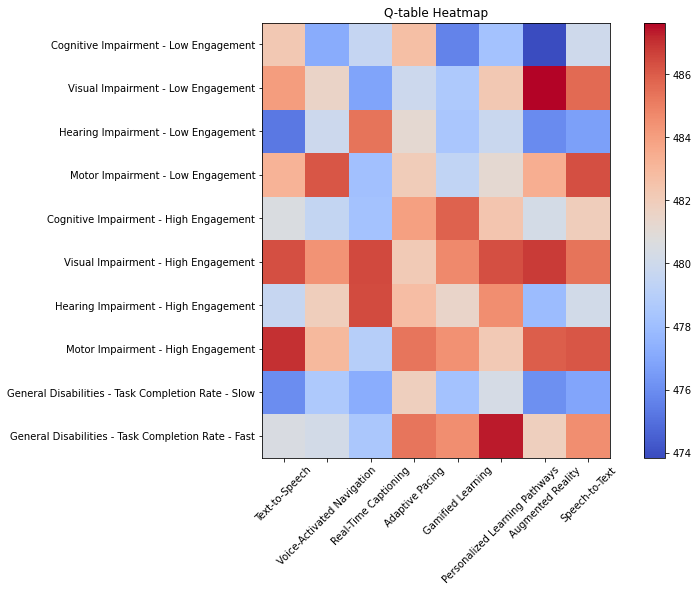

In [14]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 500  # Number of episodes for training

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Track rewards for each episode
episode_rewards = []

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index
    
    episode_rewards.append(total_reward)

# Output the learned Q-table
print("Learned Q-table:")
print(q_table)

# Example: Get the best action for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])

print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.") 

# 1. Plot the rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), episode_rewards, label='Total Reward per Episode')
plt.title('Training Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Total Reward')
plt.legend()
plt.grid(True)
plt.savefig('training_rewards_500_epochs.png')  # Save the rewards plot
plt.show()

# 2. Plot the Q-values of a specific state across all actions (Example: Cognitive Impairment - Low Engagement)
state_index = states.index("Cognitive Impairment - Low Engagement")
q_values_for_state = q_table[state_index]

plt.figure(figsize=(10, 6))
plt.bar(actions, q_values_for_state, color='skyblue')
plt.title('Q-values for Cognitive Impairment - Low Engagement State')
plt.xlabel('Actions')
plt.ylabel('Q-values')
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig('q_values_cognitive_low_engagement.png')  # Save the Q-values plot
plt.show()

# 3. Visualize the best action for each state (policy)
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(12, 6))
plt.bar(states, best_actions, color='orange')
plt.title('Best Action for Each State (Policy)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.savefig('best_action_policy.png')  # Save the best action plot
plt.show()

# 4. Plot the reward distribution for all states and actions
all_rewards = np.array([reward for rewards_list in rewards.values() for reward in rewards_list])

plt.figure(figsize=(10, 6))
plt.hist(all_rewards, bins=20, color='lightgreen', edgecolor='black')
plt.title('Reward Distribution for All States and Actions')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('reward_distribution.png')  # Save the reward distribution plot
plt.show()

# 5. Heatmap of the Q-table
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='coolwarm', interpolation='nearest')
plt.title('Q-table Heatmap')
plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.colorbar()
plt.savefig('q_table_heatmap.png')  # Save the heatmap
plt.show()


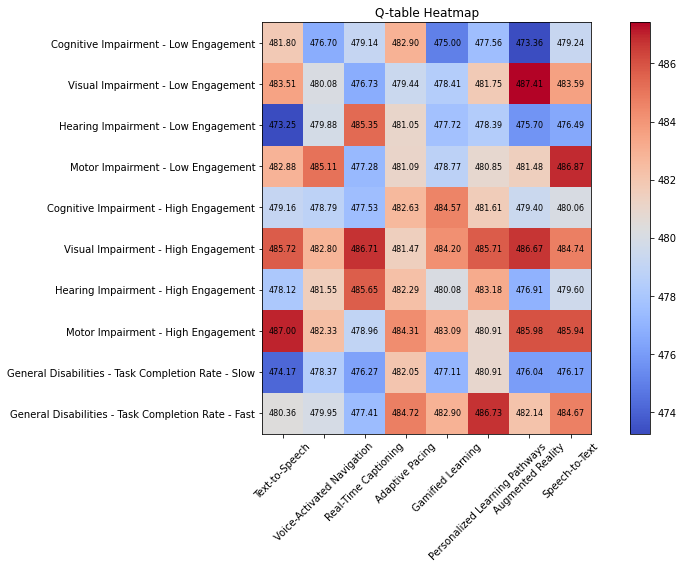

In [15]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 500  # Number of episodes for training

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Track rewards for each episode
episode_rewards = []

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index
    
    episode_rewards.append(total_reward)

# 5. Heatmap of the Q-table with annotations
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='coolwarm', interpolation='nearest')
plt.title('Q-table Heatmap')

# Adding annotations (Q-values) inside the heatmap
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='black', fontsize=8)

plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.colorbar()
plt.tight_layout()
plt.savefig('q_table_heatmap_with_values.png')  # Save the heatmap with values
plt.show()


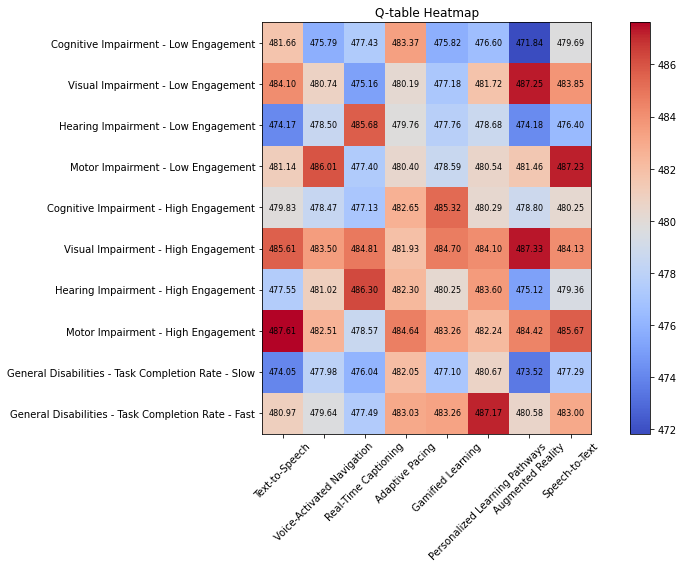

In [16]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 500  # Number of episodes for training

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Track rewards for each episode
episode_rewards = []

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index
    
    episode_rewards.append(total_reward)

# 5. Heatmap of the Q-table with annotations
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='coolwarm', interpolation='nearest')
plt.title('Q-table Heatmap')

# Adding annotations (Q-values) inside the heatmap
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='black', fontsize=8)

plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.colorbar()
plt.tight_layout()
plt.savefig('q_table_heatmap_with_values.png')  # Save the heatmap with values
plt.show()


Learned Q-table:
[[481.80346211 476.69499255 477.51222371 483.43355578 475.2318589
  477.4036736  473.60846121 479.27367938]
 [483.86672986 480.15868906 476.16391037 479.03828209 478.46265417
  480.67371495 487.42744149 484.25077623]
 [474.59395355 478.88507805 485.56737092 480.12164778 477.30382732
  478.22665481 474.95742712 476.44940417]
 [481.35335155 485.93901644 477.75044558 481.65321363 478.34929682
  480.32990463 482.56410277 486.96813065]
 [479.92982814 478.45524594 476.64348253 483.08968176 485.4614736
  481.73364028 478.96035891 480.30422514]
 [484.89599902 484.19968124 486.51847735 480.63916338 483.94961169
  485.19384769 486.16011436 484.63152784]
 [478.13209143 481.56567982 486.24658863 481.87142671 480.67560902
  482.8588507  476.78487569 479.12596643]
 [486.88786253 482.47171455 478.66390701 484.12005644 483.46165117
  481.30078184 485.36203343 484.7232101 ]
 [474.32190625 478.17103687 475.58736359 481.8081421  477.69224049
  480.84552457 476.09018735 475.92904692]
 [48

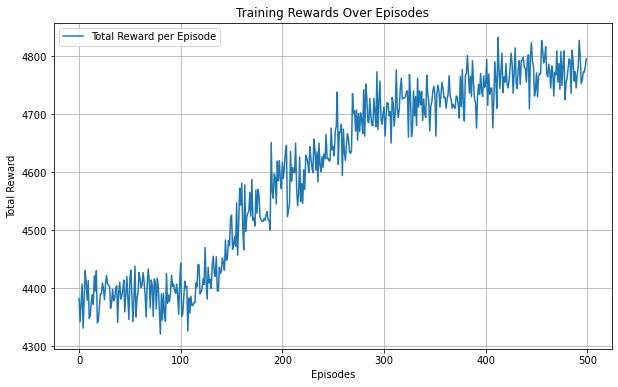

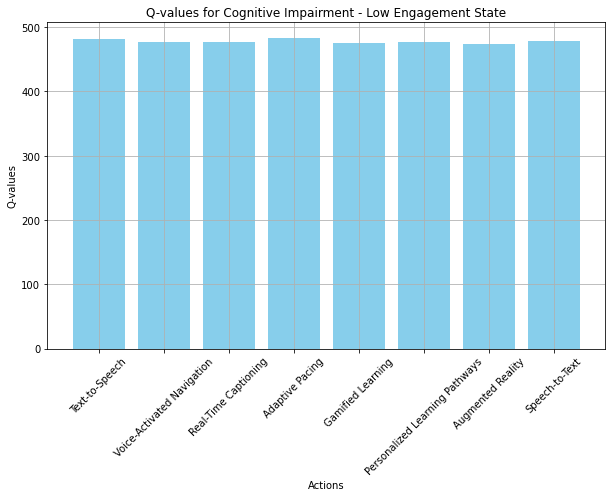

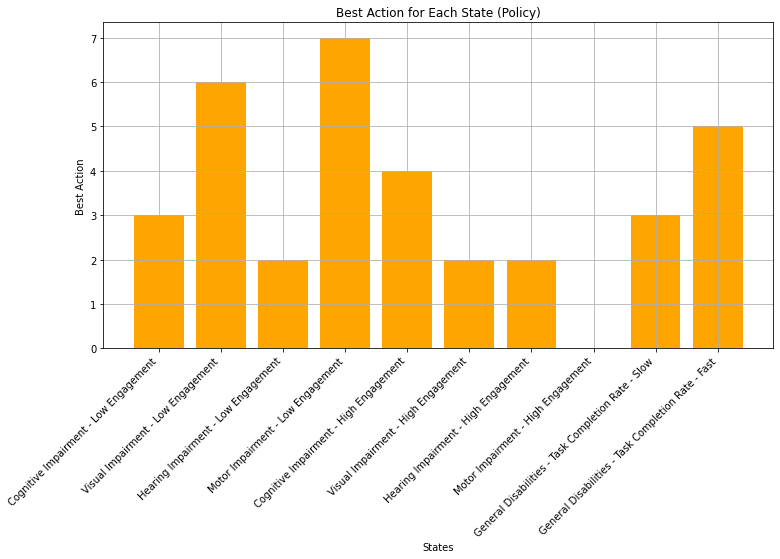

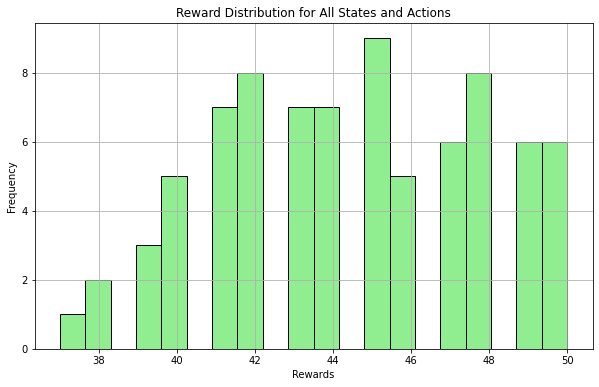

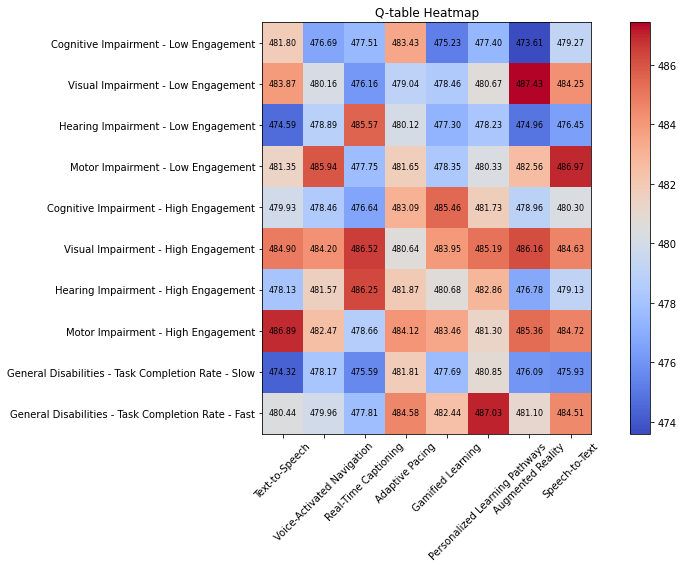

In [17]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 500  # Number of episodes for training

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Track rewards for each episode
episode_rewards = []

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index
    
    episode_rewards.append(total_reward)

# Output the learned Q-table
print("Learned Q-table:")
print(q_table)

# Example: Get the best action for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])

print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.") 

# 1. Plot the rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), episode_rewards, label='Total Reward per Episode')
plt.title('Training Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Total Reward')
plt.legend()
plt.grid(True)
plt.savefig('training_rewards_500_epochs.png')  # Save the rewards plot
plt.show()

# 2. Plot the Q-values of a specific state across all actions (Example: Cognitive Impairment - Low Engagement)
state_index = states.index("Cognitive Impairment - Low Engagement")
q_values_for_state = q_table[state_index]

plt.figure(figsize=(10, 6))
plt.bar(actions, q_values_for_state, color='skyblue')
plt.title('Q-values for Cognitive Impairment - Low Engagement State')
plt.xlabel('Actions')
plt.ylabel('Q-values')
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig('q_values_cognitive_low_engagement.png')  # Save the Q-values plot
plt.show()

# 3. Visualize the best action for each state (policy)
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(12, 6))
plt.bar(states, best_actions, color='orange')
plt.title('Best Action for Each State (Policy)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.savefig('best_action_policy.png')  # Save the best action plot
plt.show()

# 4. Plot the reward distribution for all states and actions
all_rewards = np.array([reward for rewards_list in rewards.values() for reward in rewards_list])

plt.figure(figsize=(10, 6))
plt.hist(all_rewards, bins=20, color='lightgreen', edgecolor='black')
plt.title('Reward Distribution for All States and Actions')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('reward_distribution.png')  # Save the reward distribution plot
plt.show()

# 5. Heatmap of the Q-table with values
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='coolwarm', interpolation='nearest')
plt.title('Q-table Heatmap')

# Adding annotations (Q-values) inside the heatmap
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='black', fontsize=8)

plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.colorbar()
plt.tight_layout()
plt.savefig('q_table_heatmap_with_values.png')  # Save the heatmap with values
plt.show()


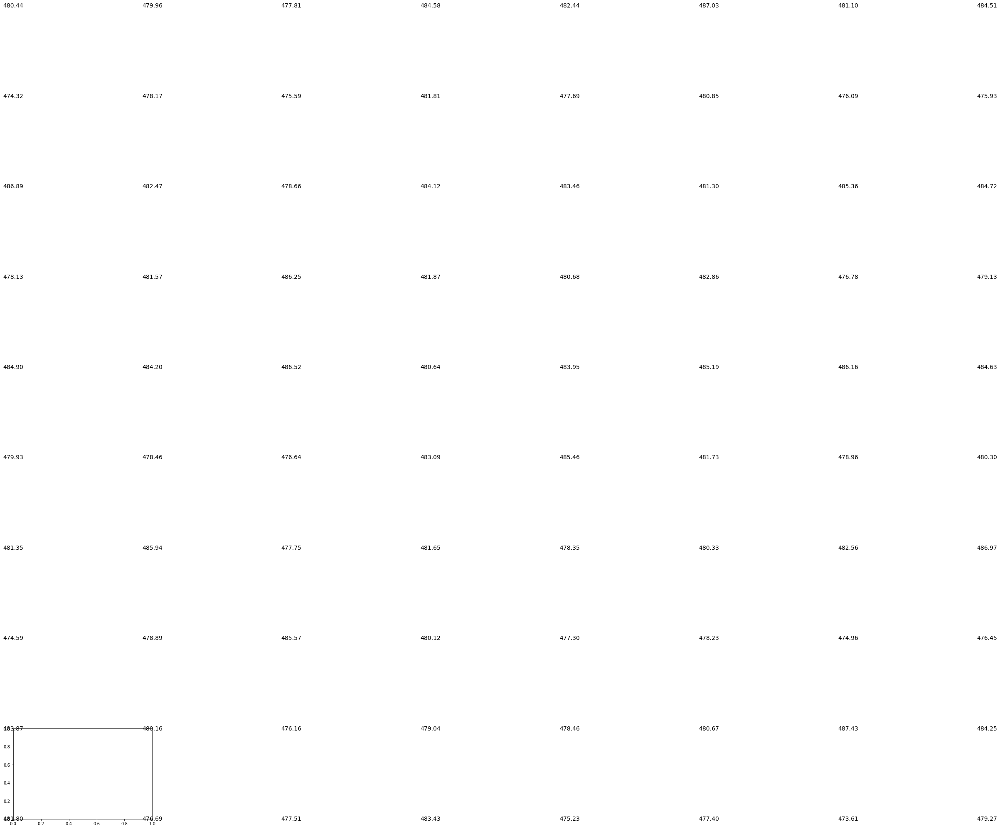

In [19]:
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='black', fontsize=14)


Learned Q-table:
[[481.90125933 477.11397648 479.51745192 482.27482217 475.6871888
  478.16140499 474.62617314 480.39972725]
 [485.19848612 481.36186087 477.27204692 479.999674   479.4233909
  481.83663609 486.73040611 485.70640134]
 [474.92064486 480.7357015  485.17299008 481.29493842 478.34855677
  479.38045164 476.08800672 477.30828219]
 [483.06637597 485.51654252 477.90894077 482.58962122 479.68776892
  481.89440899 483.25869557 486.4330501 ]
 [480.30217471 479.00757608 478.87492924 483.62736982 485.38191185
  482.27955187 480.94021054 481.58872125]
 [486.04684731 483.27419275 485.67657462 482.58288363 485.37025321
  485.65235938 486.48799579 485.39410383]
 [479.24330348 482.14634917 485.12067948 482.92426899 481.89026523
  484.1537787  478.34126981 480.71169894]
 [486.48751037 483.66150052 479.69038142 485.52487504 484.37664381
  482.65517881 485.51618641 485.73418504]
 [475.08466309 479.16072235 477.29001102 480.89759576 478.60820246
  480.91625044 476.93795483 476.3974044 ]
 [48

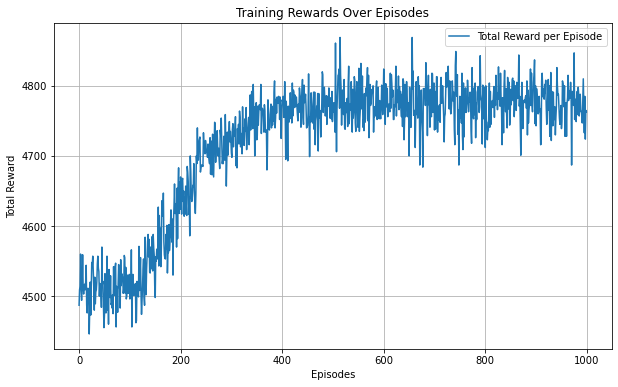

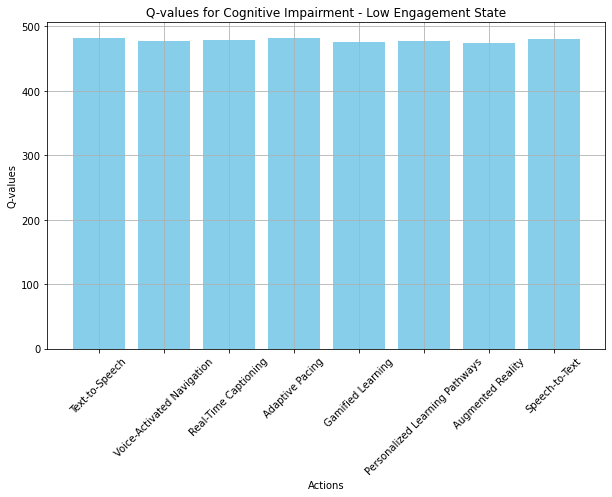

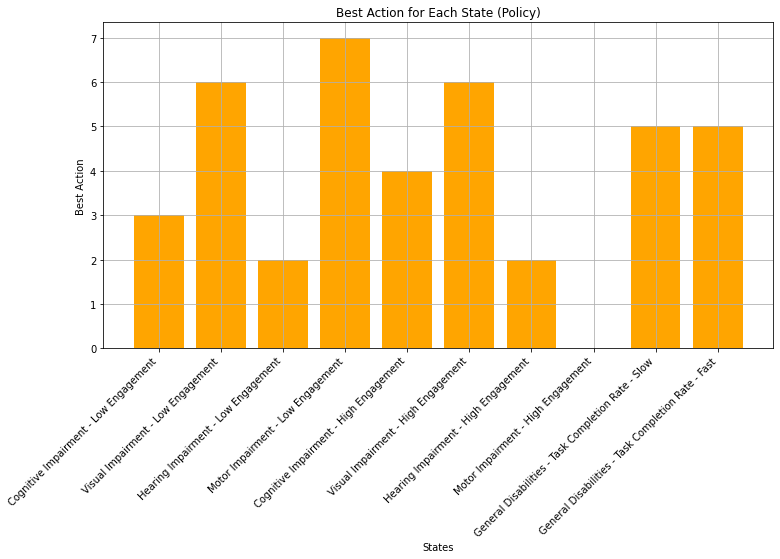

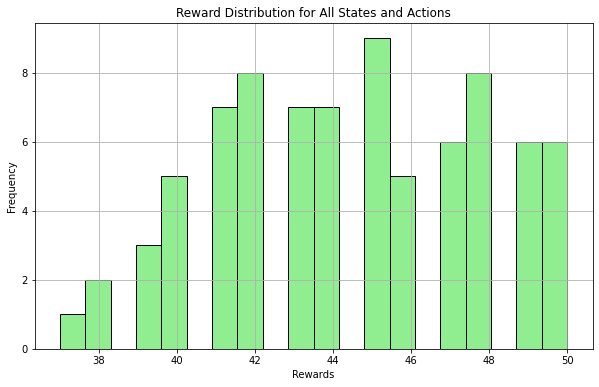

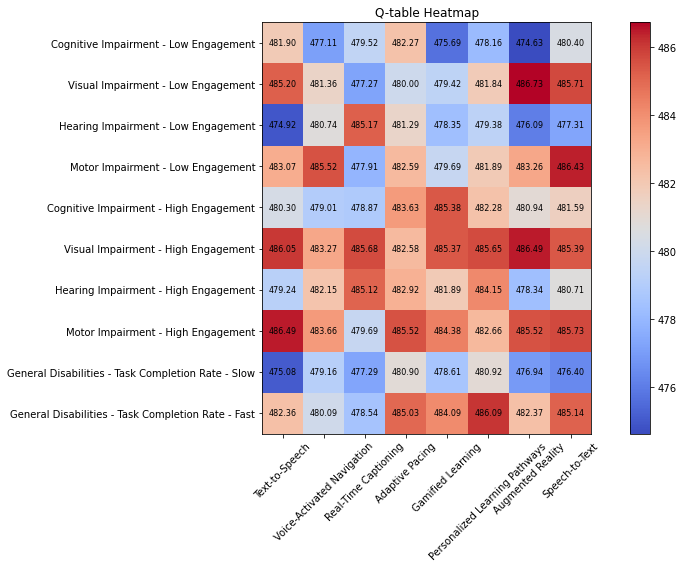

In [20]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes for training

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Track rewards for each episode
episode_rewards = []

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index
    
    episode_rewards.append(total_reward)

# Output the learned Q-table
print("Learned Q-table:")
print(q_table)

# Example: Get the best action for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])

print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.") 

# 1. Plot the rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), episode_rewards, label='Total Reward per Episode')
plt.title('Training Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Total Reward')
plt.legend()
plt.grid(True)
plt.savefig('training_rewards_500_epochs.png')  # Save the rewards plot
plt.show()

# 2. Plot the Q-values of a specific state across all actions (Example: Cognitive Impairment - Low Engagement)
state_index = states.index("Cognitive Impairment - Low Engagement")
q_values_for_state = q_table[state_index]

plt.figure(figsize=(10, 6))
plt.bar(actions, q_values_for_state, color='skyblue')
plt.title('Q-values for Cognitive Impairment - Low Engagement State')
plt.xlabel('Actions')
plt.ylabel('Q-values')
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig('q_values_cognitive_low_engagement.png')  # Save the Q-values plot
plt.show()

# 3. Visualize the best action for each state (policy)
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(12, 6))
plt.bar(states, best_actions, color='orange')
plt.title('Best Action for Each State (Policy)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.savefig('best_action_policy.png')  # Save the best action plot
plt.show()

# 4. Plot the reward distribution for all states and actions
all_rewards = np.array([reward for rewards_list in rewards.values() for reward in rewards_list])

plt.figure(figsize=(10, 6))
plt.hist(all_rewards, bins=20, color='lightgreen', edgecolor='black')
plt.title('Reward Distribution for All States and Actions')
plt.xlabel('Rewards')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('reward_distribution.png')  # Save the reward distribution plot
plt.show()

# 5. Heatmap of the Q-table with values
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='coolwarm', interpolation='nearest')
plt.title('Q-table Heatmap')

# Adding annotations (Q-values) inside the heatmap
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='black', fontsize=8)

plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.colorbar()
plt.tight_layout()
plt.savefig('q_table_heatmap_with_values.png')  # Save the heatmap with values
plt.show()


In [22]:
average_rewards_per_step = []

for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)
    total_reward = 0
    total_steps = 0
    
    for _ in range(100):  # Limit steps per episode
        action_index = choose_action(state_index)
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        total_steps += 1
        next_state_index = random.randint(0, len(states) - 1)
        
        q_table[state_index][action_index] += learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        state_index = next_state_index
    
    episode_rewards.append(total_reward)
    average_rewards_per_step.append(total_reward / total_steps)


KeyError: 'Auditory Impairment - Low Engagement'

In [23]:
success_threshold = 450  # Define a reward threshold for success
successful_episodes = []

for episode in range(num_episodes):
    # (existing simulation loop code)
    if total_reward >= success_threshold:
        successful_episodes.append(1)
    else:
        successful_episodes.append(0)

success_rate = sum(successful_episodes) / num_episodes
print(f"Success Rate: {success_rate * 100:.2f}%")


Success Rate: 0.00%


In [24]:
policy_stability = {state: [] for state in states}

for episode in range(num_episodes):
    for state_index, state in enumerate(states):
        best_action = np.argmax(q_table[state_index])
        policy_stability[state].append(best_action)

# Calculate changes in policy
policy_changes = {state: sum(np.diff(policy) != 0) for state, policy in policy_stability.items()}
print("Policy Stability (Number of Changes):")
for state, changes in policy_changes.items():
    print(f"{state}: {changes} changes")


Policy Stability (Number of Changes):
Visual Impairment - Low Engagement: 0 changes
Visual Impairment - High Engagement: 0 changes
Auditory Impairment - Low Engagement: 0 changes
Auditory Impairment - High Engagement: 0 changes


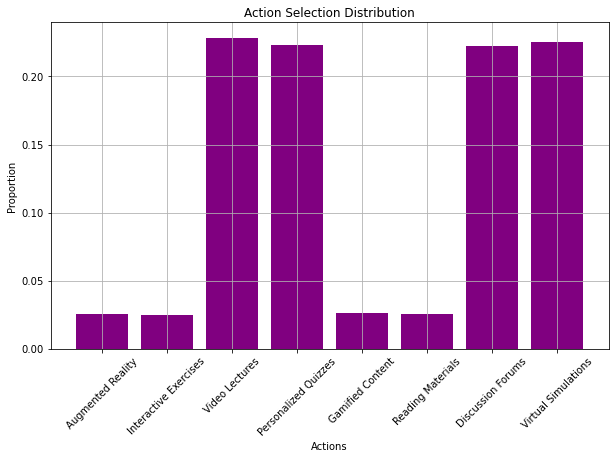

In [25]:
action_counts = np.zeros(len(actions))

for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)
    for _ in range(100):  # Limit steps per episode
        action_index = choose_action(state_index)
        action_counts[action_index] += 1
        state_index = random.randint(0, len(states) - 1)

# Normalize counts
action_distribution = action_counts / np.sum(action_counts)
plt.figure(figsize=(10, 6))
plt.bar(actions, action_distribution, color='purple')
plt.title('Action Selection Distribution')
plt.xlabel('Actions')
plt.ylabel('Proportion')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


ValueError: x and y must have same first dimension, but have shapes (1000,) and (0,)

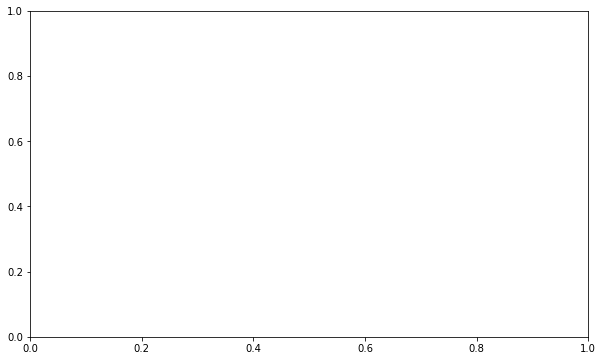

In [26]:
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), average_rewards_per_step, label='Average Reward per Step')
plt.title('Average Reward per Step Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Average Reward')
plt.legend()
plt.grid(True)
plt.show()


Learned Q-table:
[[482.86964307 477.51193492 479.06186    483.78039709 476.25267706
  478.32429693 474.5372086  480.72789612]
 [484.36820462 481.43553872 477.36453057 480.38042111 479.27604596
  483.02506111 487.65542567 486.10385055]
 [474.65961354 480.27766802 485.58359922 481.761504   478.23924466
  479.53030764 476.32296289 477.3930441 ]
 [483.53276325 485.87596528 478.03909548 482.36352925 479.95137032
  481.19028773 484.01734078 488.26207978]
 [480.31066952 479.79546971 478.78558183 484.51693339 486.06320988
  482.89280113 480.46581739 481.21206427]
 [486.37198686 483.42584042 488.39048588 482.05651215 485.81866431
  486.63656853 487.129474   485.07354796]
 [479.55676258 482.39936613 487.40274515 483.92694699 481.19292183
  484.81230294 479.06737851 479.63023991]
 [487.98271889 483.65830795 478.7281339  485.70496766 484.75650499
  482.24732807 486.08897828 486.51547297]
 [475.22516673 479.76786282 476.73682156 482.89720433 478.02438895
  481.43828444 476.65178273 477.48778488]
 [

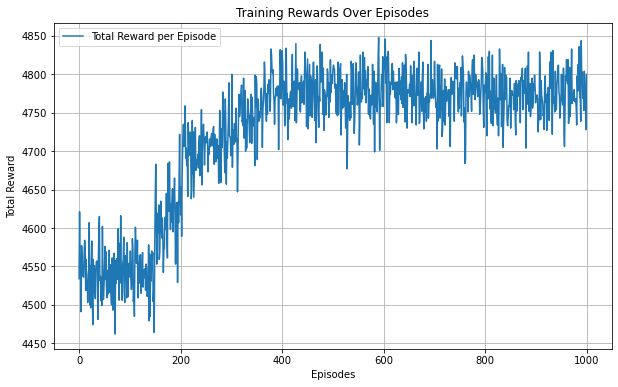

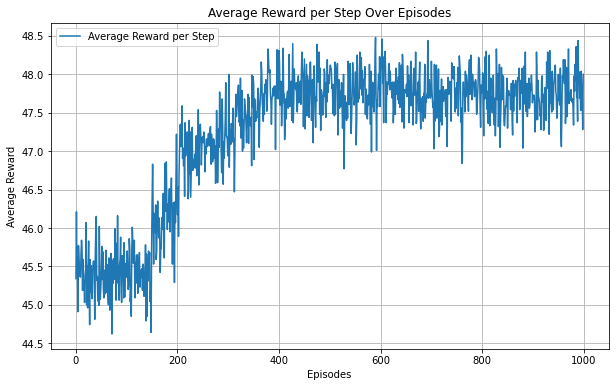

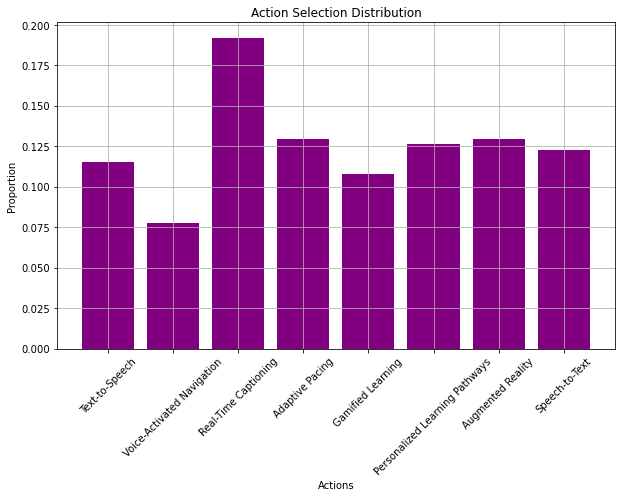

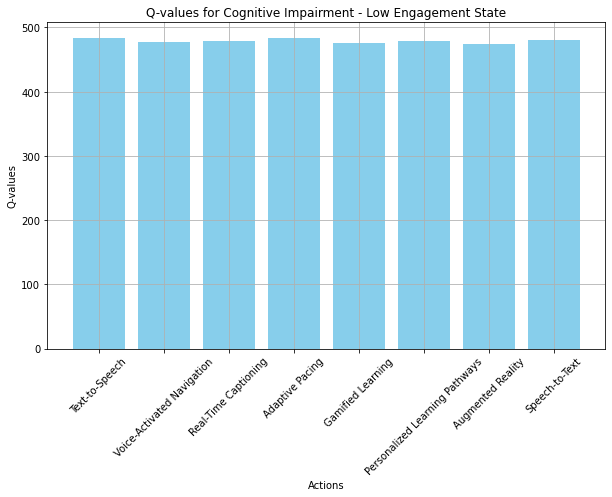

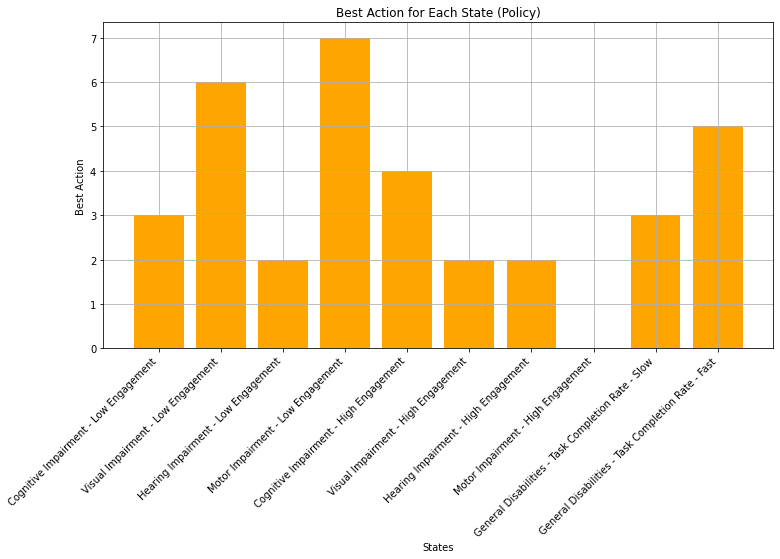

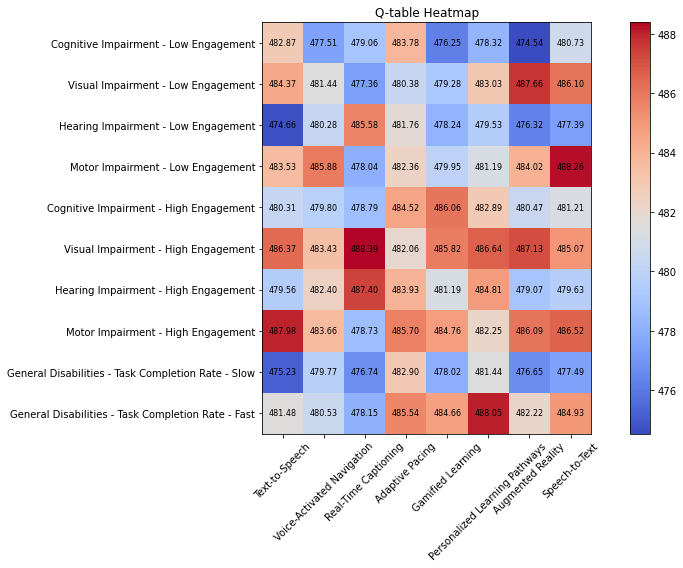

In [27]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes for training
success_threshold = 450  # Define a reward threshold for success

# Initialize variables for evaluation metrics
episode_rewards = []
average_rewards_per_step = []
successful_episodes = []
policy_stability = {state: [] for state in states}
action_counts = np.zeros(len(actions))

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    total_steps = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        total_steps += 1
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index

        # Track action counts
        action_counts[action_index] += 1
    
    # Store episode rewards
    episode_rewards.append(total_reward)
    average_rewards_per_step.append(total_reward / total_steps)
    
    # Track success rate
    if total_reward >= success_threshold:
        successful_episodes.append(1)
    else:
        successful_episodes.append(0)
    
    # Track policy stability
    for state_index, state in enumerate(states):
        best_action = np.argmax(q_table[state_index])
        policy_stability[state].append(best_action)

# Calculate evaluation metrics
success_rate = sum(successful_episodes) / num_episodes
policy_changes = {state: sum(np.diff(policy) != 0) for state, policy in policy_stability.items()}

# Output the learned Q-table
print("Learned Q-table:")
print(q_table)

# Example: Get the best action for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])

print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.") 

# Evaluation Metrics
print(f"\nSuccess Rate: {success_rate * 100:.2f}%")
print("Policy Stability (Number of Changes):")
for state, changes in policy_changes.items():
    print(f"{state}: {changes} changes")

# Visualize the metrics
# 1. Plot the rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), episode_rewards, label='Total Reward per Episode')
plt.title('Training Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Total Reward')
plt.legend()
plt.grid(True)
plt.show()

# 2. Plot Average Reward per Step
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), average_rewards_per_step, label='Average Reward per Step')
plt.title('Average Reward per Step Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Average Reward')
plt.legend()
plt.grid(True)
plt.show()

# 3. Plot Action Distribution
action_distribution = action_counts / np.sum(action_counts)
plt.figure(figsize=(10, 6))
plt.bar(actions, action_distribution, color='purple')
plt.title('Action Selection Distribution')
plt.xlabel('Actions')
plt.ylabel('Proportion')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# 4. Plot the Q-values of a specific state across all actions (Example: Cognitive Impairment - Low Engagement)
state_index = states.index("Cognitive Impairment - Low Engagement")
q_values_for_state = q_table[state_index]

plt.figure(figsize=(10, 6))
plt.bar(actions, q_values_for_state, color='skyblue')
plt.title('Q-values for Cognitive Impairment - Low Engagement State')
plt.xlabel('Actions')
plt.ylabel('Q-values')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# 5. Visualize the best action for each state (policy)
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(12, 6))
plt.bar(states, best_actions, color='orange')
plt.title('Best Action for Each State (Policy)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.show()

# 6. Heatmap of the Q-table with values
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='coolwarm', interpolation='nearest')
plt.title('Q-table Heatmap')

# Adding annotations (Q-values) inside the heatmap
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='black', fontsize=8)

plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.colorbar()
plt.tight_layout()
plt.show()


In [28]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix (simplified for demonstration)
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Define Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes for training
success_threshold = 450  # Define a reward threshold for success

# Initialize variables for evaluation metrics
episode_rewards = []
average_rewards_per_step = []
successful_episodes = []
policy_stability = {state: [] for state in states}
action_counts = np.zeros(len(actions))

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Simulate Q-learning over multiple episodes
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    total_reward = 0
    total_steps = 0
    
    # Simulate an episode
    for _ in range(100):  # Limit steps per episode
        # Choose action for current state
        action_index = choose_action(state_index)
        
        # Get reward for the state-action pair
        reward = rewards[states[state_index]][action_index]
        total_reward += reward
        total_steps += 1
        
        # Transition to the next state (random for simplicity)
        next_state_index = random.randint(0, len(states) - 1)
        
        # Update Q-value using Q-learning formula
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        
        # Transition to the next state
        state_index = next_state_index

        # Track action counts
        action_counts[action_index] += 1
    
    # Store episode rewards
    episode_rewards.append(total_reward)
    average_rewards_per_step.append(total_reward / total_steps)
    
    # Track success rate
    if total_reward >= success_threshold:
        successful_episodes.append(1)
    else:
        successful_episodes.append(0)
    
    # Track policy stability
    for state_index, state in enumerate(states):
        best_action = np.argmax(q_table[state_index])
        policy_stability[state].append(best_action)

# Calculate evaluation metrics
success_rate = sum(successful_episodes) / num_episodes
policy_changes = {state: sum(np.diff(policy) != 0) for state, policy in policy_stability.items()}

# Create a folder for saving images
output_folder = "training_plots"
os.makedirs(output_folder, exist_ok=True)

# Output the learned Q-table
print("Learned Q-table:")
print(q_table)

# Example: Get the best action for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])

print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.") 

# Evaluation Metrics
print(f"\nSuccess Rate: {success_rate * 100:.2f}%")
print("Policy Stability (Number of Changes):")
for state, changes in policy_changes.items():
    print(f"{state}: {changes} changes")

# Visualize the metrics
# 1. Plot the rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), episode_rewards, label='Total Reward per Episode')
plt.title('Training Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Total Reward')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(output_folder, 'rewards_over_episodes.png'))
plt.close()

# 2. Plot Average Reward per Step
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), average_rewards_per_step, label='Average Reward per Step')
plt.title('Average Reward per Step Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Average Reward')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(output_folder, 'average_reward_per_step.png'))
plt.close()

# 3. Plot Action Distribution
action_distribution = action_counts / np.sum(action_counts)
plt.figure(figsize=(10, 6))
plt.bar(actions, action_distribution, color='purple')
plt.title('Action Selection Distribution')
plt.xlabel('Actions')
plt.ylabel('Proportion')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(output_folder, 'action_distribution.png'))
plt.close()

# 4. Plot the Q-values of a specific state across all actions (Example: Cognitive Impairment - Low Engagement)
state_index = states.index("Cognitive Impairment - Low Engagement")
q_values_for_state = q_table[state_index]

plt.figure(figsize=(10, 6))
plt.bar(actions, q_values_for_state, color='skyblue')
plt.title('Q-values for Cognitive Impairment - Low Engagement State')
plt.xlabel('Actions')
plt.ylabel('Q-values')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(output_folder, 'q_values_for_state.png'))
plt.close()

# 5. Visualize the best action for each state (policy)
best_actions = np.argmax(q_table, axis=1)

plt.figure(figsize=(12, 6))
plt.bar(states, best_actions, color='orange')
plt.title('Best Action for Each State (Policy)')
plt.xlabel('States')
plt.ylabel('Best Action')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(output_folder, 'best_action_for_each_state.png'))
plt.close()

# 6. Heatmap of the Q-table with values
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='coolwarm', interpolation='nearest')
plt.title('Q-table Heatmap')

# Adding annotations (Q-values) inside the heatmap
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='black', fontsize=8)

plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.colorbar()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, 'q_table_heatmap.png'))
plt.close()

print(f"Plots have been saved in the folder: {output_folder}")


Learned Q-table:
[[481.51225601 477.71301398 479.04466871 483.68879565 476.92079547
  478.21023186 474.78221503 480.8571762 ]
 [483.93709251 481.42171361 477.78639813 480.43133346 479.2318725
  482.41620487 486.8921304  485.94316113]
 [475.78178763 480.34795423 485.63647482 481.36979118 478.57274112
  479.20226135 476.59816122 477.60099638]
 [483.69578891 485.55941894 478.84520048 482.05815367 480.22130633
  480.74440724 483.33669224 487.41920544]
 [479.88407132 479.16564736 477.47983386 484.29461712 486.09377603
  482.66734621 480.77959815 481.46573039]
 [486.23560123 484.06946383 486.60405453 482.62986396 485.60662597
  486.31302393 488.29025095 485.23875836]
 [479.88083275 482.41066918 487.34798958 483.4590188  481.40646327
  484.52427437 478.03862608 480.38645224]
 [487.10136611 483.35248651 479.21684001 485.95918197 483.59295584
  482.37878715 486.2697348  486.34159471]
 [475.59268056 478.99629365 478.11153204 482.51938857 478.2761129
  480.94780437 476.50483166 477.48752841]
 [48

# DQN

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
import random
from collections import deque

# Environment setup (as per your problem space)
states = ["Cognitive Impairment - Low Engagement", "Visual Impairment - Low Engagement", "Hearing Impairment - Low Engagement",
          "Motor Impairment - Low Engagement", "Cognitive Impairment - High Engagement", "Visual Impairment - High Engagement",
          "Hearing Impairment - High Engagement", "Motor Impairment - High Engagement", "General Disabilities - Task Completion Rate - Slow",
          "General Disabilities - Task Completion Rate - Fast"]
actions = ["Gamified Learning", "Interactive Video Lessons", "Augmented Reality", "Collaborative Tasks", "Text-to-Speech Tools", "Sign Language Videos",
           "Accessible Writing Tools", "Gesture-Based Interfaces"]

num_states = len(states)
num_actions = len(actions)

# Hyperparameters
gamma = 0.95
epsilon = 1.0
epsilon_min = 0.01
epsilon_decay = 0.995
batch_size = 32
learning_rate = 0.001
episodes = 500
max_steps = 100

# Neural Network for Q-value approximation
def create_model():
    model = Sequential([
        Dense(24, input_dim=num_states, activation='relu'),
        Dense(24, activation='relu'),
        Dense(num_actions, activation='linear')
    ])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss='mse')
    return model

# Initialize models
model = create_model()
target_model = create_model()
target_model.set_weights(model.get_weights())  # Sync weights initially

# Replay buffer
replay_buffer = deque(maxlen=2000)

# Environment simulation
def simulate_environment(state, action):
    # Example reward mechanism
    if actions[action] == "Augmented Reality" and "Visual" in states[state]:
        reward = 10  # High reward for a suitable action
    else:
        reward = random.uniform(-1, 1)  # General rewards
    next_state = random.randint(0, num_states - 1)  # Random next state
    done = random.random() < 0.1  # Randomly mark as done
    return next_state, reward, done

# Experience replay
def train_dqn():
    if len(replay_buffer) < batch_size:
        return
    batch = random.sample(replay_buffer, batch_size)
    states_mb, actions_mb, rewards_mb, next_states_mb, dones_mb = zip(*batch)

    states_mb = np.array(states_mb)
    next_states_mb = np.array(next_states_mb)

    # Predict Q-values
    q_values = model.predict(states_mb)
    q_next = target_model.predict(next_states_mb)

    for i in range(batch_size):
        q_target = rewards_mb[i]
        if not dones_mb[i]:
            q_target += gamma * np.max(q_next[i])
        q_values[i][actions_mb[i]] = q_target

    model.fit(states_mb, q_values, epochs=1, verbose=0)

# Training loop
for episode in range(episodes):
    state = random.randint(0, num_states - 1)  # Start with a random state
    for step in range(max_steps):
        # Epsilon-greedy policy
        if np.random.rand() < epsilon:
            action = random.randint(0, num_actions - 1)
        else:
            q_values = model.predict(np.array([state]))
            action = np.argmax(q_values[0])

        # Take action and observe
        next_state, reward, done = simulate_environment(state, action)
        replay_buffer.append((state, action, reward, next_state, done))

        # Train model
        train_dqn()

        state = next_state
        if done:
            break

    # Decay epsilon
    if epsilon > epsilon_min:
        epsilon *= epsilon_decay

    # Update target model
    if episode % 10 == 0:
        target_model.set_weights(model.get_weights())

    # Log progress
    if episode % 50 == 0:
        print(f"Episode {episode}, Epsilon: {epsilon}")

print("Training Complete")


C:\Users\Samina\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\Samina\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (


Episode 0, Epsilon: 0.995


ValueError: in user code:

    File "C:\Users\Samina\anaconda3\lib\site-packages\keras\engine\training.py", line 2041, in predict_function  *
        return step_function(self, iterator)
    File "C:\Users\Samina\anaconda3\lib\site-packages\keras\engine\training.py", line 2027, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\Samina\anaconda3\lib\site-packages\keras\engine\training.py", line 2015, in run_step  **
        outputs = model.predict_step(data)
    File "C:\Users\Samina\anaconda3\lib\site-packages\keras\engine\training.py", line 1983, in predict_step
        return self(x, training=False)
    File "C:\Users\Samina\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "C:\Users\Samina\anaconda3\lib\site-packages\keras\engine\input_spec.py", line 250, in assert_input_compatibility
        raise ValueError(

    ValueError: Exception encountered when calling layer "sequential" "                 f"(type Sequential).
    
    Input 0 of layer "dense" is incompatible with the layer: expected min_ndim=2, found ndim=1. Full shape received: (32,)
    
    Call arguments received by layer "sequential" "                 f"(type Sequential):
      • inputs=tf.Tensor(shape=(32,), dtype=int32)
      • training=False
      • mask=None


In [2]:
import numpy as np
import random
from collections import deque
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Define environment parameters
num_states = 10  # Example number of states
num_actions = 8  # Example number of actions
gamma = 0.99     # Discount factor
epsilon = 1.0    # Exploration rate
epsilon_min = 0.01
epsilon_decay = 0.995
learning_rate = 0.001
batch_size = 32
max_episodes = 500

# Replay buffer
replay_buffer = deque(maxlen=2000)

# Create Q-Network
def create_model():
    model = Sequential()
    model.add(Dense(24, input_dim=num_states, activation='relu'))
    model.add(Dense(24, activation='relu'))
    model.add(Dense(num_actions, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse')
    return model

# Initialize Q-Network and target network
model = create_model()
target_model = create_model()
target_model.set_weights(model.get_weights())

# One-hot encoding function
def one_hot_encode(state, num_states):
    encoded = np.zeros(num_states)
    encoded[state] = 1
    return encoded

# Training function
def train_dqn():
    if len(replay_buffer) < batch_size:
        return
    batch = random.sample(replay_buffer, batch_size)
    states_mb, actions_mb, rewards_mb, next_states_mb, dones_mb = zip(*batch)

    # One-hot encode states
    states_mb = np.array([one_hot_encode(state, num_states) for state in states_mb])
    next_states_mb = np.array([one_hot_encode(next_state, num_states) for next_state in next_states_mb])

    # Predict Q-values
    q_values = model.predict(states_mb)
    q_next = target_model.predict(next_states_mb)

    for i in range(batch_size):
        q_target = rewards_mb[i]
        if not dones_mb[i]:
            q_target += gamma * np.max(q_next[i])
        q_values[i][actions_mb[i]] = q_target

    model.fit(states_mb, q_values, epochs=1, verbose=0)

# Main training loop
for episode in range(max_episodes):
    state = np.random.randint(0, num_states)  # Random initial state
    total_reward = 0
    done = False

    while not done:
        # One-hot encode the state
        state_vector = one_hot_encode(state, num_states)

        # Select action
        if np.random.rand() < epsilon:
            action = random.randint(0, num_actions - 1)
        else:
            q_values = model.predict(np.array([state_vector]))
            action = np.argmax(q_values[0])

        # Simulate environment step (replace this with your environment logic)
        next_state = np.random.randint(0, num_states)
        reward = np.random.random()
        done = np.random.choice([True, False], p=[0.1, 0.9])  # Example stopping condition

        # Store transition in replay buffer
        replay_buffer.append((state, action, reward, next_state, done))

        # Train the model
        train_dqn()

        state = next_state
        total_reward += reward

    # Update target model weights
    if episode % 10 == 0:
        target_model.set_weights(model.get_weights())

    # Decay epsilon
    if epsilon > epsilon_min:
        epsilon *= epsilon_decay

    # Print progress
    print(f"Episode {episode}, Total Reward: {total_reward:.2f}, Epsilon: {epsilon:.3f}")

print("Training completed.")


Episode 0, Total Reward: 1.89, Epsilon: 0.995
Episode 1, Total Reward: 0.35, Epsilon: 0.990
Episode 2, Total Reward: 5.65, Epsilon: 0.985
1/1 [==============================] - 0s 33ms/step
Episode 3, Total Reward: 8.52, Epsilon: 0.980
1/1 [==============================] - 0s 30ms/step
Episode 4, Total Reward: 0.64, Epsilon: 0.975
1/1 [==============================] - 0s 30ms/step
Episode 5, Total Reward: 2.14, Epsilon: 0.970
1/1 [==============================] - 0s 31ms/step
Episode 6, Total Reward: 6.26, Epsilon: 0.966
1/1 [==============================] - 0s 41ms/step
Episode 7, Total Reward: 0.79, Epsilon: 0.961
1/1 [==============================] - 0s 44ms/step
Episode 8, Total Reward: 3.41, Epsilon: 0.956
1/1 [==============================] - 0s 29ms/step
Episode 9, Total Reward: 7.21, Epsilon: 0.951
1/1 [==============================] - 0s 26ms/step
Episode 10, Total Reward: 6.64, Epsilon: 0.946
1/1 [==============================] - 0s 152ms/step
Episode 11, Total Reward

1/1 [==============================] - 0s 24ms/step
Episode 22, Total Reward: 10.05, Epsilon: 0.891
1/1 [==============================] - 0s 23ms/step
Episode 23, Total Reward: 2.67, Epsilon: 0.887
1/1 [==============================] - 0s 25ms/step
Episode 24, Total Reward: 0.52, Epsilon: 0.882
1/1 [==============================] - 0s 24ms/step
Episode 25, Total Reward: 5.20, Epsilon: 0.878
1/1 [==============================] - 0s 24ms/step
Episode 26, Total Reward: 2.33, Epsilon: 0.873
1/1 [==============================] - 0s 26ms/step
Episode 27, Total Reward: 4.02, Epsilon: 0.869
1/1 [==============================] - 0s 24ms/step
Episode 28, Total Reward: 8.04, Epsilon: 0.865
1/1 [==============================] - 0s 32ms/step
Episode 29, Total Reward: 8.07, Epsilon: 0.860
1/1 [==============================] - 0s 41ms/step
Episode 30, Total Reward: 1.92, Epsilon: 0.856
1/1 [==============================] - 0s 47ms/step
Episode 31, Total Reward: 1.79, Epsilon: 0.852
1/1 [====

1/1 [==============================] - 0s 33ms/step
Episode 40, Total Reward: 17.32, Epsilon: 0.814
1/1 [==============================] - 0s 25ms/step
Episode 41, Total Reward: 0.96, Epsilon: 0.810
1/1 [==============================] - 0s 38ms/step
Episode 42, Total Reward: 0.10, Epsilon: 0.806
1/1 [==============================] - 0s 24ms/step
Episode 43, Total Reward: 1.64, Epsilon: 0.802
1/1 [==============================] - 0s 24ms/step
Episode 44, Total Reward: 4.03, Epsilon: 0.798
1/1 [==============================] - 0s 25ms/step
Episode 45, Total Reward: 2.15, Epsilon: 0.794
1/1 [==============================] - 0s 25ms/step
Episode 46, Total Reward: 4.04, Epsilon: 0.790
1/1 [==============================] - 0s 25ms/step
Episode 47, Total Reward: 10.29, Epsilon: 0.786
1/1 [==============================] - 0s 31ms/step
Episode 48, Total Reward: 3.34, Epsilon: 0.782
1/1 [==============================] - 0s 34ms/step
Episode 49, Total Reward: 6.72, Epsilon: 0.778
1/1 [===

1/1 [==============================] - 0s 30ms/step
Episode 55, Total Reward: 1.28, Epsilon: 0.755
1/1 [==============================] - 0s 25ms/step
Episode 56, Total Reward: 3.17, Epsilon: 0.751
1/1 [==============================] - 0s 30ms/step
Episode 57, Total Reward: 7.55, Epsilon: 0.748
1/1 [==============================] - 0s 31ms/step
Episode 58, Total Reward: 0.93, Epsilon: 0.744
1/1 [==============================] - 0s 25ms/step
Episode 59, Total Reward: 9.51, Epsilon: 0.740
1/1 [==============================] - 0s 28ms/step
Episode 60, Total Reward: 1.15, Epsilon: 0.737
1/1 [==============================] - 0s 24ms/step
Episode 61, Total Reward: 3.42, Epsilon: 0.733
1/1 [==============================] - 0s 25ms/step
Episode 62, Total Reward: 8.96, Epsilon: 0.729
1/1 [==============================] - 0s 29ms/step
Episode 63, Total Reward: 6.69, Epsilon: 0.726
1/1 [==============================] - 0s 33ms/step
Episode 64, Total Reward: 2.76, Epsilon: 0.722
1/1 [=====


KeyboardInterrupt



In [3]:
import numpy as np
import random
from collections import deque
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# ------------------------------
# Define Environment
# ------------------------------

# Number of states (e.g., different learning challenges or conditions)
num_states = 10  

# Number of actions (e.g., different strategies like video lectures, text-based resources, quizzes, etc.)
num_actions = 8  

# Explicit state and action mappings (for interpretability)
state_labels = {i: f"State {chr(65 + i)}" for i in range(num_states)}
action_labels = {
    0: "Video Lecture", 1: "Text Resource", 2: "Quiz", 3: "Interactive Exercise",
    4: "Group Discussion", 5: "One-on-One Support", 6: "Gamified Learning", 7: "Review Material"
}

# Simulated reward structure for personalized learning strategies
def reward_function(state, action):
    """
    Simulates the reward for a given state and action.
    For example, certain strategies are more effective for specific states.
    """
    rewards_matrix = np.random.rand(num_states, num_actions)  # Random rewards
    return rewards_matrix[state, action]

# Simulates environment transitions
def next_state(current_state, action):
    """
    Determines the next state based on the current state and action.
    Simulates changing student conditions or progress.
    """
    return (current_state + action) % num_states  # Simple transition logic

# ------------------------------
# DQN Implementation
# ------------------------------

class DQNAgent:
    def __init__(self, state_size, action_size):
        self.state_size = state_size
        self.action_size = action_size
        self.memory = deque(maxlen=2000)
        self.gamma = 0.95  # Discount factor
        self.epsilon = 1.0  # Exploration rate
        self.epsilon_decay = 0.995
        self.epsilon_min = 0.01
        self.learning_rate = 0.001
        self.batch_size = 32
        self.model = self._build_model()
        self.target_model = self._build_model()
        self.update_target_model()

    def _build_model(self):
        """Builds the neural network model."""
        model = Sequential([
            Dense(24, input_dim=self.state_size, activation='relu'),
            Dense(24, activation='relu'),
            Dense(self.action_size, activation='linear')
        ])
        model.compile(optimizer=Adam(learning_rate=self.learning_rate), loss='mse')
        return model

    def update_target_model(self):
        """Updates the target model with the weights of the main model."""
        self.target_model.set_weights(self.model.get_weights())

    def act(self, state):
        """Selects an action based on epsilon-greedy policy."""
        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_size)
        q_values = self.model.predict(state)
        return np.argmax(q_values[0])

    def train(self):
        """Trains the model using replay buffer."""
        if len(self.memory) < self.batch_size:
            return
        minibatch = random.sample(self.memory, self.batch_size)
        for state, action, reward, next_state, done in minibatch:
            target = self.model.predict(state)
            if done:
                target[0][action] = reward
            else:
                t = self.target_model.predict(next_state)[0]
                target[0][action] = reward + self.gamma * np.amax(t)
            self.model.fit(state, target, epochs=1, verbose=0)

    def remember(self, state, action, reward, next_state, done):
        """Stores experiences in replay buffer."""
        self.memory.append((state, action, reward, next_state, done))

# ------------------------------
# Training Loop
# ------------------------------

# Initialize agent
agent = DQNAgent(state_size=num_states, action_size=num_actions)

# Training parameters
episodes = 10
max_steps = 50

for episode in range(episodes):
    state = np.zeros(num_states)
    current_state = random.randint(0, num_states - 1)
    state[current_state] = 1  # One-hot encode initial state
    state = np.reshape(state, [1, num_states])  # Reshape for input

    for step in range(max_steps):
        action = agent.act(state)
        reward = reward_function(current_state, action)
        next_current_state = next_state(current_state, action)
        next_state_vec = np.zeros(num_states)
        next_state_vec[next_current_state] = 1
        next_state_vec = np.reshape(next_state_vec, [1, num_states])

        done = step == max_steps - 1  # End episode after max steps
        agent.remember(state, action, reward, next_state_vec, done)
        state = next_state_vec
        current_state = next_current_state

        if done:
            agent.update_target_model()
            print(f"Episode {episode}/{episodes}, Epsilon: {agent.epsilon:.2f}")
            break

    agent.train()
    if agent.epsilon > agent.epsilon_min:
        agent.epsilon *= agent.epsilon_decay

# ------------------------------
# Testing & Recommendations
# ------------------------------

# Example: Using the trained model to suggest a strategy
test_state = np.zeros(num_states)
test_state[2] = 1  # Assume starting from "State C"
test_state = np.reshape(test_state, [1, num_states])

predicted_q_values = agent.model.predict(test_state)
best_action = np.argmax(predicted_q_values[0])

print(f"Recommended Strategy for {state_labels[2]}: {action_labels[best_action]}")


Episode 0/10, Epsilon: 1.00
1/1 [==============================] - 0s 54ms/step
Episode 1/10, Epsilon: 0.99
1/1 [==============================] - 0s 26ms/step
Episode 2/10, Epsilon: 0.99
1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 33ms/step
Episode 3/10, Epsilon: 0.99
1/1 [==============================] - 0s 24ms/step
Episode 4/10, Epsilon: 0.98
1/1 [==============================] - 0s 25ms/step
Episode 5/10, Epsilon: 0.98
1/1 [==============================] - 0s 27ms/step
Episode 6/10, Epsilon: 0.97
1/1 [==============================] - 0s 36ms/step
Episode 7/10, Epsilon: 0.97
1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 30ms/step
Episode 8/10, Epsilon: 0.96
1/1 [==============================] - 0s 27ms/step
Episode 9/10, Epsilon: 0.96
1/1 [==============================] - 0s 27ms/step
Recommended Strategy for State C: Interactive Exercise


Learned Q-table:
[[481.42156942 477.02484262 479.36658388 483.86893867 476.31905917
  478.49602731 473.94499171 480.11513316]
 [483.10502679 480.74766733 476.75685628 480.23087424 478.96949196
  482.55768748 486.93603201 485.69989365]
 [474.75737091 479.93553386 486.31829381 481.41678584 478.45761935
  478.89004523 475.89818706 476.62306776]
 [482.95445776 485.61572885 477.93784593 481.89934591 479.17461211
  480.96728425 483.24891155 487.56553113]
 [480.44715403 479.09234508 478.28771718 484.21483386 485.59838139
  481.74252428 480.1945347  480.45486443]
 [485.56460574 484.05022111 487.42125516 482.35358631 484.63494149
  485.87547687 486.97605122 484.84959491]
 [478.82754767 481.94796681 486.55622706 482.88613953 481.12272541
  484.2206714  477.69007948 480.0485811 ]
 [487.65593204 481.80310882 479.0371263  485.38039387 484.1817883
  481.96222443 485.48156885 486.11689911]
 [474.58349575 478.39254605 477.04215107 482.98899642 478.17257998
  480.52168247 476.18921641 477.07587938]
 [4

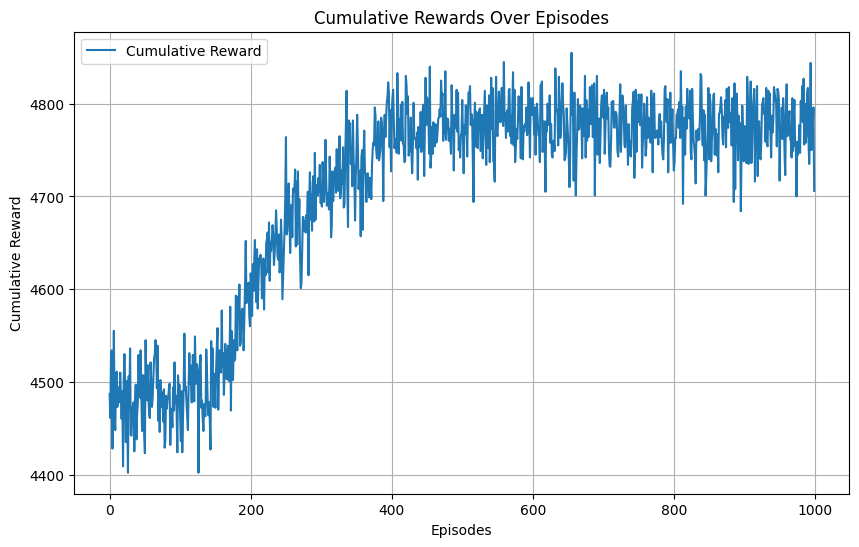

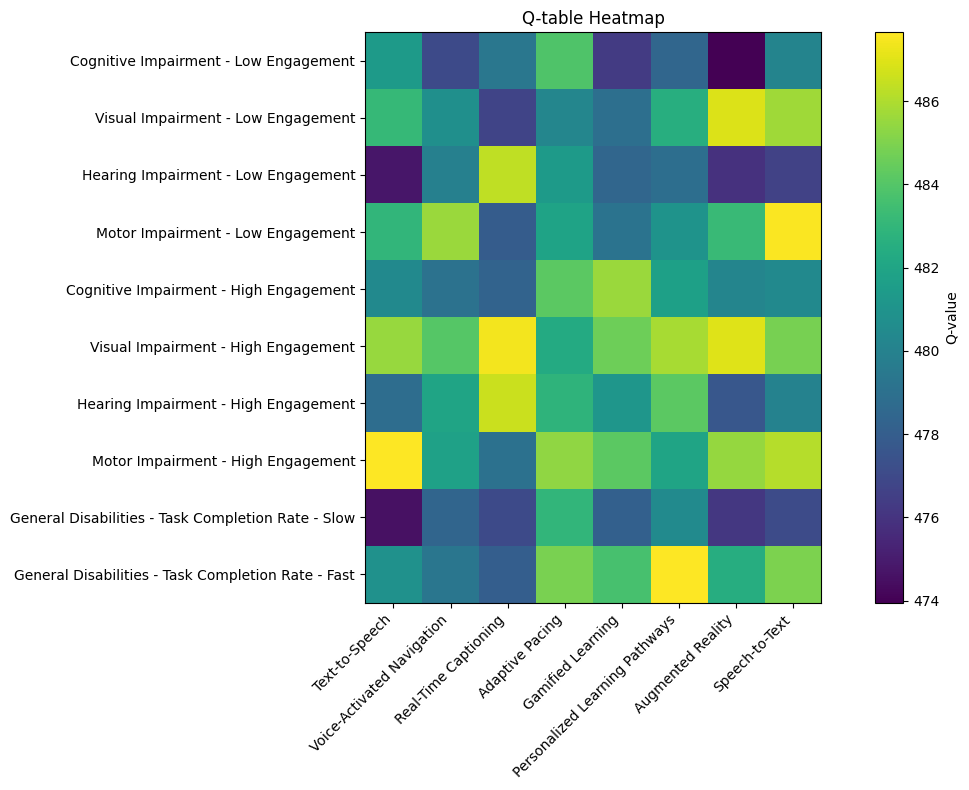

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes

# Tracking cumulative rewards
cumulative_rewards = []

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Training process
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Random initial state
    episode_reward = 0  # Track cumulative reward for the episode
    
    for _ in range(100):  # Limit steps per episode
        action_index = choose_action(state_index)
        reward = rewards[states[state_index]][action_index]
        episode_reward += reward
        
        next_state_index = random.randint(0, len(states) - 1)  # Transition randomly
        
        # Q-learning update
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        state_index = next_state_index  # Move to the next state
    
    cumulative_rewards.append(episode_reward)  # Store cumulative reward for this episode

# Display learned Q-table
print("Learned Q-table:")
print(q_table)

# Plot cumulative rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), cumulative_rewards, label="Cumulative Reward")
plt.title("Cumulative Rewards Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Reward")
plt.legend()
plt.grid()
plt.show()

# Heatmap of the Q-table
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap="viridis", interpolation="nearest")
plt.colorbar(label="Q-value")
plt.xticks(ticks=np.arange(len(actions)), labels=actions, rotation=45, ha="right")
plt.yticks(ticks=np.arange(len(states)), labels=states)
plt.title("Q-table Heatmap")
plt.tight_layout()
plt.show()


In [ ]:
# Calculate cumulative rewards
cumulative_rewards = np.cumsum(episode_rewards)

plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), cumulative_rewards, label='Cumulative Reward')
plt.title('Cumulative Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Cumulative Reward')
plt.legend()
plt.grid(True)
plt.show()


NameError: name 'episode_rewards' is not defined

In [ ]:
# Calculate rolling success rate
window_size = 50
rolling_success_rate = [
    sum(successful_episodes[max(0, i - window_size):i]) / window_size
    for i in range(num_episodes)
]

plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), rolling_success_rate, label='Rolling Success Rate', color='green')
plt.title('Rolling Success Rate Over Time')
plt.xlabel('Episodes')
plt.ylabel('Success Rate')
plt.legend()
plt.grid(True)
plt.show()


NameError: name 'successful_episodes' is not defined

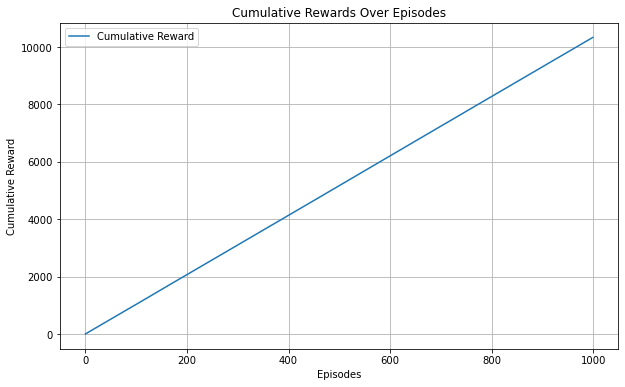

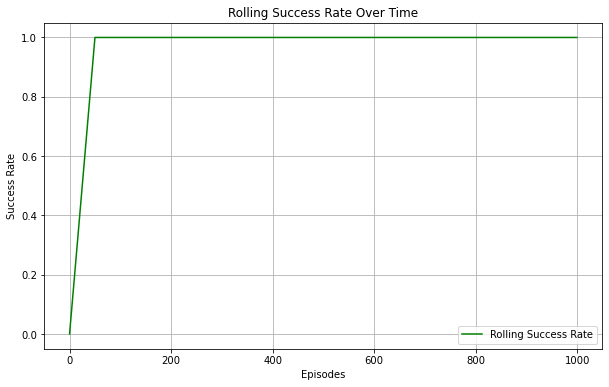

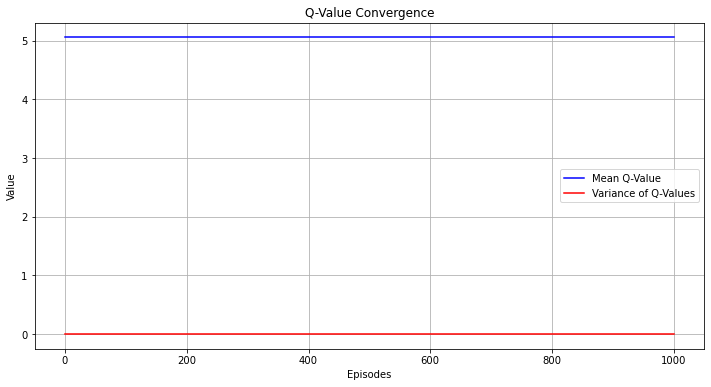

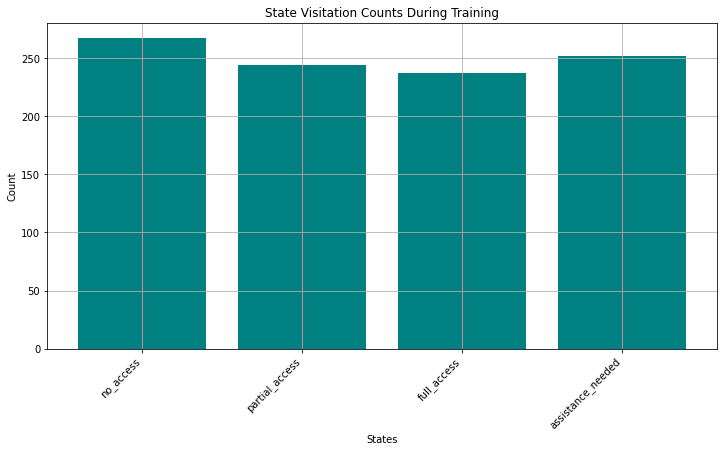

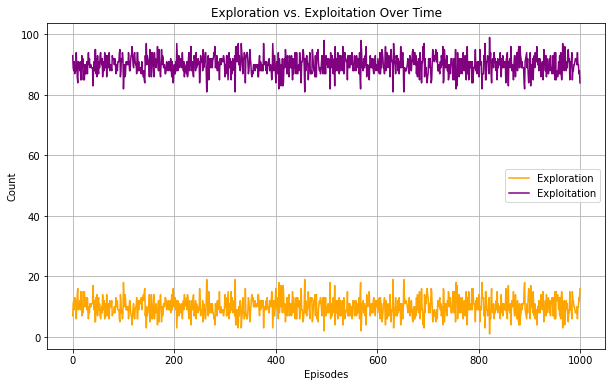

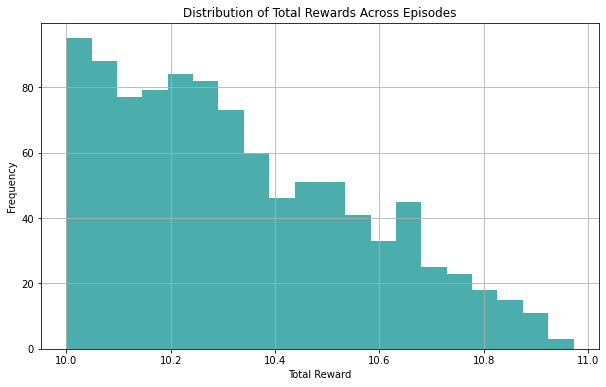

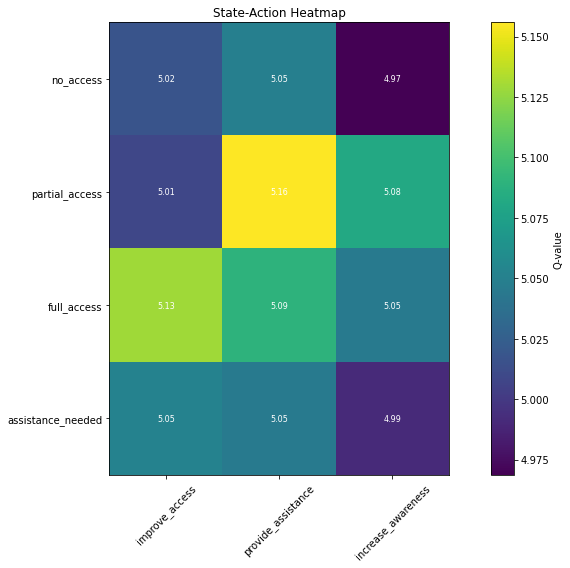

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import random

# Define the environment with disability-related states and actions
states = ["no_access", "partial_access", "full_access", "assistance_needed"]
actions = ["improve_access", "provide_assistance", "increase_awareness"]
q_table = np.zeros((len(states), len(actions)))

# Define parameters
num_episodes = 1000
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.1  # Exploration-exploitation trade-off

# Initialize rewards and success tracking
episode_rewards = []
successful_episodes = []

# Simulate environment and Q-learning
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)
    total_reward = 0
    done = False

    while not done:
        if random.uniform(0, 1) < epsilon:
            action_index = random.randint(0, len(actions) - 1)  # Exploration
        else:
            action_index = np.argmax(q_table[state_index])  # Exploitation

        # Simulate the environment's response
        reward = random.uniform(0, 1)  # Placeholder reward
        total_reward += reward
        next_state_index = (state_index + 1) % len(states)  # Placeholder state transition
        q_table[state_index, action_index] += learning_rate * (reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index])

        state_index = next_state_index
        if total_reward > 10:  # Placeholder condition to end episode
            done = True

    episode_rewards.append(total_reward)
    successful_episodes.append(1 if total_reward > 10 else 0)  # Success condition

# 1. Plot Cumulative Rewards Over Episodes
cumulative_rewards = np.cumsum(episode_rewards)

plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), cumulative_rewards, label='Cumulative Reward')
plt.title('Cumulative Rewards Over Episodes')
plt.xlabel('Episodes')
plt.ylabel('Cumulative Reward')
plt.legend()
plt.grid(True)
plt.show()

# 2. Plot Rolling Success Rate
window_size = 50
rolling_success_rate = [
    sum(successful_episodes[max(0, i - window_size):i]) / window_size
    for i in range(num_episodes)
]

plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), rolling_success_rate, label='Rolling Success Rate', color='green')
plt.title('Rolling Success Rate Over Time')
plt.xlabel('Episodes')
plt.ylabel('Success Rate')
plt.legend()
plt.grid(True)
plt.show()

# 3. Plot Q-Value Convergence (Mean and Variance)
mean_q_values = [np.mean(q_table)]
variance_q_values = [np.var(q_table)]

for _ in range(num_episodes):
    mean_q_values.append(np.mean(q_table))
    variance_q_values.append(np.var(q_table))

plt.figure(figsize=(12, 6))
plt.plot(mean_q_values, label='Mean Q-Value', color='blue')
plt.plot(variance_q_values, label='Variance of Q-Values', color='red')
plt.title('Q-Value Convergence')
plt.xlabel('Episodes')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

# 4. Plot State Visitation Counts During Training
state_visitation_counts = np.zeros(len(states))

for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)
    state_visitation_counts[state_index] += 1

plt.figure(figsize=(12, 6))
plt.bar(states, state_visitation_counts, color='teal')
plt.title('State Visitation Counts During Training')
plt.xlabel('States')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.show()

# 5. Plot Exploration vs. Exploitation Over Time
exploration_counts = []
exploitation_counts = []

for episode in range(num_episodes):
    exploration = 0
    exploitation = 0
    for _ in range(100):  # Limit steps per episode
        if random.uniform(0, 1) < epsilon:
            exploration += 1
        else:
            exploitation += 1
    exploration_counts.append(exploration)
    exploitation_counts.append(exploitation)

plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), exploration_counts, label='Exploration', color='orange')
plt.plot(range(num_episodes), exploitation_counts, label='Exploitation', color='purple')
plt.title('Exploration vs. Exploitation Over Time')
plt.xlabel('Episodes')
plt.ylabel('Count')
plt.legend()
plt.grid(True)
plt.show()

# 6. Plot Distribution of Total Rewards Across Episodes
plt.figure(figsize=(10, 6))
plt.hist(episode_rewards, bins=20, color='darkcyan', alpha=0.7)
plt.title('Distribution of Total Rewards Across Episodes')
plt.xlabel('Total Reward')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 7. Plot State-Action Heatmap
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap='viridis', interpolation='nearest')
plt.title('State-Action Heatmap')
plt.colorbar(label='Q-value')

# Adding annotations (Q-values)
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='white', fontsize=8)

plt.xticks(np.arange(len(actions)), actions, rotation=45)
plt.yticks(np.arange(len(states)), states)
plt.tight_layout()
plt.show()


Learned Q-table:
[[481.91782157 477.20163298 479.37513711 483.40262627 476.9396053
  478.39342127 473.88005375 480.07877485]
 [484.8399303  480.71773089 476.97788539 479.87273694 480.01197126
  482.35670694 487.41570498 485.50896419]
 [475.74711327 480.14522798 486.15483645 481.20364859 478.979488
  479.38157541 476.16213691 476.58846265]
 [482.92873371 486.58037139 478.65062912 482.82969597 479.28590761
  481.71360341 483.69776653 487.63253205]
 [480.20743975 479.20936534 478.10782223 484.44040379 485.41085073
  482.32048331 480.36618746 481.12312169]
 [485.61420968 485.19832783 486.76345786 482.6995456  485.57372578
  485.15486983 486.86262638 485.25406349]
 [479.59522406 482.34946844 486.86824983 483.65918314 480.59640373
  483.97639765 478.2981317  479.88530904]
 [487.46100065 482.9765279  479.74005728 485.96150189 484.3924873
  481.98606009 486.35619703 485.52768564]
 [475.37790179 479.22604446 477.87676332 482.55385188 478.66803167
  481.52883069 476.17567724 477.18502926]
 [481.

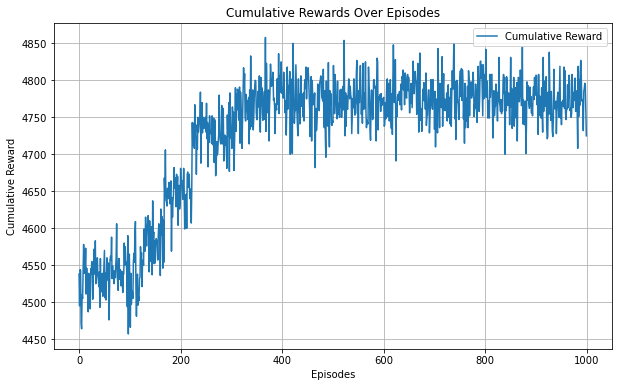

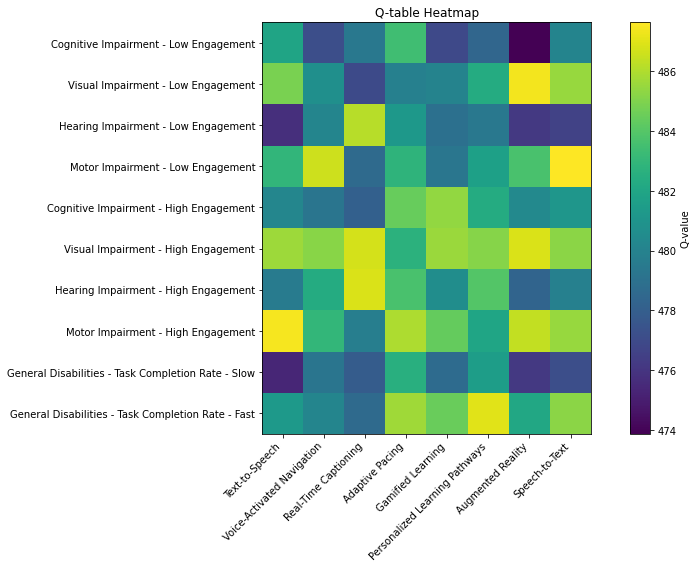

In [8]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes

# Tracking cumulative rewards
cumulative_rewards = []

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    if random.uniform(0, 1) < epsilon:  # Explore
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        return np.argmax(q_table[state_index])

# Training process
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Random initial state
    episode_reward = 0  # Track cumulative reward for the episode
    
    for _ in range(100):  # Limit steps per episode
        action_index = choose_action(state_index)
        reward = rewards[states[state_index]][action_index]
        episode_reward += reward
        
        next_state_index = random.randint(0, len(states) - 1)  # Transition randomly
        
        # Q-learning update
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        state_index = next_state_index  # Move to the next state
    
    cumulative_rewards.append(episode_reward)  # Store cumulative reward for this episode

# Display learned Q-table
print("Learned Q-table:")
print(q_table)

# Plot cumulative rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), cumulative_rewards, label="Cumulative Reward")
plt.title("Cumulative Rewards Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Reward")
plt.legend()
plt.grid()
plt.show()

# Heatmap of the Q-table
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap="viridis", interpolation="nearest")
plt.colorbar(label="Q-value")
plt.xticks(ticks=np.arange(len(actions)), labels=actions, rotation=45, ha="right")
plt.yticks(ticks=np.arange(len(states)), labels=states)
plt.title("Q-table Heatmap")
plt.tight_layout()
plt.show()


Learned Q-table:
[[481.37795922 477.72946276 478.62756733 483.79173402 476.31951044
  477.87326953 474.16159178 480.61294919]
 [484.48203292 480.7673439  476.89369274 480.05267201 479.22177191
  482.41910424 487.94288448 485.64254178]
 [474.86469222 479.92885805 485.28323461 480.64757936 478.11725108
  478.84125568 476.35576724 476.1655758 ]
 [483.02555944 486.13283054 478.34640789 482.85861694 479.10073515
  481.04383417 483.29076181 487.87798564]
 [480.18763359 479.02003989 478.34685709 483.8835564  484.89126338
  481.92819507 480.80059338 481.55911946]
 [486.0242396  484.25398883 486.27737632 481.74250722 485.00583469
  485.96648605 487.25825233 484.9573307 ]
 [479.18715093 482.2445694  486.61831587 483.06710547 481.39816709
  484.05488827 478.11419    480.08989787]
 [488.19373733 483.11576832 479.00081625 484.97522605 484.49981976
  482.43214018 486.40392075 485.19576502]
 [474.87600148 479.65591956 477.20194501 482.7549294  478.17735216
  480.97931911 476.37769741 477.4193933 ]
 [

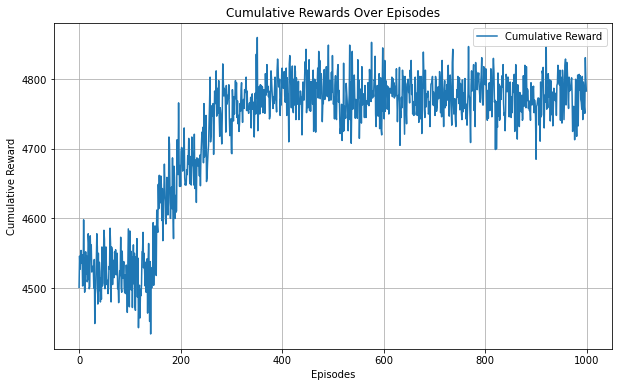

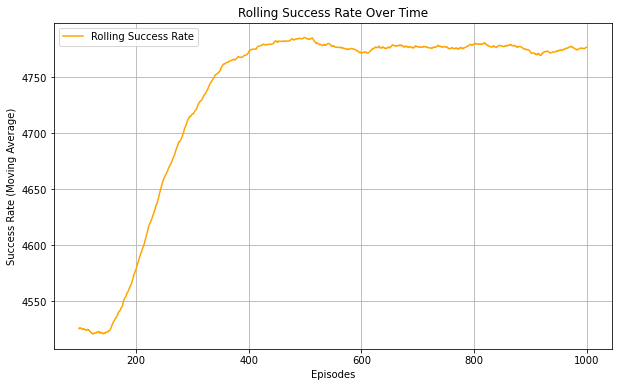

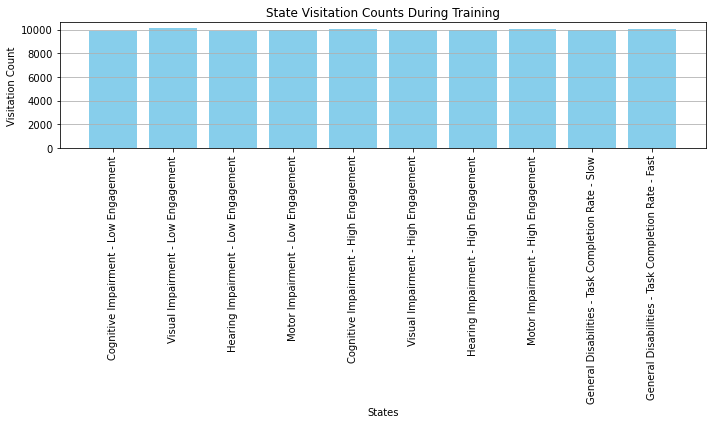

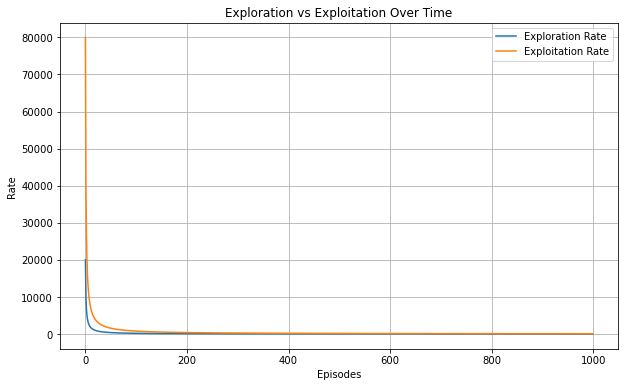

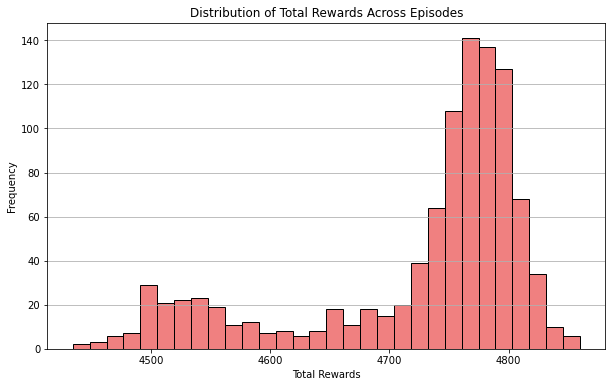

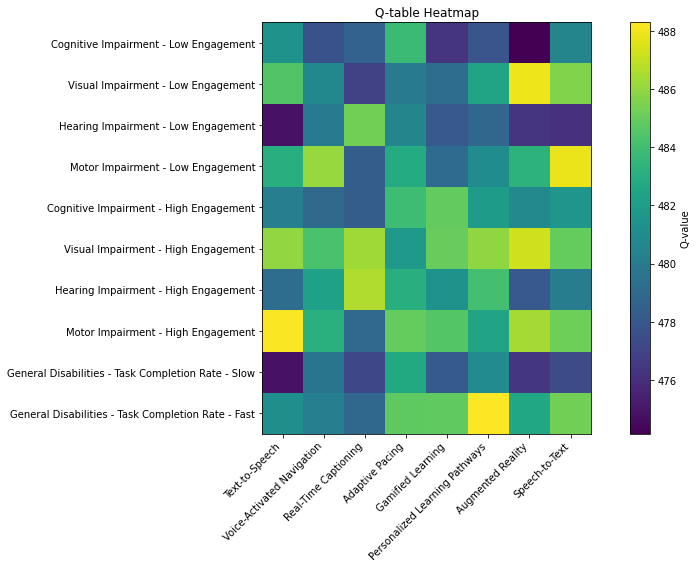

In [9]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes

# Tracking cumulative rewards
cumulative_rewards = []
state_visitation_counts = np.zeros(len(states))  # Track how many times each state is visited
exploration_count = 0
exploitation_count = 0
episode_rewards = []  # Store rewards for plotting distribution

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    global exploration_count, exploitation_count
    if random.uniform(0, 1) < epsilon:  # Explore
        exploration_count += 1
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        exploitation_count += 1
        return np.argmax(q_table[state_index])

# Training process
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Random initial state
    episode_reward = 0  # Track cumulative reward for the episode
    
    for _ in range(100):  # Limit steps per episode
        action_index = choose_action(state_index)
        reward = rewards[states[state_index]][action_index]
        episode_reward += reward
        
        next_state_index = random.randint(0, len(states) - 1)  # Transition randomly
        
        # Q-learning update
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        state_index = next_state_index  # Move to the next state
        state_visitation_counts[state_index] += 1  # Track state visitation
    
    cumulative_rewards.append(episode_reward)  # Store cumulative reward for this episode
    episode_rewards.append(episode_reward)  # Add episode reward to the list for distribution plotting

# Rolling Success Rate Over Time (calculated as a moving average of cumulative rewards)
window_size = 100
rolling_success_rate = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')

# Display learned Q-table
print("Learned Q-table:")
print(q_table)

# Plot cumulative rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), cumulative_rewards, label="Cumulative Reward")
plt.title("Cumulative Rewards Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Reward")
plt.legend()
plt.grid()
plt.show()

# Plot Rolling Success Rate Over Time
plt.figure(figsize=(10, 6))
plt.plot(range(window_size - 1, num_episodes), rolling_success_rate, label="Rolling Success Rate", color='orange')
plt.title("Rolling Success Rate Over Time")
plt.xlabel("Episodes")
plt.ylabel("Success Rate (Moving Average)")
plt.legend()
plt.grid()
plt.show()

# State Visitation Counts During Training
plt.figure(figsize=(10, 6))
plt.bar(states, state_visitation_counts, color='skyblue')
plt.title("State Visitation Counts During Training")
plt.xlabel("States")
plt.ylabel("Visitation Count")
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Exploration vs Exploitation Over Time
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), [exploration_count / (episode + 1) for episode in range(num_episodes)], label="Exploration Rate")
plt.plot(range(num_episodes), [exploitation_count / (episode + 1) for episode in range(num_episodes)], label="Exploitation Rate")
plt.title("Exploration vs Exploitation Over Time")
plt.xlabel("Episodes")
plt.ylabel("Rate")
plt.legend()
plt.grid()
plt.show()

# Distribution of Total Rewards Across Episodes
plt.figure(figsize=(10, 6))
plt.hist(episode_rewards, bins=30, edgecolor='black', color='lightcoral')
plt.title("Distribution of Total Rewards Across Episodes")
plt.xlabel("Total Rewards")
plt.ylabel("Frequency")
plt.grid(axis='y')
plt.show()

# Heatmap of the Q-table
plt.figure(figsize=(12, 8))
plt.imshow(q_table, cmap="viridis", interpolation="nearest")
plt.colorbar(label="Q-value")
plt.xticks(ticks=np.arange(len(actions)), labels=actions, rotation=45, ha="right")
plt.yticks(ticks=np.arange(len(states)), labels=states)
plt.title("Q-table Heatmap")
plt.tight_layout()
plt.show()


Learned Q-table:
[[481.79496432 477.11383141 479.12061817 483.39441115 475.78784463
  478.17482047 473.81606904 479.26011432]
 [484.68507634 481.09788758 477.33414263 480.45348372 479.30783604
  482.24754282 487.34932423 484.50045278]
 [475.72229922 480.10921342 484.35411646 481.37923422 478.66463878
  479.64729546 475.54573578 477.07144814]
 [483.02293788 485.84951337 478.52575956 482.57913775 478.87667227
  481.52448196 482.64663705 487.54887335]
 [479.76532335 479.06394828 478.2420529  483.82011076 484.89309595
  482.04460167 479.39788451 481.28896519]
 [485.955234   483.88146633 485.862742   482.37602165 485.41141552
  485.97953982 486.06942667 485.3786236 ]
 [479.17326812 481.91556041 486.40553482 483.09286162 481.16458139
  484.34164942 478.32680358 479.56660781]
 [486.85471693 482.83907811 479.2721671  485.23282689 483.53454621
  482.03262186 485.70349773 485.55339318]
 [474.8949503  478.69541127 477.05142418 482.25047909 478.62457681
  481.03887654 475.96658073 477.45974358]
 [

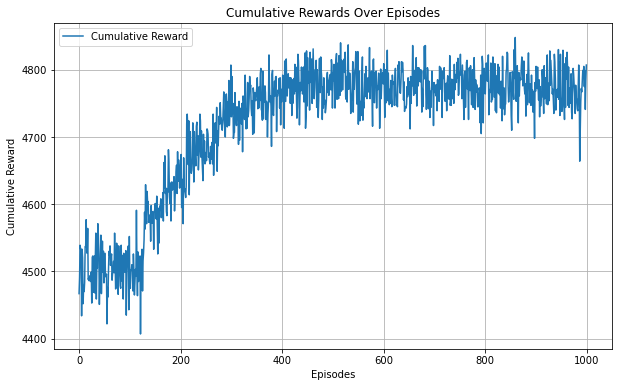

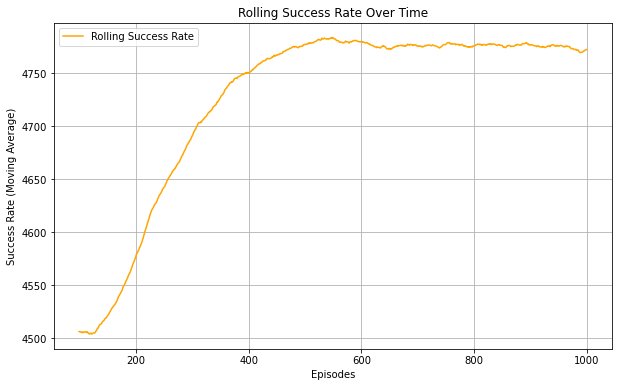

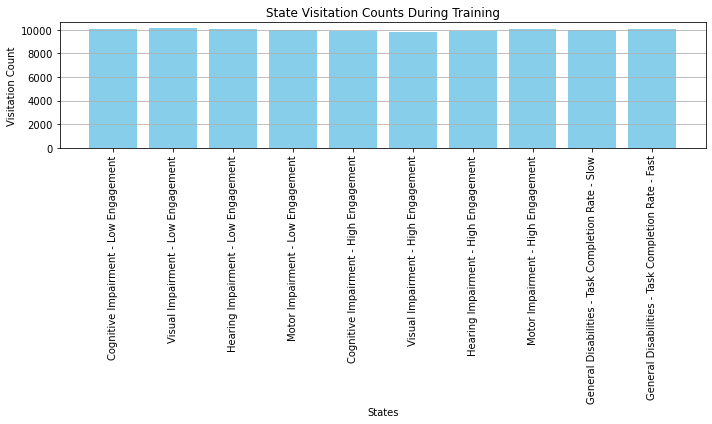

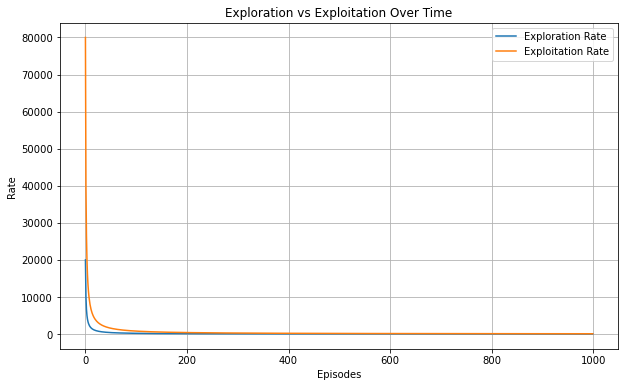

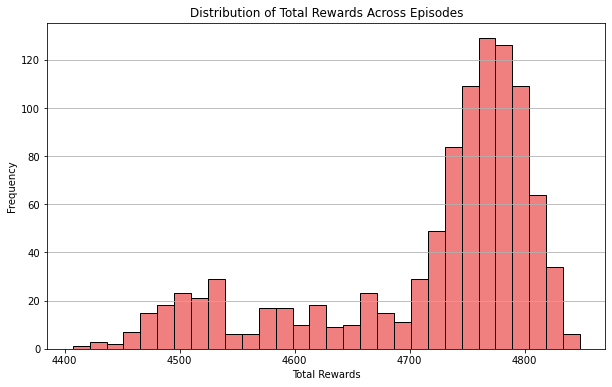

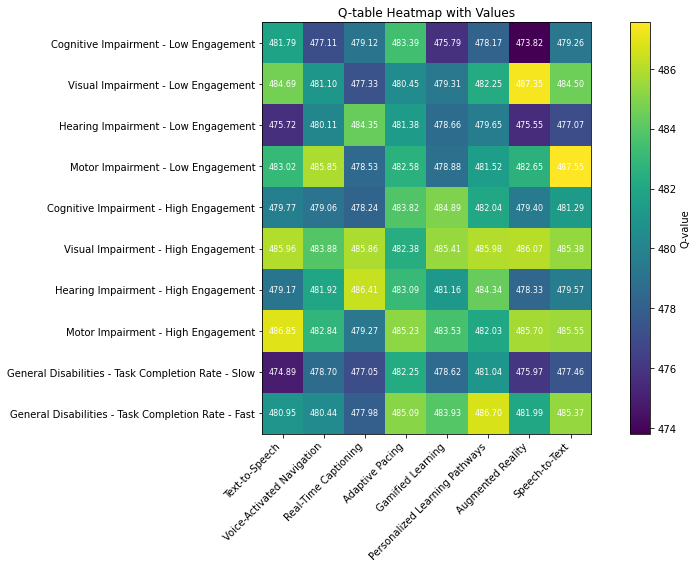

In [10]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the Q-table with random initial values (10 states x 8 actions)
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Define the reward matrix
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes

# Tracking cumulative rewards
cumulative_rewards = []
state_visitation_counts = np.zeros(len(states))  # Track how many times each state is visited
exploration_count = 0
exploitation_count = 0
episode_rewards = []  # Store rewards for plotting distribution

# Helper function to choose action using epsilon-greedy policy
def choose_action(state_index):
    global exploration_count, exploitation_count
    if random.uniform(0, 1) < epsilon:  # Explore
        exploration_count += 1
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        exploitation_count += 1
        return np.argmax(q_table[state_index])

# Training process
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Random initial state
    episode_reward = 0  # Track cumulative reward for the episode
    
    for _ in range(100):  # Limit steps per episode
        action_index = choose_action(state_index)
        reward = rewards[states[state_index]][action_index]
        episode_reward += reward
        
        next_state_index = random.randint(0, len(states) - 1)  # Transition randomly
        
        # Q-learning update
        q_table[state_index][action_index] = q_table[state_index][action_index] + learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        state_index = next_state_index  # Move to the next state
        state_visitation_counts[state_index] += 1  # Track state visitation
    
    cumulative_rewards.append(episode_reward)  # Store cumulative reward for this episode
    episode_rewards.append(episode_reward)  # Add episode reward to the list for distribution plotting

# Rolling Success Rate Over Time (calculated as a moving average of cumulative rewards)
window_size = 100
rolling_success_rate = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')

# Display learned Q-table
print("Learned Q-table:")
print(q_table)

# Plot cumulative rewards over episodes
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), cumulative_rewards, label="Cumulative Reward")
plt.title("Cumulative Rewards Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Reward")
plt.legend()
plt.grid()
plt.show()

# Plot Rolling Success Rate Over Time
plt.figure(figsize=(10, 6))
plt.plot(range(window_size - 1, num_episodes), rolling_success_rate, label="Rolling Success Rate", color='orange')
plt.title("Rolling Success Rate Over Time")
plt.xlabel("Episodes")
plt.ylabel("Success Rate (Moving Average)")
plt.legend()
plt.grid()
plt.show()

# State Visitation Counts During Training
plt.figure(figsize=(10, 6))
plt.bar(states, state_visitation_counts, color='skyblue')
plt.title("State Visitation Counts During Training")
plt.xlabel("States")
plt.ylabel("Visitation Count")
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Exploration vs Exploitation Over Time
plt.figure(figsize=(10, 6))
plt.plot(range(num_episodes), [exploration_count / (episode + 1) for episode in range(num_episodes)], label="Exploration Rate")
plt.plot(range(num_episodes), [exploitation_count / (episode + 1) for episode in range(num_episodes)], label="Exploitation Rate")
plt.title("Exploration vs Exploitation Over Time")
plt.xlabel("Episodes")
plt.ylabel("Rate")
plt.legend()
plt.grid()
plt.show()

# Distribution of Total Rewards Across Episodes
plt.figure(figsize=(10, 6))
plt.hist(episode_rewards, bins=30, edgecolor='black', color='lightcoral')
plt.title("Distribution of Total Rewards Across Episodes")
plt.xlabel("Total Rewards")
plt.ylabel("Frequency")
plt.grid(axis='y')
plt.show()

# Heatmap of the Q-table with values displayed
plt.figure(figsize=(12, 8))
cax = plt.imshow(q_table, cmap="viridis", interpolation="nearest")
plt.colorbar(cax, label="Q-value")
plt.xticks(ticks=np.arange(len(actions)), labels=actions, rotation=45, ha="right")
plt.yticks(ticks=np.arange(len(states)), labels=states)
plt.title("Q-table Heatmap with Values")

# Annotate Q-values on the heatmap
for i in range(len(states)):
    for j in range(len(actions)):
        plt.text(j, i, f'{q_table[i, j]:.2f}', ha='center', va='center', color='white', fontsize=8)

plt.tight_layout()
plt.show()


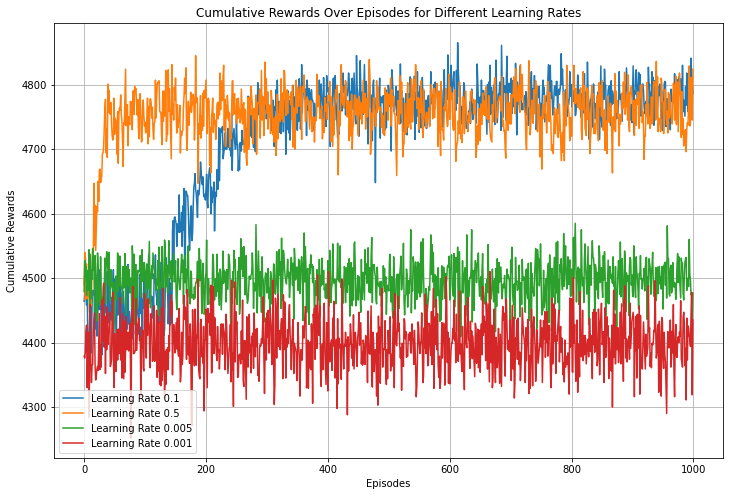

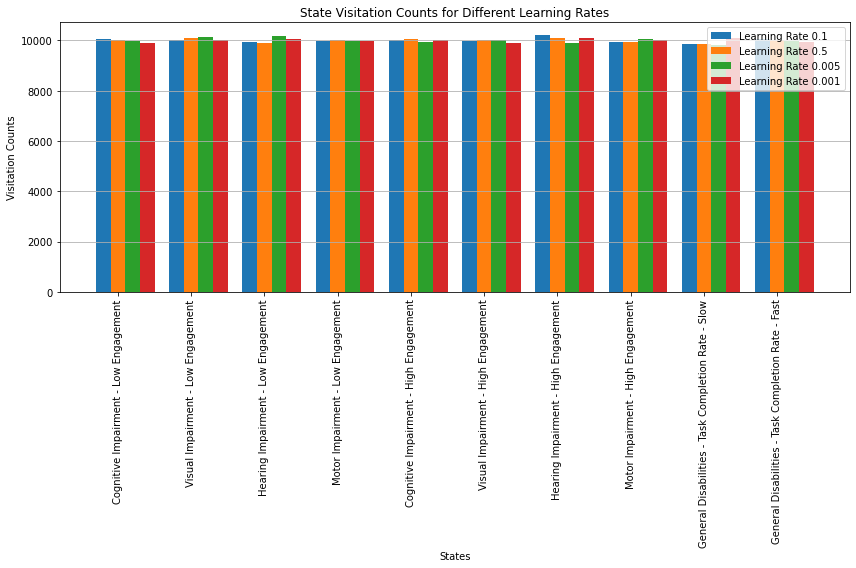

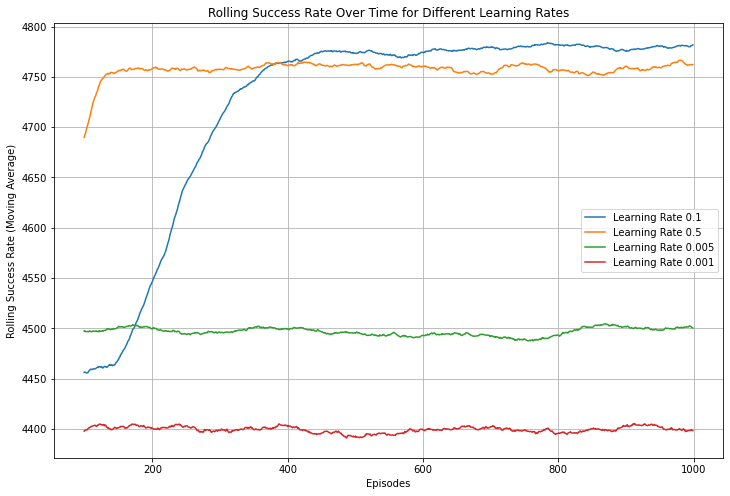

In [11]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Define the reward matrix
rewards = {
    "Cognitive Impairment - Low Engagement": [45, 40, 42, 46, 39, 41, 37, 43],
    "Visual Impairment - Low Engagement": [47, 44, 40, 43, 42, 45, 50, 48],
    "Hearing Impairment - Low Engagement": [38, 43, 48, 44, 41, 42, 39, 40],
    "Motor Impairment - Low Engagement": [46, 49, 41, 45, 42, 44, 46, 50],
    "Cognitive Impairment - High Engagement": [43, 42, 41, 47, 48, 45, 43, 44],
    "Visual Impairment - High Engagement": [49, 47, 50, 45, 48, 49, 50, 48],
    "Hearing Impairment - High Engagement": [42, 45, 49, 46, 44, 47, 41, 43],
    "Motor Impairment - High Engagement": [50, 46, 42, 48, 47, 45, 49, 49],
    "General Disabilities - Task Completion Rate - Slow": [38, 42, 40, 45, 41, 44, 39, 40],
    "General Disabilities - Task Completion Rate - Fast": [44, 43, 41, 48, 47, 50, 45, 48]
}

# Q-learning parameters
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes
learning_rates = [0.1, 0.5, 0.005, 0.001]  # Learning rates to test

# Function to train Q-learning and collect data
def train_q_learning(learning_rate):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))
    cumulative_rewards = []
    state_visitation_counts = np.zeros(len(states))
    
    def choose_action(state_index):
        if random.uniform(0, 1) < epsilon:  # Explore
            return random.randint(0, len(actions) - 1)
        else:  # Exploit
            return np.argmax(q_table[state_index])

    for episode in range(num_episodes):
        state_index = random.randint(0, len(states) - 1)  # Random initial state
        episode_reward = 0
        
        for _ in range(100):  # Limit steps per episode
            action_index = choose_action(state_index)
            reward = rewards[states[state_index]][action_index]
            episode_reward += reward
            
            next_state_index = random.randint(0, len(states) - 1)  # Transition randomly
            
            # Q-learning update
            q_table[state_index][action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
            )
            state_index = next_state_index
            state_visitation_counts[state_index] += 1
        
        cumulative_rewards.append(episode_reward)
    
    return cumulative_rewards, state_visitation_counts, q_table

# Train Q-learning for each learning rate and collect data
results = {}
for lr in learning_rates:
    results[lr] = train_q_learning(lr)

# Plot cumulative rewards for different learning rates
plt.figure(figsize=(12, 8))
for lr, (cumulative_rewards, _, _) in results.items():
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {lr}")
plt.title("Cumulative Rewards Over Episodes for Different Learning Rates")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.grid()
plt.show()

# Plot state visitation counts for different learning rates
plt.figure(figsize=(12, 8))
width = 0.2
x = np.arange(len(states))
for i, (lr, (_, state_visitation_counts, _)) in enumerate(results.items()):
    plt.bar(x + i * width, state_visitation_counts, width, label=f"Learning Rate {lr}")
plt.title("State Visitation Counts for Different Learning Rates")
plt.xlabel("States")
plt.ylabel("Visitation Counts")
plt.xticks(ticks=x + width * (len(learning_rates) / 2 - 1), labels=states, rotation=90)
plt.legend()
plt.tight_layout()
plt.grid(axis='y')
plt.show()

# Plot rolling success rates
plt.figure(figsize=(12, 8))
window_size = 100
for lr, (cumulative_rewards, _, _) in results.items():
    rolling_success_rate = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')
    plt.plot(range(window_size - 1, num_episodes), rolling_success_rate, label=f"Learning Rate {lr}")
plt.title("Rolling Success Rate Over Time for Different Learning Rates")
plt.xlabel("Episodes")
plt.ylabel("Rolling Success Rate (Moving Average)")
plt.legend()
plt.grid()
plt.show()


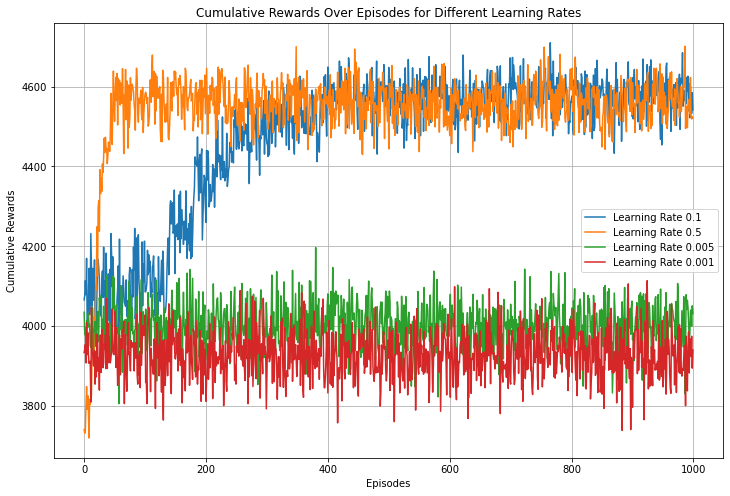

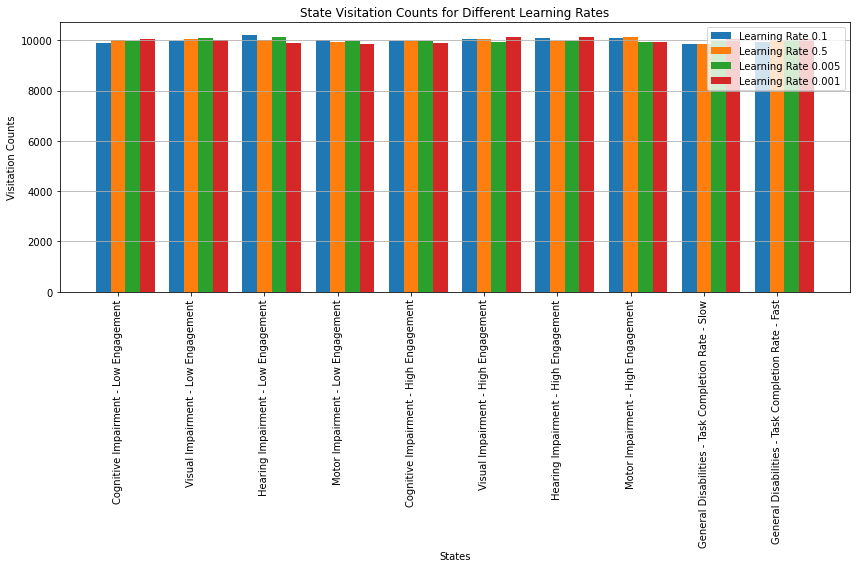

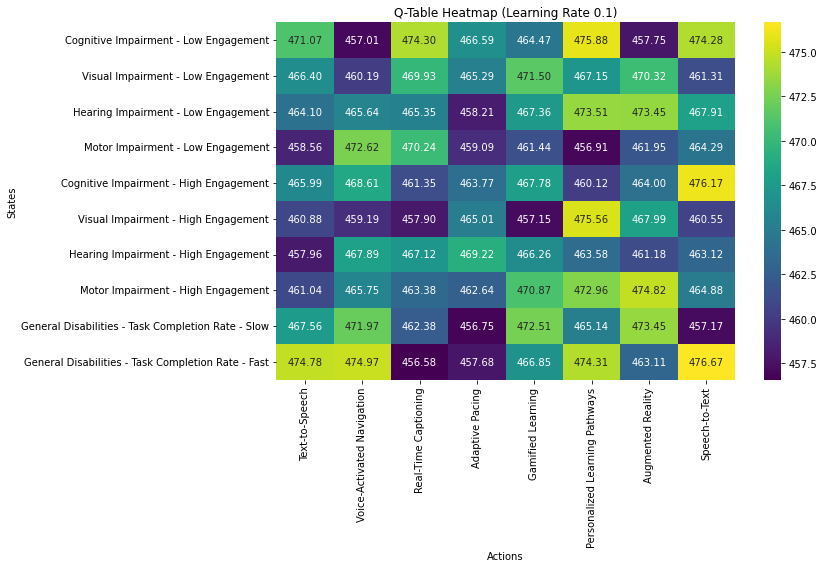

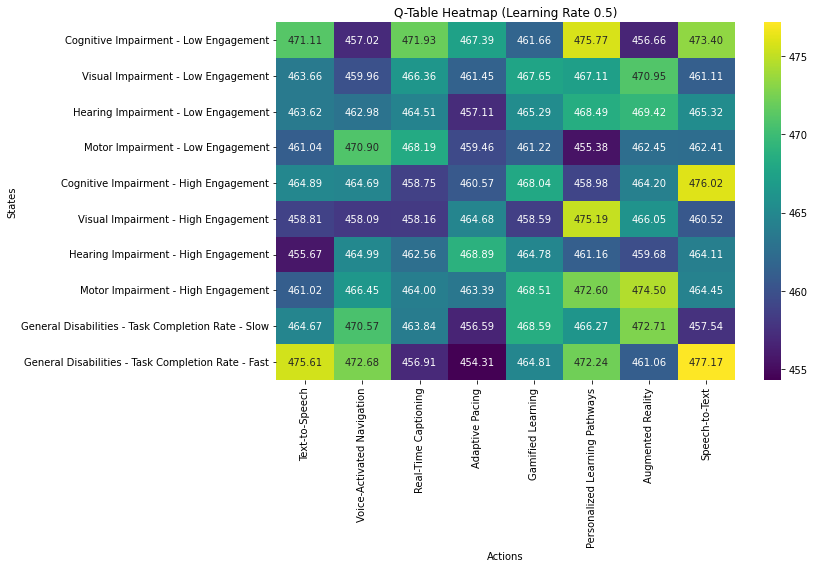

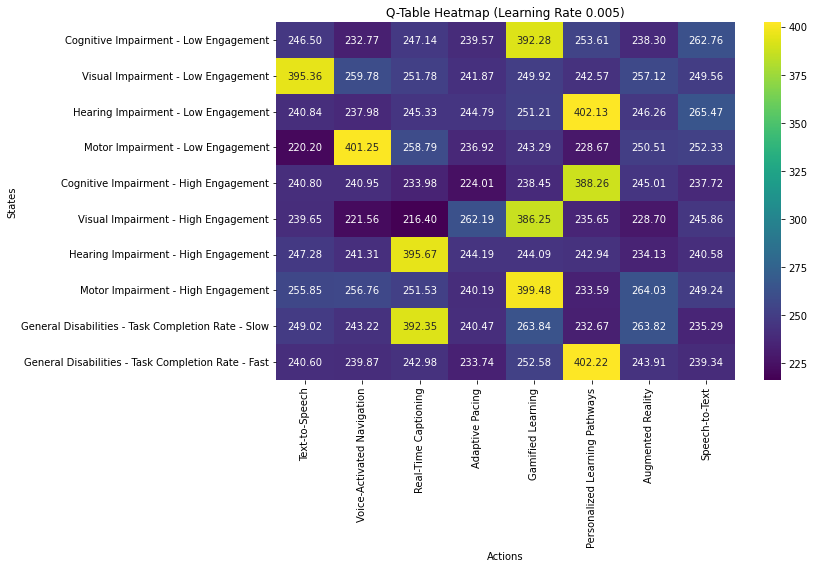

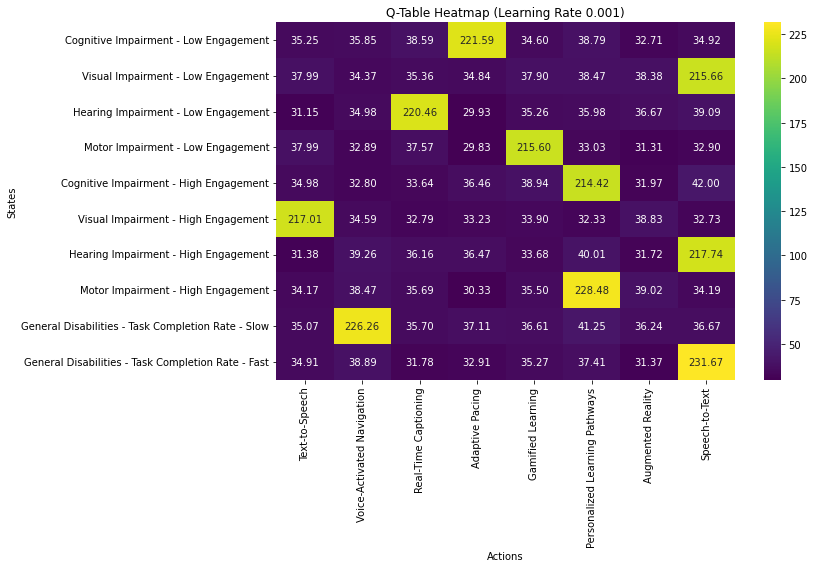

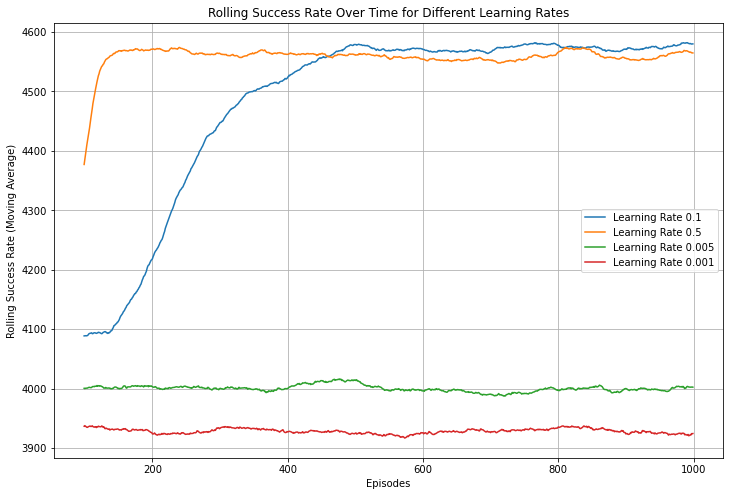

In [12]:
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Generate randomized rewards for each state-action pair
rewards = {
    state: np.random.randint(30, 51, len(actions)) for state in states
}

# Q-learning parameters
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes
learning_rates = [0.1, 0.5, 0.005, 0.001]  # Learning rates to test

# Function to train Q-learning and collect data
def train_q_learning(learning_rate):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))
    cumulative_rewards = []
    state_visitation_counts = np.zeros(len(states))
    
    def choose_action(state_index):
        if random.uniform(0, 1) < epsilon:  # Explore
            return random.randint(0, len(actions) - 1)
        else:  # Exploit
            return np.argmax(q_table[state_index])

    for episode in range(num_episodes):
        state_index = random.randint(0, len(states) - 1)  # Random initial state
        episode_reward = 0
        
        for _ in range(100):  # Limit steps per episode
            action_index = choose_action(state_index)
            reward = rewards[states[state_index]][action_index]
            episode_reward += reward
            
            next_state_index = random.randint(0, len(states) - 1)  # Transition randomly
            
            # Q-learning update
            q_table[state_index][action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
            )
            state_index = next_state_index
            state_visitation_counts[state_index] += 1
        
        cumulative_rewards.append(episode_reward)
    
    return cumulative_rewards, state_visitation_counts, q_table

# Train Q-learning for each learning rate and collect data
results = {}
for lr in learning_rates:
    results[lr] = train_q_learning(lr)

# Plot cumulative rewards for different learning rates
plt.figure(figsize=(12, 8))
for lr, (cumulative_rewards, _, _) in results.items():
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {lr}")
plt.title("Cumulative Rewards Over Episodes for Different Learning Rates")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.grid()
plt.show()

# Plot state visitation counts for different learning rates
plt.figure(figsize=(12, 8))
width = 0.2
x = np.arange(len(states))
for i, (lr, (_, state_visitation_counts, _)) in enumerate(results.items()):
    plt.bar(x + i * width, state_visitation_counts, width, label=f"Learning Rate {lr}")
plt.title("State Visitation Counts for Different Learning Rates")
plt.xlabel("States")
plt.ylabel("Visitation Counts")
plt.xticks(ticks=x + width * (len(learning_rates) / 2 - 1), labels=states, rotation=90)
plt.legend()
plt.tight_layout()
plt.grid(axis='y')
plt.show()

# Plot Q-value heatmaps for different learning rates
for lr, (_, _, q_table) in results.items():
    plt.figure(figsize=(12, 8))
    sns.heatmap(q_table, annot=True, fmt=".2f", cmap="viridis", xticklabels=actions, yticklabels=states)
    plt.title(f"Q-Table Heatmap (Learning Rate {lr})")
    plt.xlabel("Actions")
    plt.ylabel("States")
    plt.tight_layout()
    plt.show()

# Plot rolling success rates
plt.figure(figsize=(12, 8))
window_size = 100
for lr, (cumulative_rewards, _, _) in results.items():
    rolling_success_rate = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')
    plt.plot(range(window_size - 1, num_episodes), rolling_success_rate, label=f"Learning Rate {lr}")
plt.title("Rolling Success Rate Over Time for Different Learning Rates")
plt.xlabel("Episodes")
plt.ylabel("Rolling Success Rate (Moving Average)")
plt.legend()
plt.grid()
plt.show()


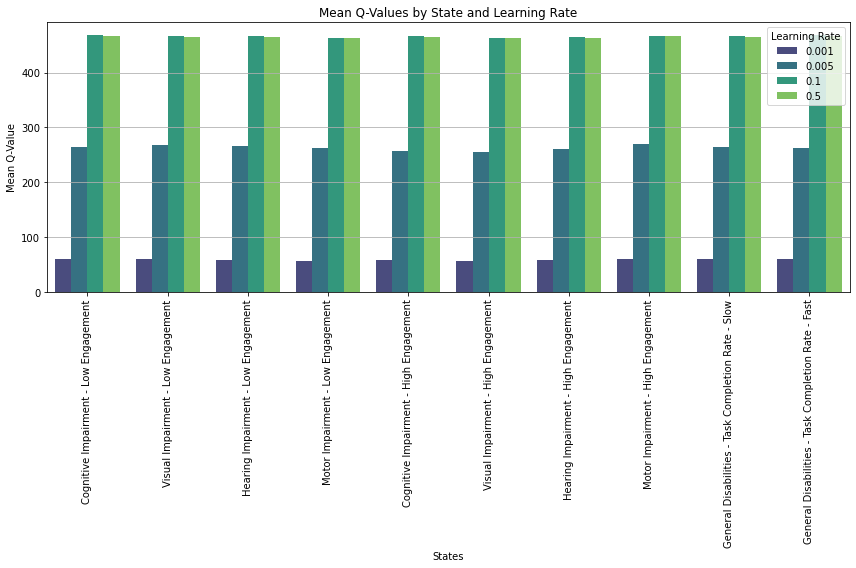

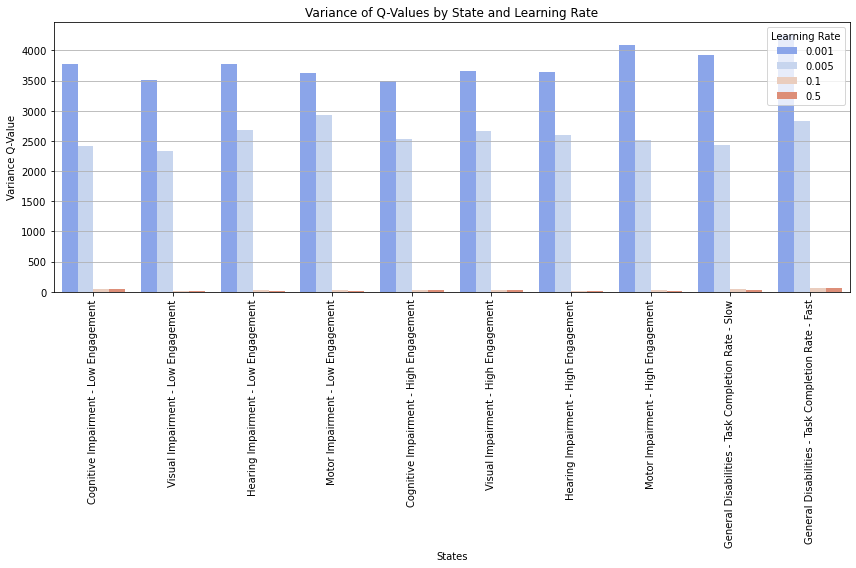

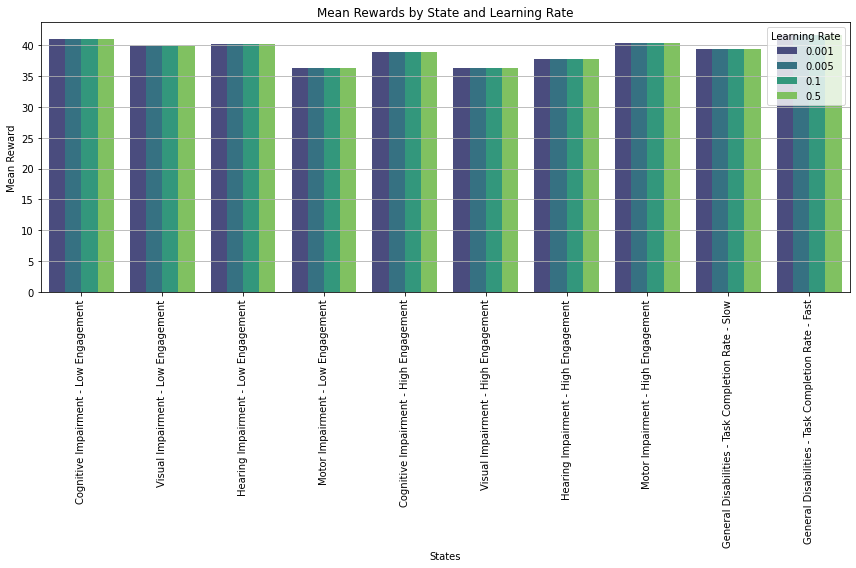

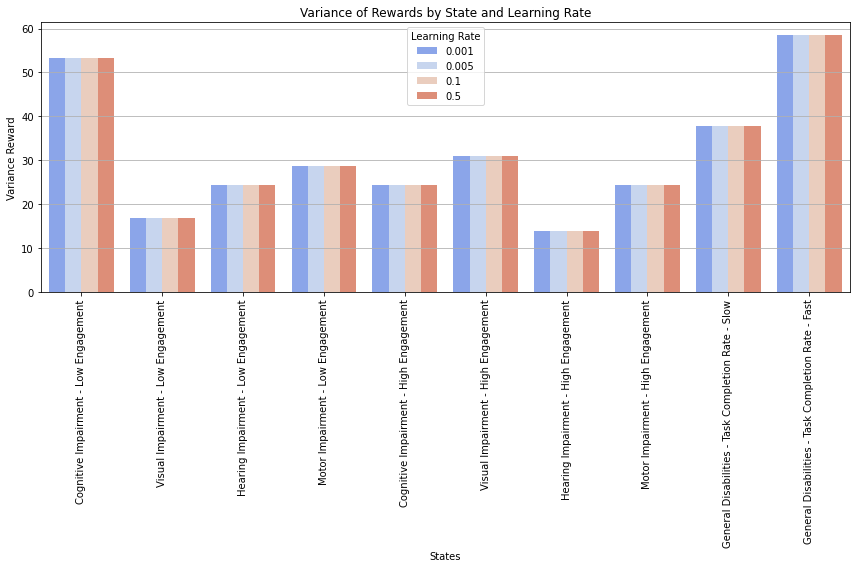

In [13]:
import pandas as pd

# Function to compute means and variances
def compute_mean_variance(rewards, q_table):
    means = np.mean(q_table, axis=1)
    variances = np.var(q_table, axis=1)
    data = pd.DataFrame({
        "State": states,
        "Mean Q-Value": means,
        "Variance Q-Value": variances,
        "Mean Reward": [np.mean(rewards[state]) for state in states],
        "Variance Reward": [np.var(rewards[state]) for state in states]
    })
    return data

# Store results for hue-based analysis
hue_data = pd.DataFrame()
for lr, (_, _, q_table) in results.items():
    temp_data = compute_mean_variance(rewards, q_table)
    temp_data["Learning Rate"] = lr
    hue_data = pd.concat([hue_data, temp_data], ignore_index=True)

# Plot mean Q-values and variance with hue
plt.figure(figsize=(12, 8))
sns.barplot(data=hue_data, x="State", y="Mean Q-Value", hue="Learning Rate", palette="viridis")
plt.title("Mean Q-Values by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Mean Q-Value")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.tight_layout()
plt.grid(axis='y')
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=hue_data, x="State", y="Variance Q-Value", hue="Learning Rate", palette="coolwarm")
plt.title("Variance of Q-Values by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Variance Q-Value")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.tight_layout()
plt.grid(axis='y')
plt.show()

# Plot mean and variance of rewards with hue
plt.figure(figsize=(12, 8))
sns.barplot(data=hue_data, x="State", y="Mean Reward", hue="Learning Rate", palette="viridis")
plt.title("Mean Rewards by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Mean Reward")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.tight_layout()
plt.grid(axis='y')
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=hue_data, x="State", y="Variance Reward", hue="Learning Rate", palette="coolwarm")
plt.title("Variance of Rewards by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Variance Reward")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.tight_layout()
plt.grid(axis='y')
plt.show()


OptionError: "No such keys(s): 'mode.use_inf_as_null'"

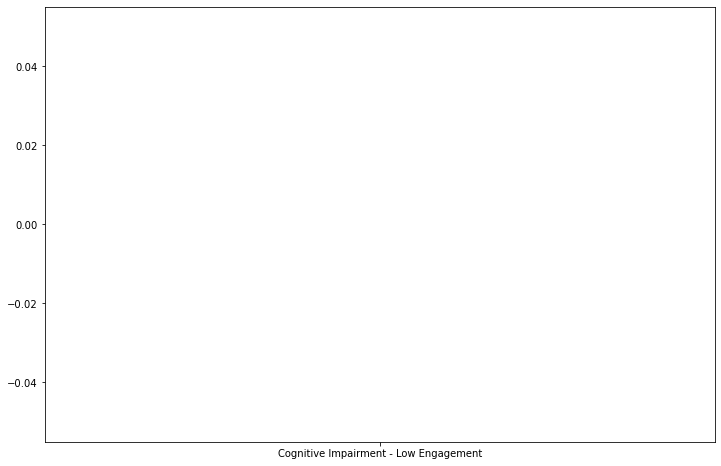

In [14]:
# Line plot for Mean Q-Values with hue (Learning Rate)
plt.figure(figsize=(12, 8))
sns.lineplot(data=hue_data, x="State", y="Mean Q-Value", hue="Learning Rate", marker="o", palette="viridis")
plt.title("Mean Q-Values by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Mean Q-Value")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.grid()
plt.tight_layout()
plt.show()

# Line plot for Variance of Q-Values with hue (Learning Rate)
plt.figure(figsize=(12, 8))
sns.lineplot(data=hue_data, x="State", y="Variance Q-Value", hue="Learning Rate", marker="o", palette="coolwarm")
plt.title("Variance of Q-Values by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Variance Q-Value")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.grid()
plt.tight_layout()
plt.show()

# Line plot for Mean Rewards with hue (Learning Rate)
plt.figure(figsize=(12, 8))
sns.lineplot(data=hue_data, x="State", y="Mean Reward", hue="Learning Rate", marker="o", palette="viridis")
plt.title("Mean Rewards by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Mean Reward")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.grid()
plt.tight_layout()
plt.show()

# Line plot for Variance of Rewards with hue (Learning Rate)
plt.figure(figsize=(12, 8))
sns.lineplot(data=hue_data, x="State", y="Variance Reward", hue="Learning Rate", marker="o", palette="coolwarm")
plt.title("Variance of Rewards by State and Learning Rate")
plt.xlabel("States")
plt.ylabel("Variance Reward")
plt.xticks(rotation=90)
plt.legend(title="Learning Rate")
plt.grid()
plt.tight_layout()
plt.show()


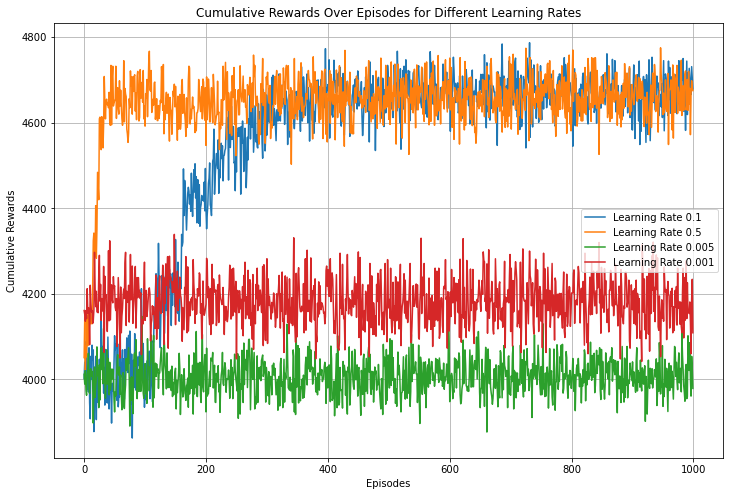

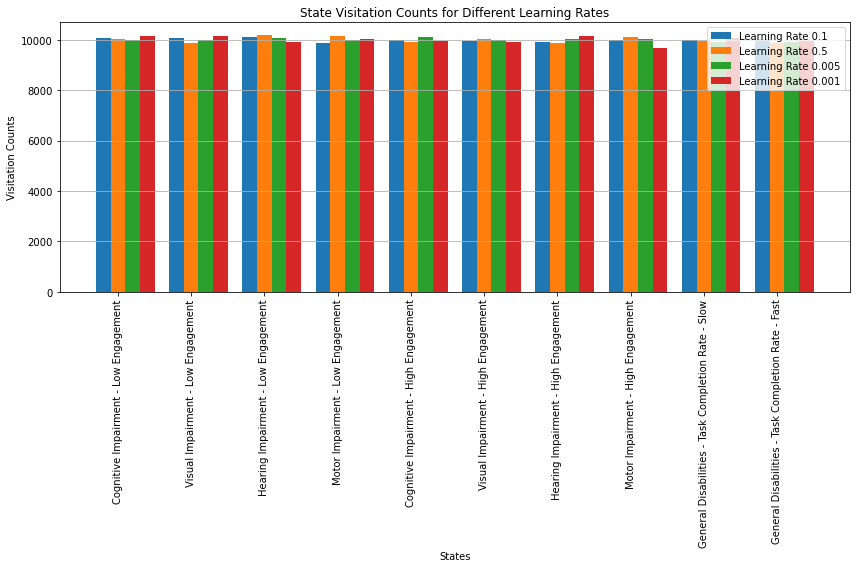

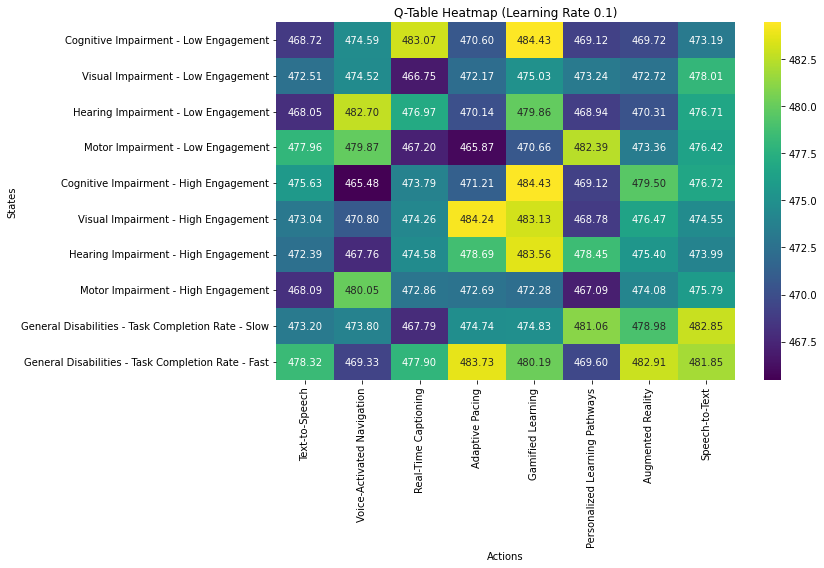

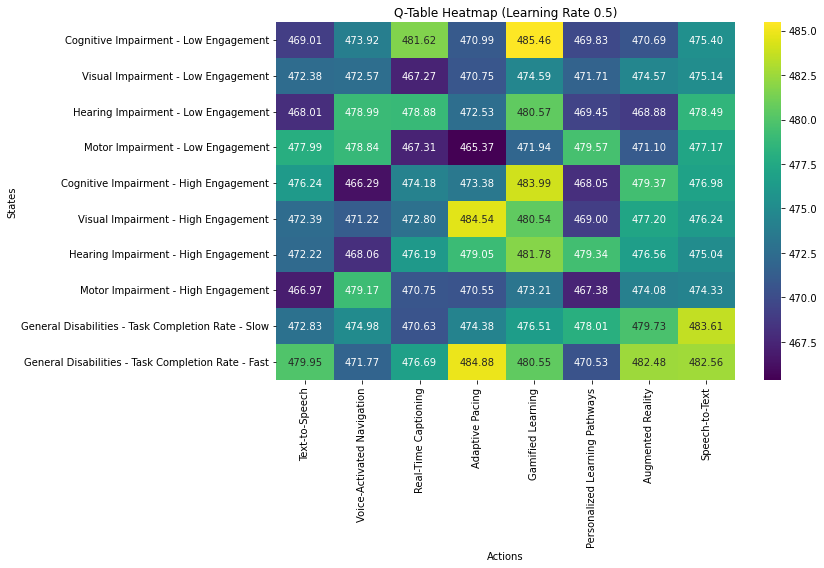

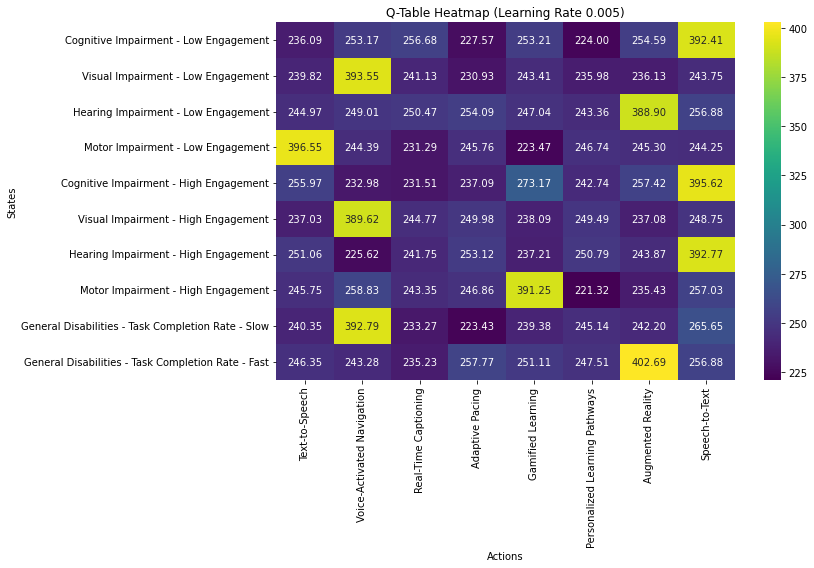

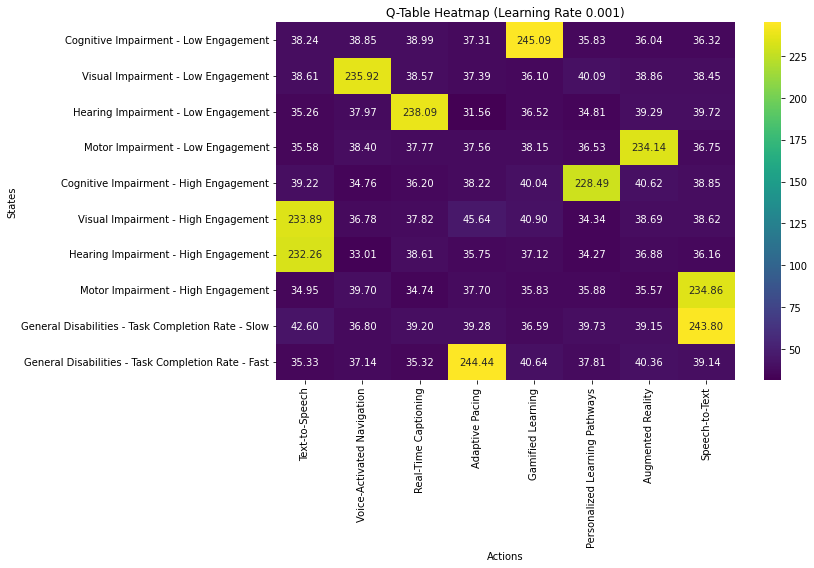

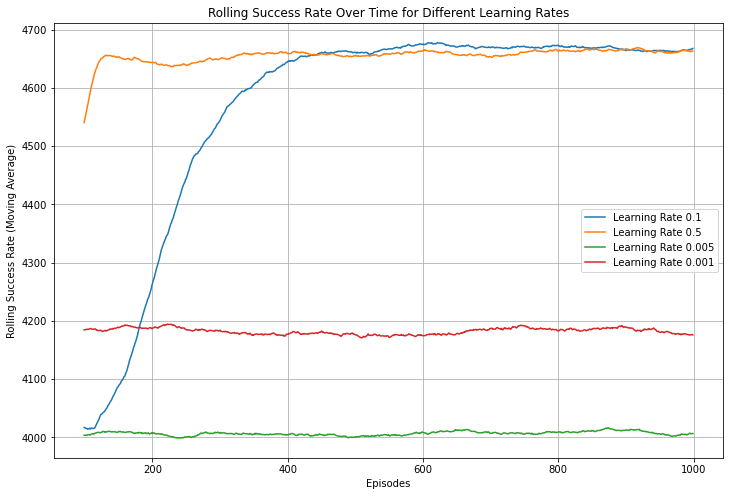

Learned Q-table for Learning Rate 0.1:
[[468.72381542 474.59405955 483.06736148 470.59517952 484.42561167
  469.11985042 469.71802877 473.18622488]
 [472.51182901 474.51671079 466.75193096 472.17234646 475.02769666
  473.23965692 472.71810633 478.00883918]
 [468.05053853 482.69933291 476.96547421 470.13777608 479.86121087
  468.94070481 470.30740794 476.70805962]
 [477.96084041 479.86979427 467.20382957 465.86518141 470.66345002
  482.38980037 473.35994105 476.42359832]
 [475.63204284 465.48379454 473.79338798 471.21054377 484.42876725
  469.12121774 479.49668205 476.72088189]
 [473.03947877 470.80257252 474.26029044 484.24330384 483.12793005
  468.7801948  476.46572638 474.55130217]
 [472.38952484 467.76479069 474.58198079 478.6877127  483.5563366
  478.45035581 475.40156747 473.98982838]
 [468.08761316 480.04743856 472.856627   472.6883936  472.27761435
  467.09202067 474.07910344 475.78598216]
 [473.20087993 473.79777111 467.79331034 474.74241249 474.83164556
  481.06279179 478.9784

In [15]:
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns

# Define the states (personalized for different disabilities)
states = [
    "Cognitive Impairment - Low Engagement",
    "Visual Impairment - Low Engagement",
    "Hearing Impairment - Low Engagement",
    "Motor Impairment - Low Engagement",
    "Cognitive Impairment - High Engagement",
    "Visual Impairment - High Engagement",
    "Hearing Impairment - High Engagement",
    "Motor Impairment - High Engagement",
    "General Disabilities - Task Completion Rate - Slow",
    "General Disabilities - Task Completion Rate - Fast"
]

# Define the actions (personalized learning strategies)
actions = [
    "Text-to-Speech",
    "Voice-Activated Navigation",
    "Real-Time Captioning",
    "Adaptive Pacing",
    "Gamified Learning",
    "Personalized Learning Pathways",
    "Augmented Reality",
    "Speech-to-Text"
]

# Generate randomized rewards for each state-action pair
rewards = {
    state: np.random.randint(30, 51, len(actions)) for state in states
}

# Q-learning parameters
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000  # Number of episodes
learning_rates = [0.1, 0.5, 0.005, 0.001]  # Learning rates to test

# Function to train Q-learning and collect data
def train_q_learning(learning_rate):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))
    cumulative_rewards = []
    state_visitation_counts = np.zeros(len(states))
    
    def choose_action(state_index):
        if random.uniform(0, 1) < epsilon:  # Explore
            return random.randint(0, len(actions) - 1)
        else:  # Exploit
            return np.argmax(q_table[state_index])

    for episode in range(num_episodes):
        state_index = random.randint(0, len(states) - 1)  # Random initial state
        episode_reward = 0
        
        for _ in range(100):  # Limit steps per episode
            action_index = choose_action(state_index)
            reward = rewards[states[state_index]][action_index]
            episode_reward += reward
            
            next_state_index = random.randint(0, len(states) - 1)  # Transition randomly
            
            # Q-learning update
            q_table[state_index][action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
            )
            state_index = next_state_index
            state_visitation_counts[state_index] += 1
        
        cumulative_rewards.append(episode_reward)
    
    return cumulative_rewards, state_visitation_counts, q_table

# Train Q-learning for each learning rate and collect data
results = {}
for lr in learning_rates:
    results[lr] = train_q_learning(lr)

# Plot cumulative rewards for different learning rates
plt.figure(figsize=(12, 8))
for lr, (cumulative_rewards, _, _) in results.items():
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {lr}")
plt.title("Cumulative Rewards Over Episodes for Different Learning Rates")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.grid()
plt.show()

# Plot state visitation counts for different learning rates
plt.figure(figsize=(12, 8))
width = 0.2
x = np.arange(len(states))
for i, (lr, (_, state_visitation_counts, _)) in enumerate(results.items()):
    plt.bar(x + i * width, state_visitation_counts, width, label=f"Learning Rate {lr}")
plt.title("State Visitation Counts for Different Learning Rates")
plt.xlabel("States")
plt.ylabel("Visitation Counts")
plt.xticks(ticks=x + width * (len(learning_rates) / 2 - 1), labels=states, rotation=90)
plt.legend()
plt.tight_layout()
plt.grid(axis='y')
plt.show()

# Plot Q-value heatmaps for different learning rates
for lr, (_, _, q_table) in results.items():
    plt.figure(figsize=(12, 8))
    sns.heatmap(q_table, annot=True, fmt=".2f", cmap="viridis", xticklabels=actions, yticklabels=states)
    plt.title(f"Q-Table Heatmap (Learning Rate {lr})")
    plt.xlabel("Actions")
    plt.ylabel("States")
    plt.tight_layout()
    plt.show()

# Plot rolling success rates
plt.figure(figsize=(12, 8))
window_size = 100
for lr, (cumulative_rewards, _, _) in results.items():
    rolling_success_rate = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')
    plt.plot(range(window_size - 1, num_episodes), rolling_success_rate, label=f"Learning Rate {lr}")
plt.title("Rolling Success Rate Over Time for Different Learning Rates")
plt.xlabel("Episodes")
plt.ylabel("Rolling Success Rate (Moving Average)")
plt.legend()
plt.grid()
plt.show()

# Print learned Q-tables
for lr, (_, _, q_table) in results.items():
    print(f"Learned Q-table for Learning Rate {lr}:\n{q_table}\n")


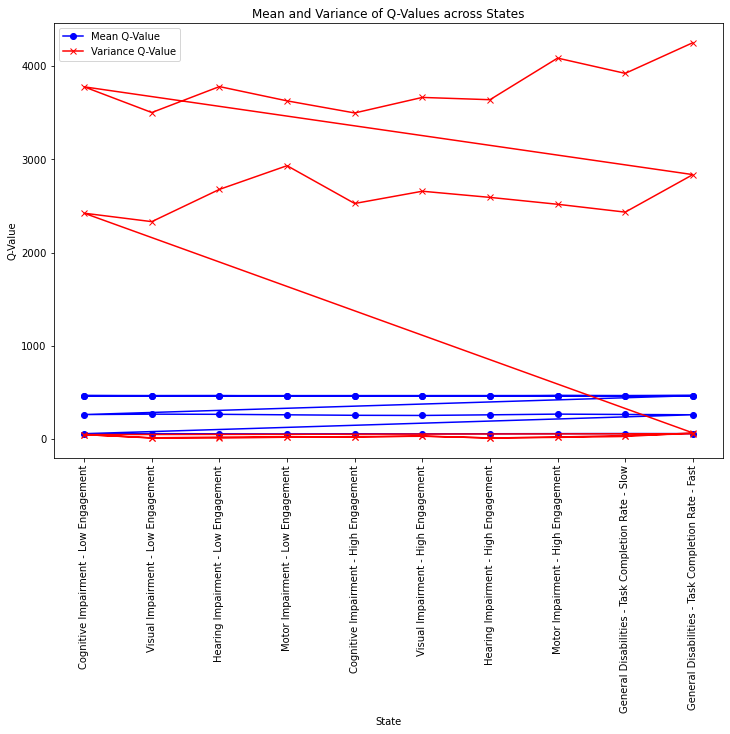

In [24]:
# Ensure the data is one-dimensional and convert to numpy arrays if necessary
state_values = hue_data["State"].values
mean_q_values = hue_data["Mean Q-Value"].values

# Plotting the data
plt.figure(figsize=(12, 8))

# Line plot for Mean Q-Values
plt.plot(state_values, mean_q_values, label="Mean Q-Value", marker="o", color="b")

# Line plot for Variance of Q-Values
variance_q_values = hue_data["Variance Q-Value"].values
plt.plot(state_values, variance_q_values, label="Variance Q-Value", marker="x", color="r")

# Adding labels and title
plt.xlabel("State")
plt.ylabel("Q-Value")
plt.title("Mean and Variance of Q-Values across States")
plt.legend()

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Display the plot
plt.show()


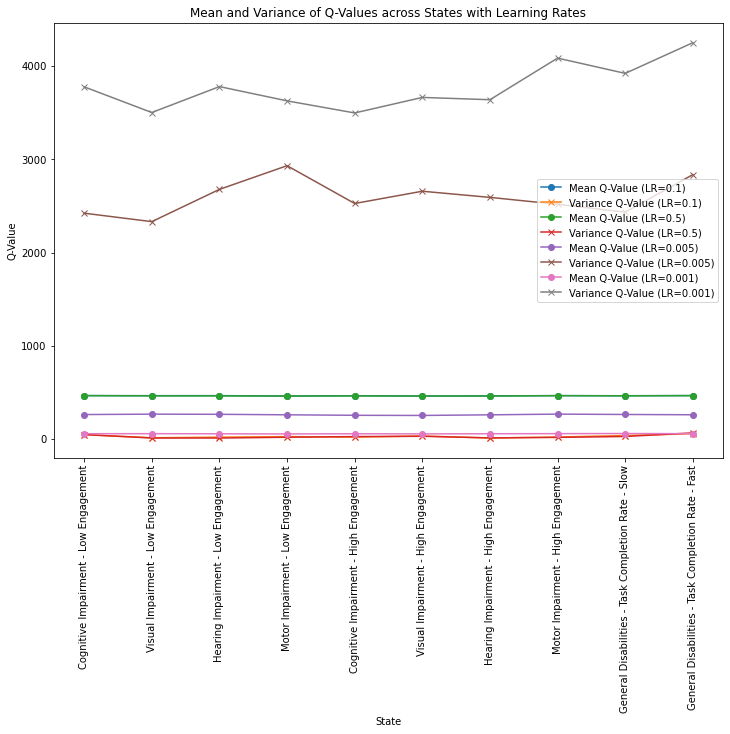

In [25]:
import matplotlib.pyplot as plt

# Sample data
state_values = hue_data["State"].values
mean_q_values = hue_data["Mean Q-Value"].values
variance_q_values = hue_data["Variance Q-Value"].values
learning_rates = hue_data["Learning Rate"].unique()  # Assuming there are different learning rates in the dataset

# Plotting the data
plt.figure(figsize=(12, 8))

# Loop over learning rates and plot corresponding Q-values for each
for lr in learning_rates:
    # Filter data for each learning rate
    lr_data = hue_data[hue_data["Learning Rate"] == lr]
    
    # Plot Mean Q-Values for this learning rate
    plt.plot(lr_data["State"].values, lr_data["Mean Q-Value"].values, label=f"Mean Q-Value (LR={lr})", marker="o")
    
    # Plot Variance Q-Values for this learning rate
    plt.plot(lr_data["State"].values, lr_data["Variance Q-Value"].values, label=f"Variance Q-Value (LR={lr})", marker="x")

# Adding labels and title
plt.xlabel("State")
plt.ylabel("Q-Value")
plt.title("Mean and Variance of Q-Values across States with Learning Rates")

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Add legend for learning rates
plt.legend()

# Display the plot
plt.show()


OptionError: "No such keys(s): 'mode.use_inf_as_null'"

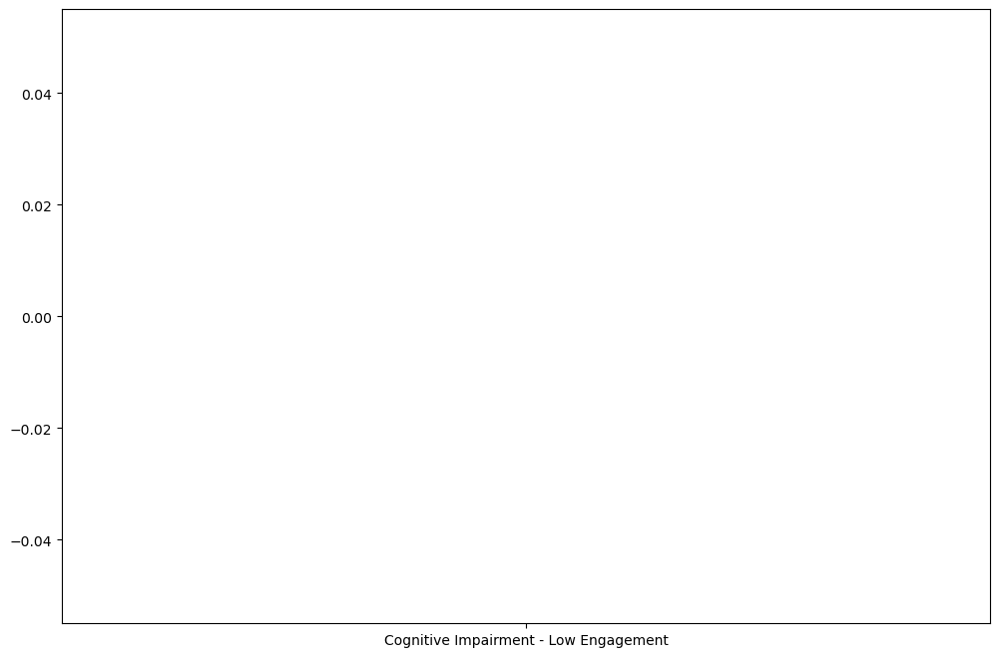

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'hue_data' contains the necessary columns like "State", "Mean Q-Value", "Variance Q-Value", "Learning Rate"

# Create the plot for Mean Q-Values
plt.figure(figsize=(12, 8))

# Plot Mean Q-Values with different learning rates as a hue (grouping)
sns.lineplot(data=hue_data, x="State", y="Mean Q-Value", hue="Learning Rate", marker="o")

# Plot Variance Q-Values with different learning rates as a hue (grouping)
sns.lineplot(data=hue_data, x="State", y="Variance Q-Value", hue="Learning Rate", marker="x")

# Adding labels and title
plt.xlabel("State")
plt.ylabel("Q-Value")
plt.title("Mean and Variance of Q-Values across States with Learning Rates")

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Display the plot
plt.legend(title="Learning Rate")
plt.show()


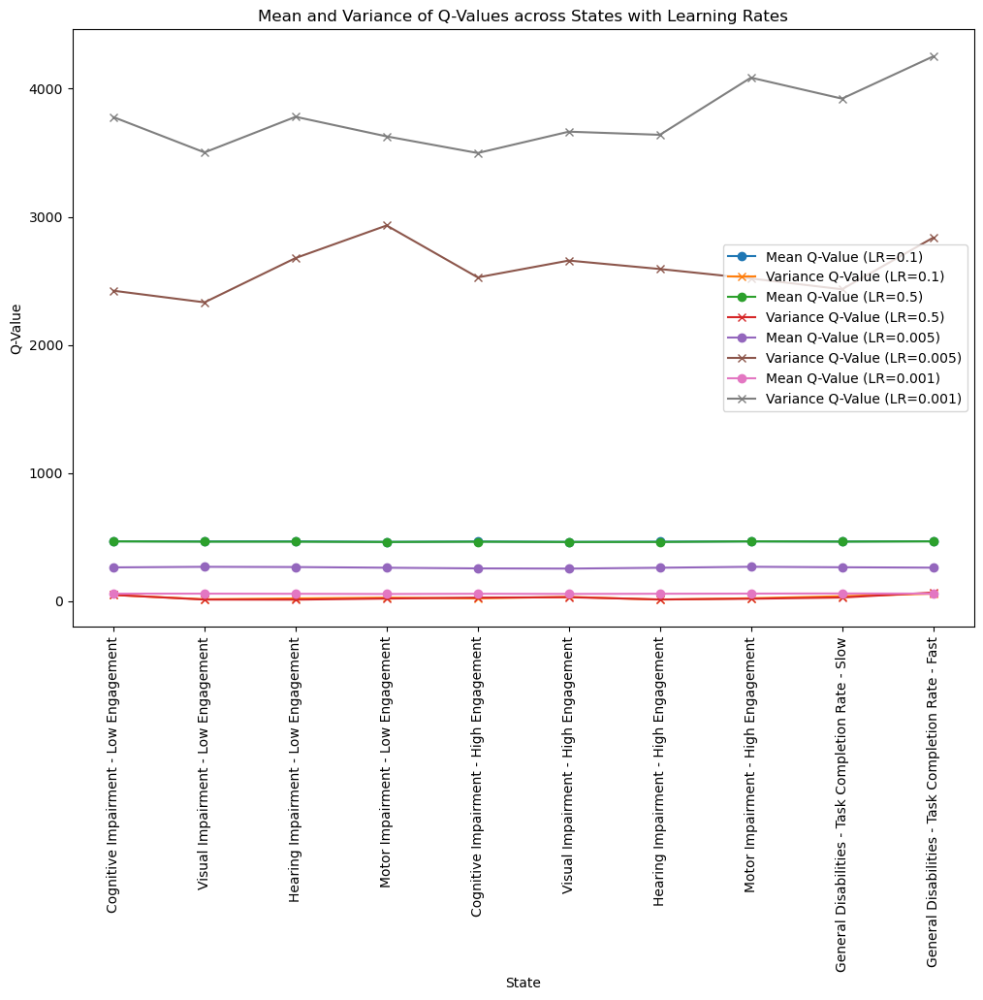

In [33]:
import matplotlib.pyplot as plt

# Sample data
state_values = hue_data["State"].values
mean_q_values = hue_data["Mean Q-Value"].values
variance_q_values = hue_data["Variance Q-Value"].values
learning_rates = hue_data["Learning Rate"].unique()  # Assuming there are different learning rates in the dataset

# Plotting the data
plt.figure(figsize=(12, 8))

# Loop over learning rates and plot corresponding Q-values for each
for lr in learning_rates:
    # Filter data for each learning rate
    lr_data = hue_data[hue_data["Learning Rate"] == lr]
    
    # Plot Mean Q-Values for this learning rate
    plt.plot(lr_data["State"].values, lr_data["Mean Q-Value"].values, label=f"Mean Q-Value (LR={lr})", marker="o")
    
    # Plot Variance Q-Values for this learning rate
    plt.plot(lr_data["State"].values, lr_data["Variance Q-Value"].values, label=f"Variance Q-Value (LR={lr})", marker="x")

# Adding labels and title
plt.xlabel("State")
plt.ylabel("Q-Value")
plt.title("Mean and Variance of Q-Values across States with Learning Rates")

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Add legend for learning rates
plt.legend()

# Display the plot
plt.show()


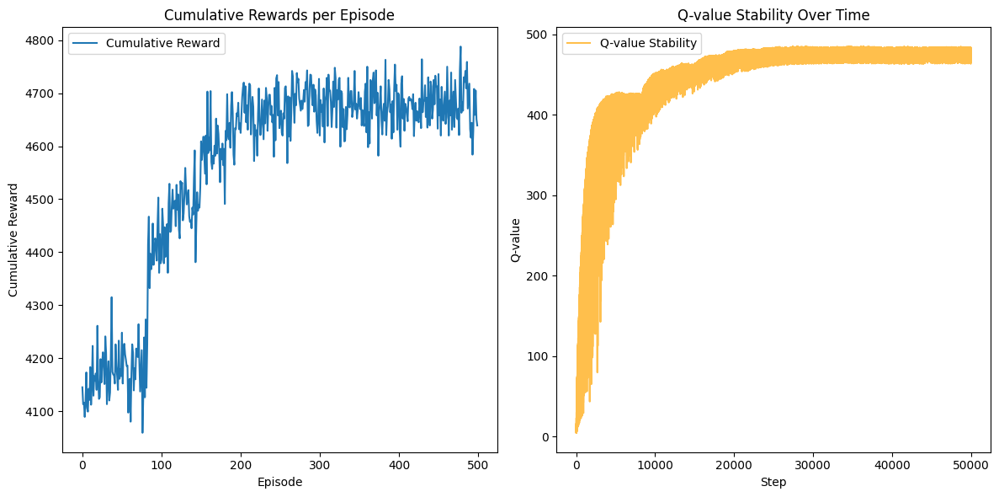

(0.19974, 0.80026)

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Initialize Q-table and reward structure
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))
rewards = {state: [random.randint(30, 50) for _ in actions] for state in states}

# Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 500
max_steps = 100

# Metrics
cumulative_rewards_per_episode = []
exploration_count = 0
exploitation_count = 0
q_value_stability_log = []


# Helper function for epsilon-greedy action selection
def choose_action(state_index, epsilon):
    global exploration_count, exploitation_count
    if random.uniform(0, 1) < epsilon:  # Explore
        exploration_count += 1
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        exploitation_count += 1
        return np.argmax(q_table[state_index])


# Simulate Q-learning
for episode in range(1, num_episodes + 1):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    cumulative_reward = 0

    for step in range(max_steps):
        action_index = choose_action(state_index, epsilon)
        reward = rewards[states[state_index]][action_index]
        cumulative_reward += reward

        next_state_index = random.randint(0, len(states) - 1)  # Random next state

        # Update Q-value
        q_table[state_index][action_index] += learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        q_value_stability_log.append(q_table[state_index][action_index])

        state_index = next_state_index

    cumulative_rewards_per_episode.append(cumulative_reward)

# Visualization of metrics
plt.figure(figsize=(12, 6))

# Plot cumulative rewards per episode
plt.subplot(1, 2, 1)
plt.plot(cumulative_rewards_per_episode, label="Cumulative Reward")
plt.title("Cumulative Rewards per Episode")
plt.xlabel("Episode")
plt.ylabel("Cumulative Reward")
plt.legend()

# Plot Q-value stability
plt.subplot(1, 2, 2)
plt.plot(q_value_stability_log, label="Q-value Stability", color='orange', alpha=0.7)
plt.title("Q-value Stability Over Time")
plt.xlabel("Step")
plt.ylabel("Q-value")
plt.legend()

plt.tight_layout()
plt.show()

# Exploration vs. Exploitation Ratio
exploration_ratio = exploration_count / (exploration_count + exploitation_count)
exploitation_ratio = exploitation_count / (exploration_count + exploitation_count)

exploration_ratio, exploitation_ratio


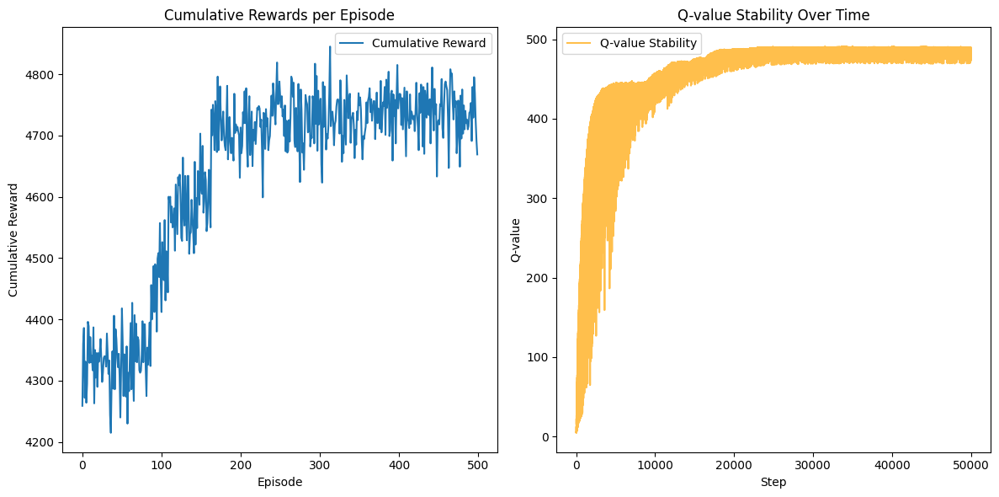

(0.2027, 0.7973)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Initialize Q-table and reward structure
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))
rewards = {state: [random.randint(30, 50) for _ in actions] for state in states}

# Q-learning parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 500
max_steps = 100

# Metrics
cumulative_rewards_per_episode = []
exploration_count = 0
exploitation_count = 0
q_value_stability_log = []


# Helper function for epsilon-greedy action selection
def choose_action(state_index, epsilon):
    global exploration_count, exploitation_count
    if random.uniform(0, 1) < epsilon:  # Explore
        exploration_count += 1
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        exploitation_count += 1
        return np.argmax(q_table[state_index])


# Simulate Q-learning
for episode in range(1, num_episodes + 1):
    state_index = random.randint(0, len(states) - 1)  # Start with a random state
    cumulative_reward = 0

    for step in range(max_steps):
        action_index = choose_action(state_index, epsilon)
        reward = rewards[states[state_index]][action_index]
        cumulative_reward += reward

        next_state_index = random.randint(0, len(states) - 1)  # Random next state

        # Update Q-value
        q_table[state_index][action_index] += learning_rate * (
            reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action_index]
        )
        q_value_stability_log.append(q_table[state_index][action_index])

        state_index = next_state_index

    cumulative_rewards_per_episode.append(cumulative_reward)

# Visualization of metrics
plt.figure(figsize=(12, 6))

# Plot cumulative rewards per episode
plt.subplot(1, 2, 1)
plt.plot(cumulative_rewards_per_episode, label="Cumulative Reward")
plt.title("Cumulative Rewards per Episode")
plt.xlabel("Episode")
plt.ylabel("Cumulative Reward")
plt.legend()

# Plot Q-value stability
plt.subplot(1, 2, 2)
plt.plot(q_value_stability_log, label="Q-value Stability", color='orange', alpha=0.7)
plt.title("Q-value Stability Over Time")
plt.xlabel("Step")
plt.ylabel("Q-value")
plt.legend()

plt.tight_layout()
plt.show()

# Exploration vs. Exploitation Ratio
exploration_ratio = exploration_count / (exploration_count + exploitation_count)
exploitation_ratio = exploitation_count / (exploration_count + exploitation_count)

exploration_ratio, exploitation_ratio


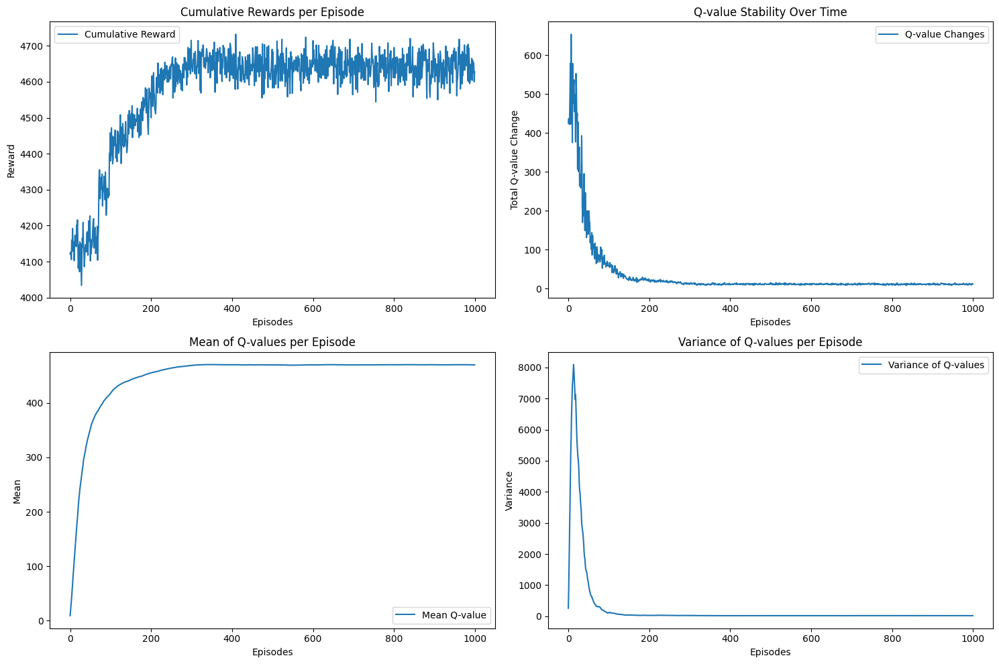

Exploration Ratio: 19.86%
Exploitation Ratio: 80.14%

For state 'Visual Impairment - Low Engagement', the recommended action is 'Introduce Interactive Task'.


In [2]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Initialize Q-table
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Reward matrix
rewards = {
    state: np.random.randint(35, 50, size=len(actions)).tolist() for state in states
}

# Parameters
learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2  # Exploration rate
num_episodes = 1000
max_steps = 100  # Steps per episode

# Metrics tracking
cumulative_rewards = []
exploration_count = 0
exploitation_count = 0
q_value_changes = []
q_mean_values = []
q_variance_values = []

# Epsilon-greedy action selection
def choose_action(state_index):
    global exploration_count, exploitation_count
    if random.uniform(0, 1) < epsilon:  # Explore
        exploration_count += 1
        return random.randint(0, len(actions) - 1)
    else:  # Exploit
        exploitation_count += 1
        return np.argmax(q_table[state_index])

# Q-learning process
for episode in range(num_episodes):
    state_index = random.randint(0, len(states) - 1)  # Random initial state
    episode_reward = 0
    q_change = 0  # Track Q-value changes per episode

    for step in range(max_steps):
        action_index = choose_action(state_index)
        reward = rewards[states[state_index]][action_index]
        next_state_index = random.randint(0, len(states) - 1)

        # Q-value update
        old_q_value = q_table[state_index][action_index]
        q_table[state_index][action_index] += learning_rate * (
            reward
            + discount_factor * np.max(q_table[next_state_index])
            - q_table[state_index][action_index]
        )
        q_change += abs(q_table[state_index][action_index] - old_q_value)

        episode_reward += reward
        state_index = next_state_index  # Transition to next state

    cumulative_rewards.append(episode_reward)
    q_value_changes.append(q_change)
    q_mean_values.append(np.mean(q_table))  # Mean of Q-values
    q_variance_values.append(np.var(q_table))  # Variance of Q-values

# Calculate metrics
exploration_ratio = exploration_count / (exploration_count + exploitation_count)
exploitation_ratio = exploitation_count / (exploration_count + exploitation_count)

# Visualizations
plt.figure(figsize=(15, 10))

# Cumulative rewards
plt.subplot(2, 2, 1)
plt.plot(cumulative_rewards, label="Cumulative Reward")
plt.xlabel("Episodes")
plt.ylabel("Reward")
plt.title("Cumulative Rewards per Episode")
plt.legend()

# Q-value stability
plt.subplot(2, 2, 2)
plt.plot(q_value_changes, label="Q-value Changes")
plt.xlabel("Episodes")
plt.ylabel("Total Q-value Change")
plt.title("Q-value Stability Over Time")
plt.legend()

# Mean of Q-values
plt.subplot(2, 2, 3)
plt.plot(q_mean_values, label="Mean Q-value")
plt.xlabel("Episodes")
plt.ylabel("Mean")
plt.title("Mean of Q-values per Episode")
plt.legend()

# Variance of Q-values
plt.subplot(2, 2, 4)
plt.plot(q_variance_values, label="Variance of Q-values")
plt.xlabel("Episodes")
plt.ylabel("Variance")
plt.title("Variance of Q-values per Episode")
plt.legend()

plt.tight_layout()
plt.show()

# Display metrics
print(f"Exploration Ratio: {exploration_ratio:.2%}")
print(f"Exploitation Ratio: {exploitation_ratio:.2%}")

# Example output for a specific state
state_example = "Visual Impairment - Low Engagement"
state_index = states.index(state_example)
best_action_index = np.argmax(q_table[state_index])
print(f"\nFor state '{state_example}', the recommended action is '{actions[best_action_index]}'.")


Initial Q-Table:
                                          Enable Text-to-Speech  \
Visual Impairment - Low Engagement                     0.571992   
Visual Impairment - High Engagement                    0.917795   
Auditory Impairment - Low Engagement                   0.180085   
Auditory Impairment - High Engagement                  0.508349   
Learning Disability - Beginner Skill                   0.494445   
Learning Disability - Intermediate Skill               0.939125   
Learning Disability - Advanced Skill                   0.384019   

                                          Increase Font Size  \
Visual Impairment - Low Engagement                  0.240180   
Visual Impairment - High Engagement                 0.789565   
Auditory Impairment - Low Engagement                0.965037   
Auditory Impairment - High Engagement               0.566684   
Learning Disability - Beginner Skill                0.918140   
Learning Disability - Intermediate Skill            0.893359  

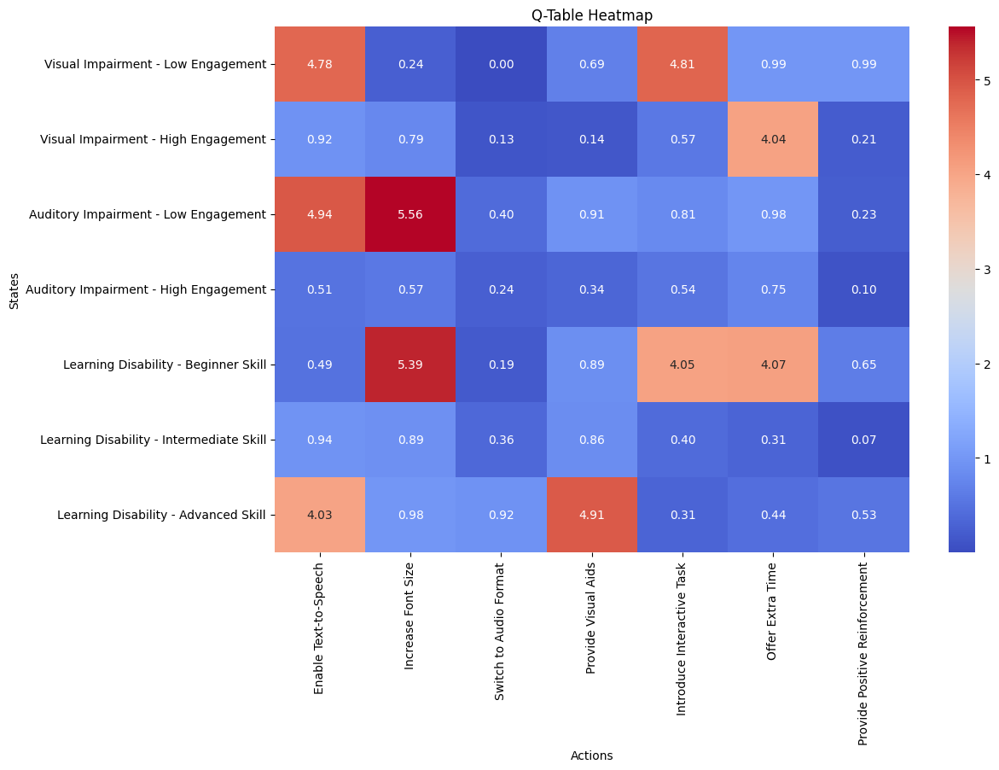

In [3]:
import numpy as np
import pandas as pd

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Initialize Q-table with random values
q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))

# Convert to a DataFrame for better visualization
q_table_df = pd.DataFrame(q_table, index=states, columns=actions)

# Display initial Q-table
print("Initial Q-Table:")
print(q_table_df)

# Simulate Q-learning updates
for episode in range(10):  # Simulate 10 episodes
    state_index = np.random.randint(0, len(states))  # Random initial state
    action_index = np.random.randint(0, len(actions))  # Random action
    reward = np.random.randint(35, 50)  # Random reward
    next_state_index = np.random.randint(0, len(states))  # Random next state

    # Q-value update formula
    q_table[state_index, action_index] += 0.1 * (
        reward + 0.9 * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
    )

    # Update DataFrame for display
    q_table_df = pd.DataFrame(q_table, index=states, columns=actions)

# Display updated Q-table after learning
print("\nUpdated Q-Table After Learning:")
print(q_table_df)

# Visualize as a heatmap using matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(q_table_df, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Q-Table Heatmap")
plt.xlabel("Actions")
plt.ylabel("States")
plt.show()


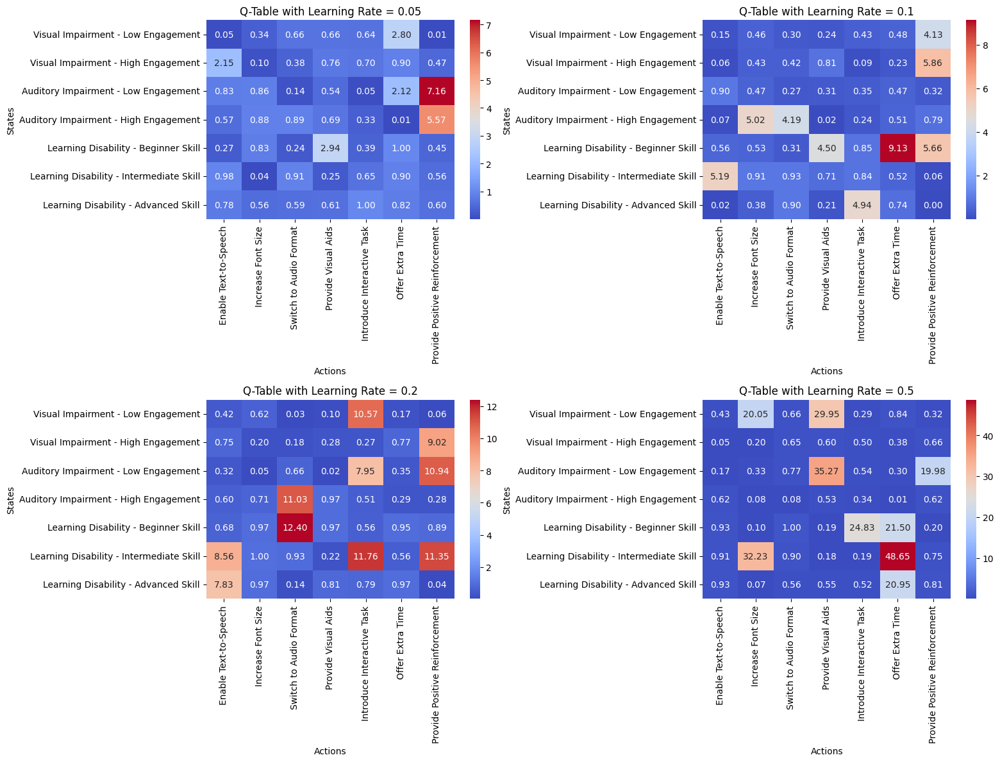

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with different learning rates
def simulate_q_learning(learning_rate, num_episodes=10):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    
    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        action_index = np.random.randint(0, len(actions))  # Random action
        reward = np.random.randint(35, 50)  # Random reward between 35 and 50
        next_state_index = np.random.randint(0, len(states))  # Random next state

        # Q-value update formula
        q_table[state_index, action_index] += learning_rate * (
            reward + 0.9 * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
        )
    
    return q_table

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]

# Set up a figure for plotting
plt.figure(figsize=(16, 12))

# Simulate and visualize Q-learning for each learning rate
for idx, learning_rate in enumerate(learning_rates, 1):
    q_table = simulate_q_learning(learning_rate)  # Simulate Q-learning with a specific learning rate
    q_table_df = pd.DataFrame(q_table, index=states, columns=actions)  # Convert Q-table to DataFrame
    
    # Plot heatmap for each learning rate
    plt.subplot(2, 2, idx)
    sns.heatmap(q_table_df, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
    plt.title(f"Q-Table with Learning Rate = {learning_rate}")
    plt.xlabel("Actions")
    plt.ylabel("States")

# Show the plot with all heatmaps
plt.tight_layout()
plt.show()


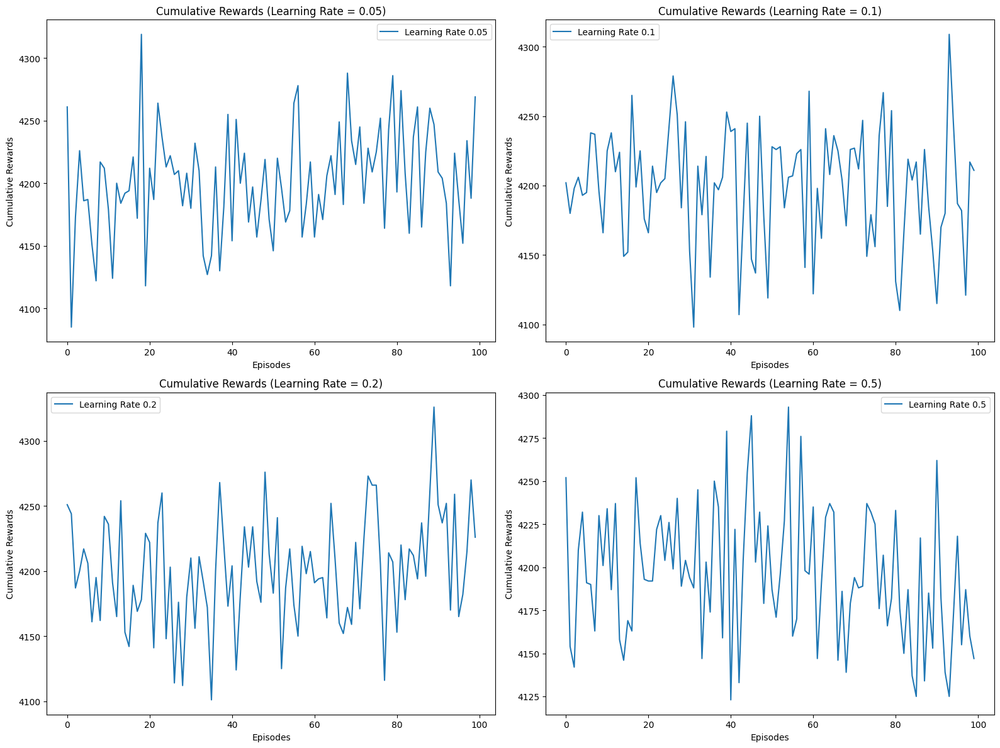

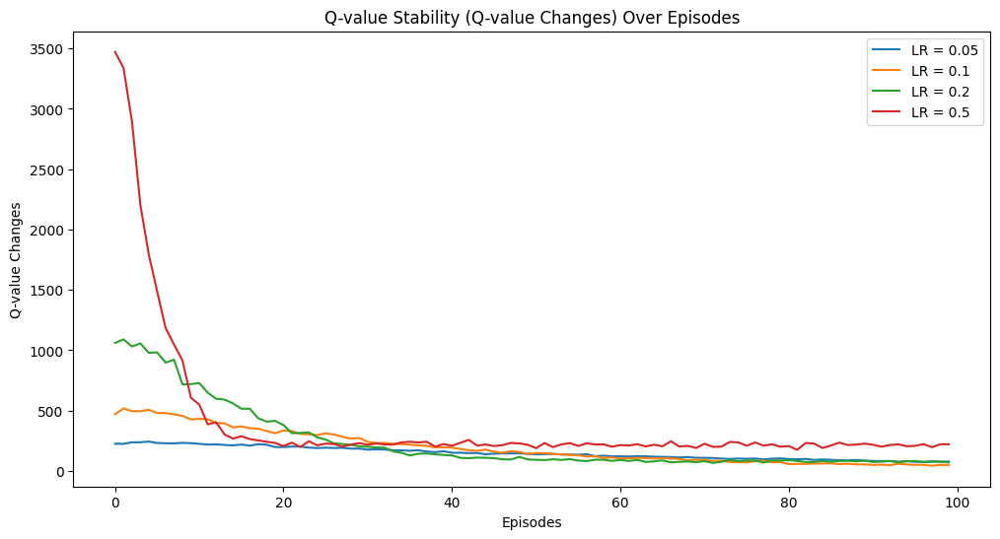

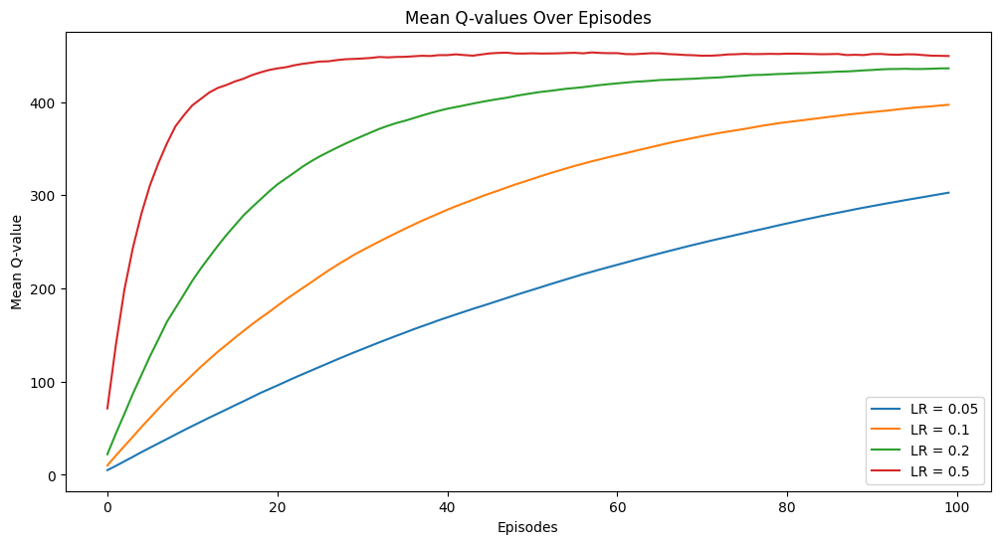

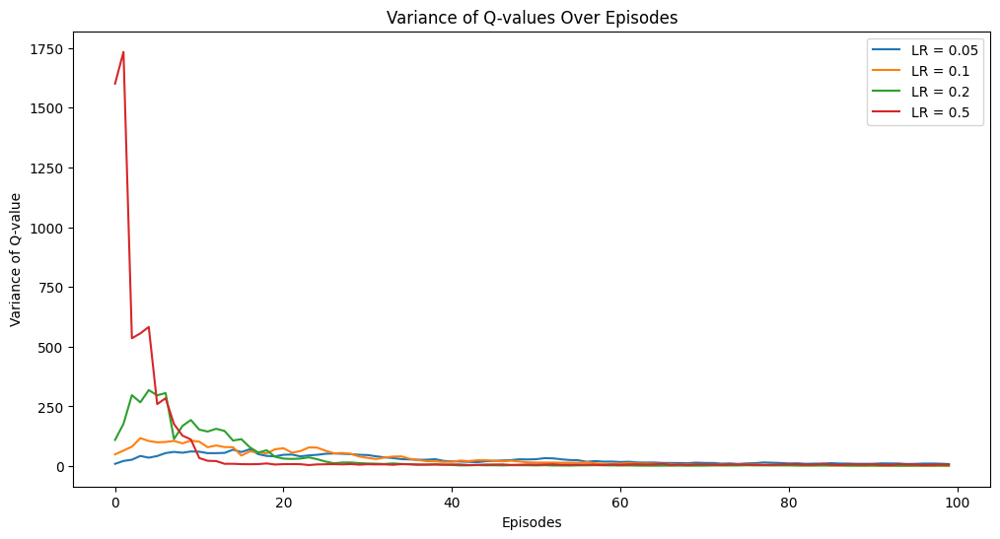

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with different learning rates and track metrics
def simulate_q_learning(learning_rate, num_episodes=1000, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    q_value_changes = []  # List to store Q-value changes per episode
    mean_q_values = []  # List to store mean Q-values per episode
    variance_q_values = []  # List to store variance of Q-values per episode

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        q_value_change = 0  # Track the total Q-value change for stability

        for _ in range(100):  # Simulate steps within each episode
            action_index = np.random.randint(0, len(actions))  # Random action
            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Calculate Q-value change for stability measure
            prev_q_value = q_table[state_index, action_index]

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Calculate Q-value change
            q_value_change += abs(prev_q_value - q_table[state_index, action_index])

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate mean and variance of Q-values
        mean_q_values.append(np.mean(q_table))
        variance_q_values.append(np.var(q_table))
        cumulative_rewards.append(cumulative_reward)
        q_value_changes.append(q_value_change)

    return cumulative_rewards, q_value_changes, mean_q_values, variance_q_values

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 100

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, q_value_changes, mean_q_values, variance_q_values = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "q_value_changes": q_value_changes,
        "mean_q_values": mean_q_values,
        "variance_q_values": variance_q_values
    }

    # Plot the cumulative rewards for each learning rate
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {learning_rate}")
    plt.title(f"Cumulative Rewards (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    plt.legend()

plt.tight_layout()
plt.show()

# Plot Q-value stability (Q-value changes) for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.plot(range(num_episodes), results[learning_rate]["q_value_changes"], label=f"LR = {learning_rate}")

plt.title("Q-value Stability (Q-value Changes) Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Q-value Changes")
plt.legend()
plt.show()

# Plot Mean Q-values over episodes for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.plot(range(num_episodes), results[learning_rate]["mean_q_values"], label=f"LR = {learning_rate}")

plt.title("Mean Q-values Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Mean Q-value")
plt.legend()
plt.show()

# Plot Variance of Q-values over episodes for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.plot(range(num_episodes), results[learning_rate]["variance_q_values"], label=f"LR = {learning_rate}")

plt.title("Variance of Q-values Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Variance of Q-value")
plt.legend()
plt.show()


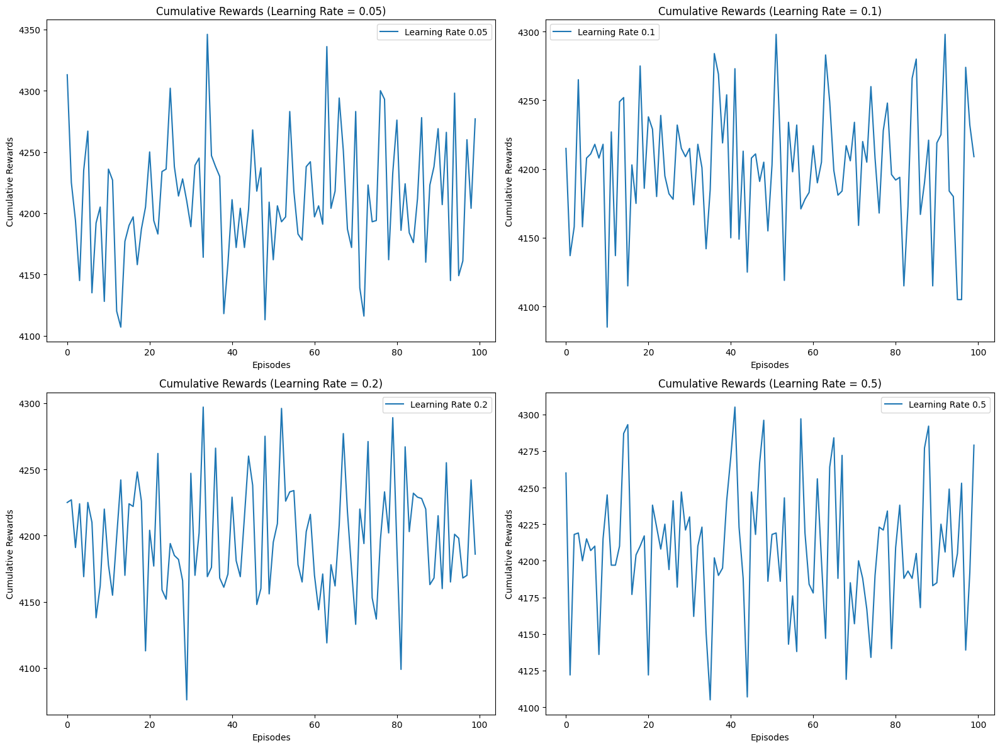

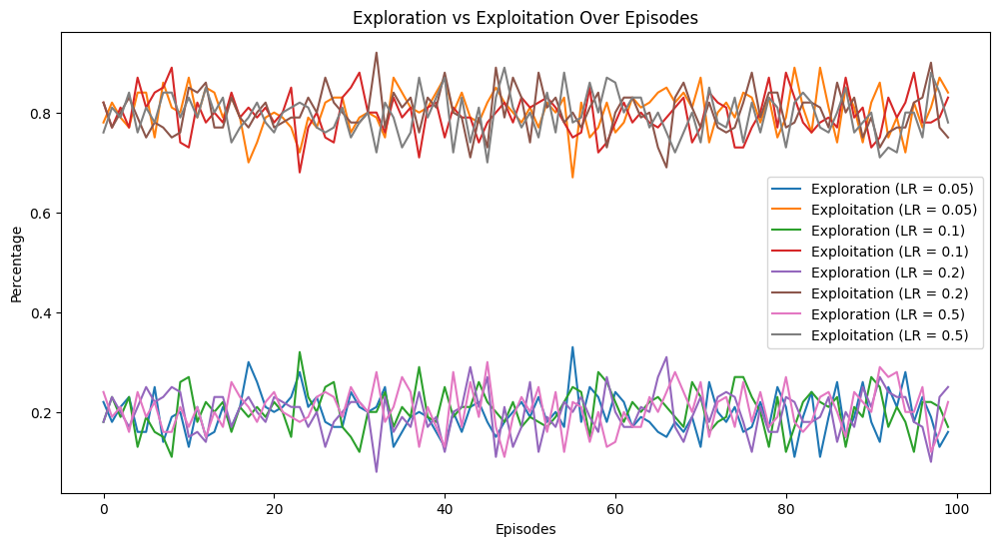

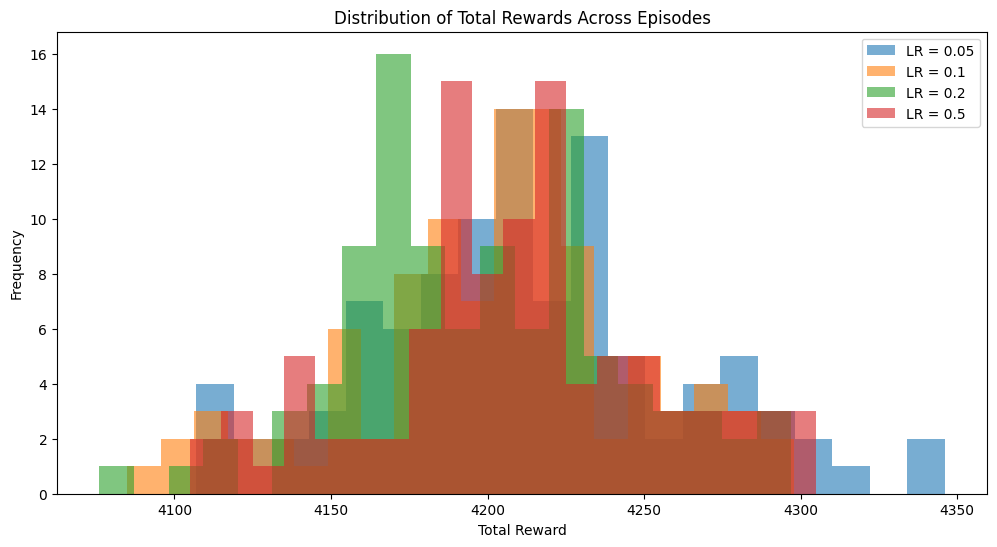

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=100, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(100):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 100

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Plot the cumulative rewards for each learning rate
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {learning_rate}")
    plt.title(f"Cumulative Rewards (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    plt.legend()

plt.tight_layout()
plt.show()

# Plot Exploration vs Exploitation for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.plot(range(num_episodes), results[learning_rate]["exploration_percentage"], label=f"Exploration (LR = {learning_rate})")
    plt.plot(range(num_episodes), results[learning_rate]["exploitation_percentage"], label=f"Exploitation (LR = {learning_rate})")

plt.title("Exploration vs Exploitation Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Percentage")
plt.legend()
plt.show()

# Plot the distribution of rewards across episodes
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.hist(results[learning_rate]["cumulative_rewards"], bins=20, alpha=0.6, label=f"LR = {learning_rate}")

plt.title("Distribution of Total Rewards Across Episodes")
plt.xlabel("Total Reward")
plt.ylabel("Frequency")
plt.legend()
plt.show()


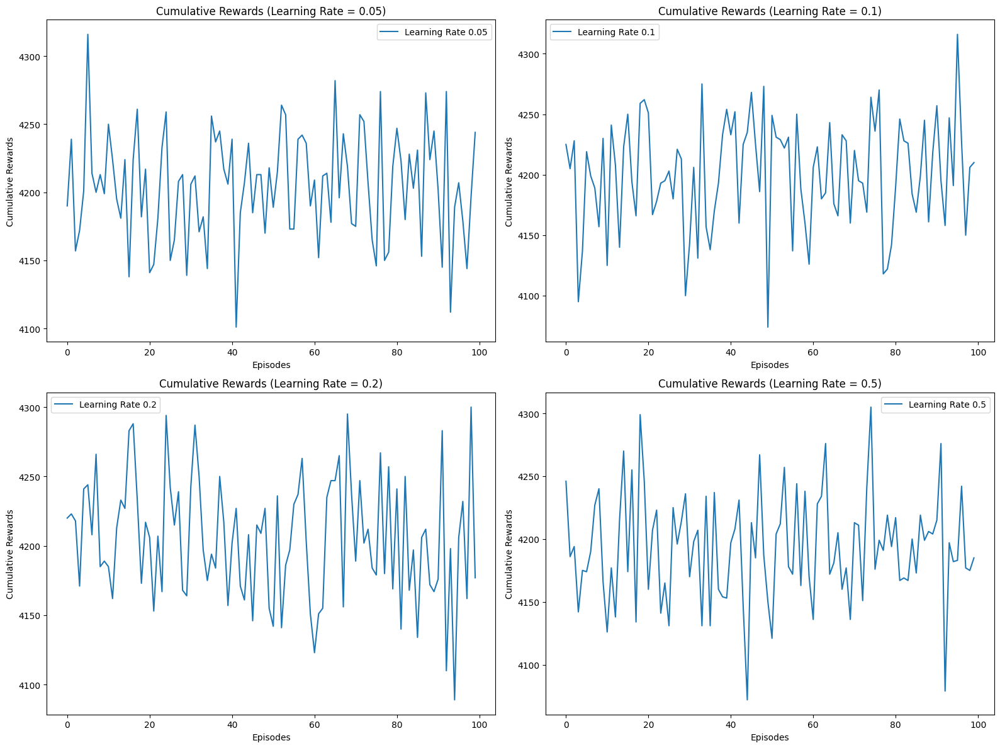

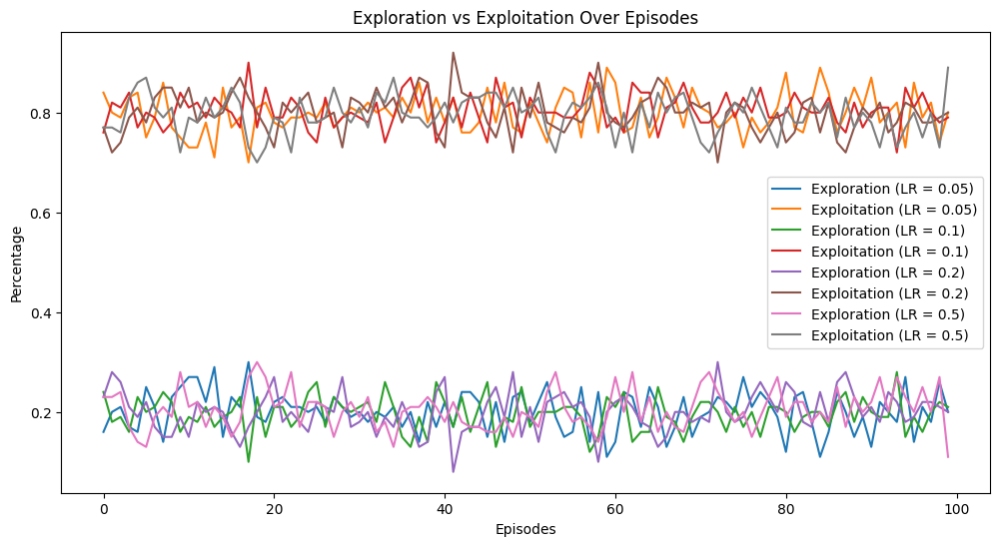

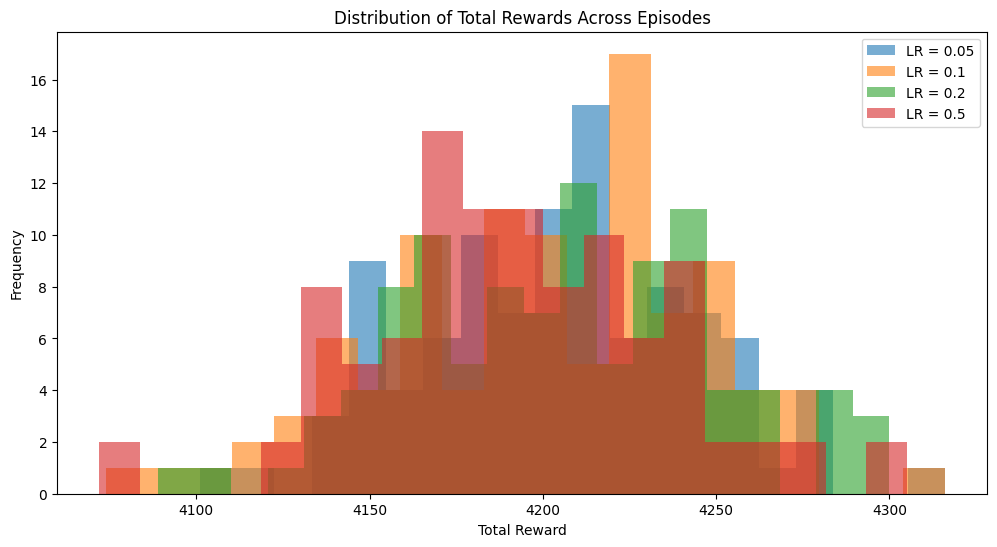

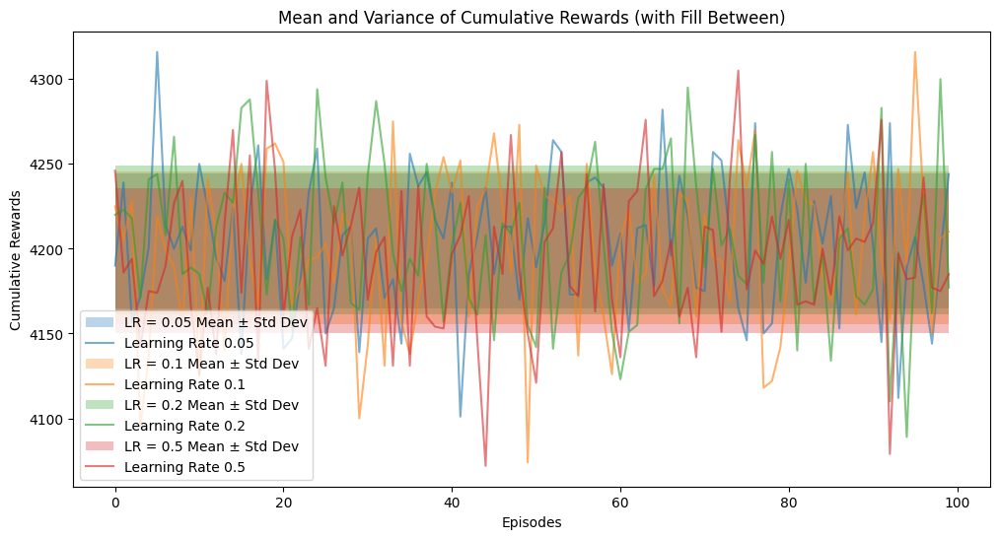

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=100, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(100):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 100

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Plot the cumulative rewards for each learning rate
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {learning_rate}")
    plt.title(f"Cumulative Rewards (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    plt.legend()

plt.tight_layout()
plt.show()

# Plot Exploration vs Exploitation for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.plot(range(num_episodes), results[learning_rate]["exploration_percentage"], label=f"Exploration (LR = {learning_rate})")
    plt.plot(range(num_episodes), results[learning_rate]["exploitation_percentage"], label=f"Exploitation (LR = {learning_rate})")

plt.title("Exploration vs Exploitation Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Percentage")
plt.legend()
plt.show()

# Plot the distribution of rewards across episodes
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.hist(results[learning_rate]["cumulative_rewards"], bins=20, alpha=0.6, label=f"LR = {learning_rate}")

plt.title("Distribution of Total Rewards Across Episodes")
plt.xlabel("Total Reward")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# Mean and variance of cumulative rewards for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    cumulative_rewards = results[learning_rate]["cumulative_rewards"]
    mean_rewards = np.mean(cumulative_rewards)
    variance_rewards = np.var(cumulative_rewards)

    # Plot mean and variance using fill_between
    plt.fill_between(range(num_episodes), mean_rewards - np.sqrt(variance_rewards), mean_rewards + np.sqrt(variance_rewards),
                     alpha=0.3, label=f"LR = {learning_rate} Mean ± Std Dev")
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {learning_rate}", alpha=0.6)

plt.title("Mean and Variance of Cumulative Rewards (with Fill Between)")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.show()


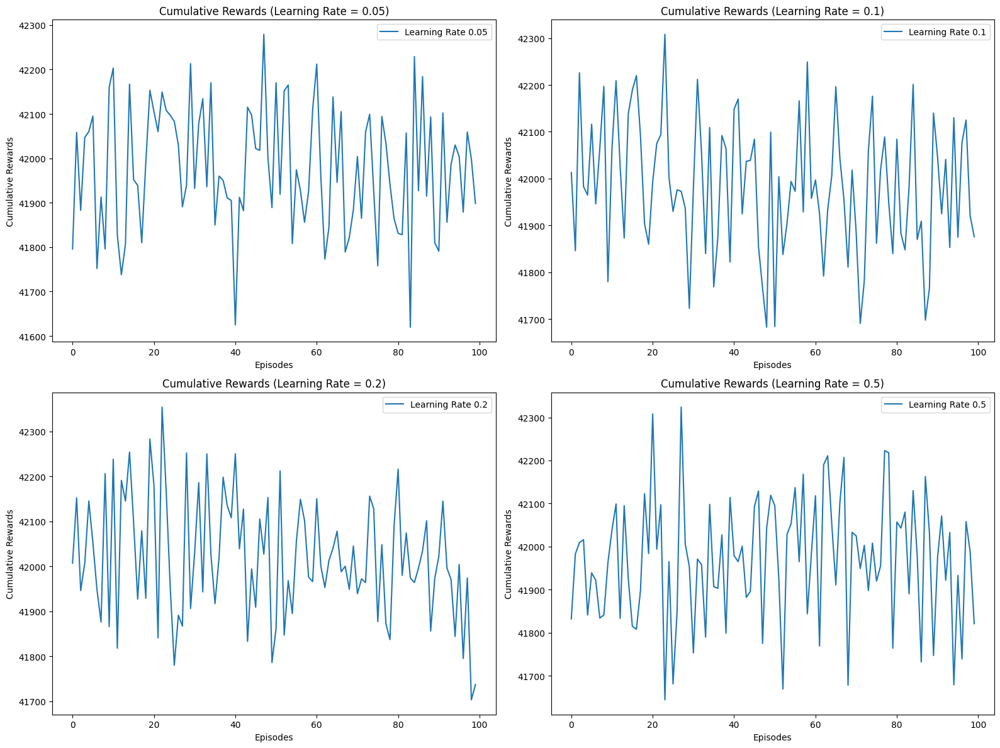

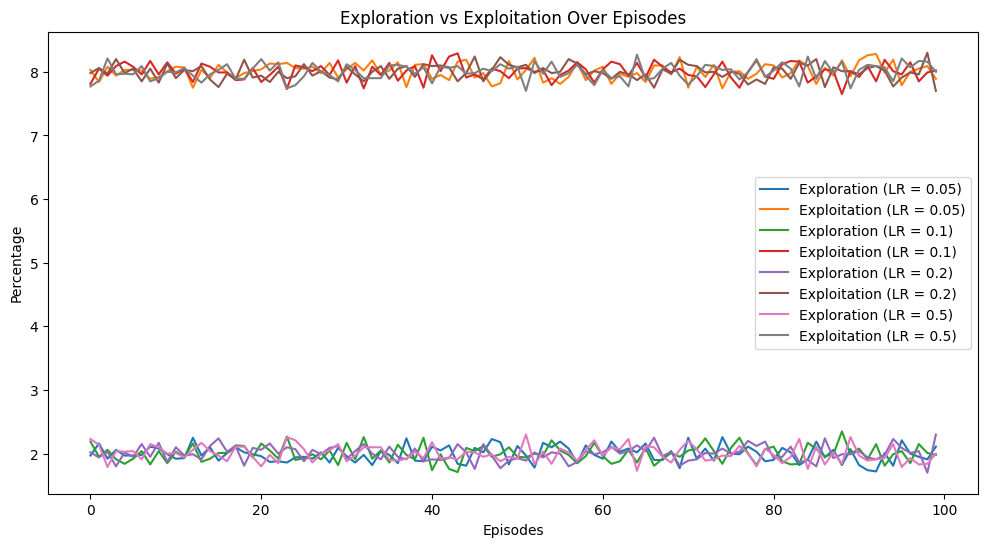

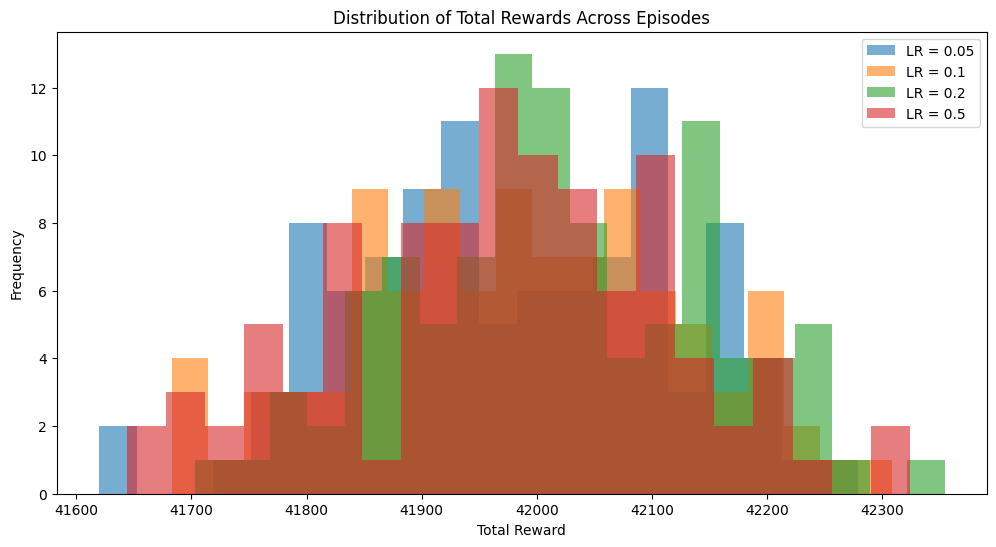

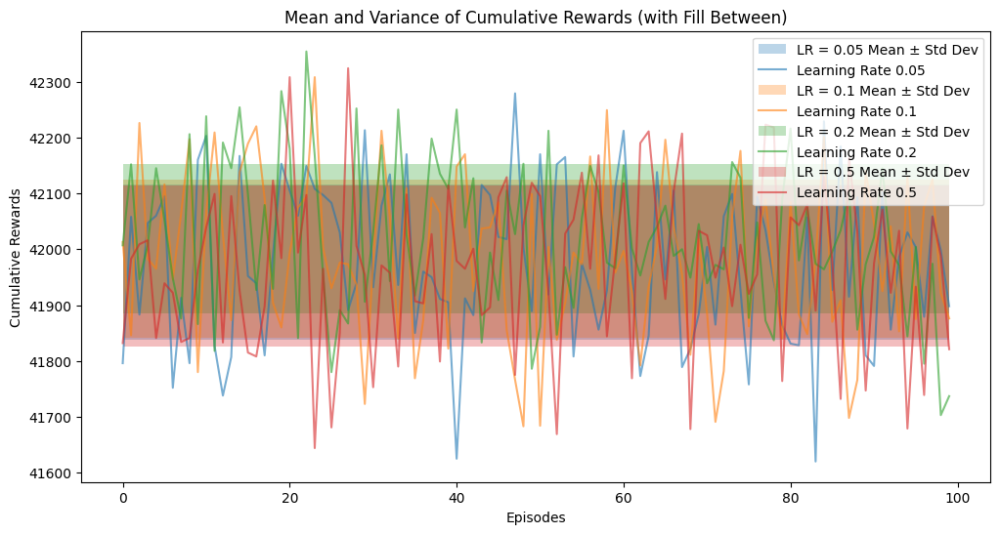

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=100, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(1000):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 100

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Plot the cumulative rewards for each learning rate
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {learning_rate}")
    plt.title(f"Cumulative Rewards (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    plt.legend()

plt.tight_layout()
plt.show()

# Plot Exploration vs Exploitation for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.plot(range(num_episodes), results[learning_rate]["exploration_percentage"], label=f"Exploration (LR = {learning_rate})")
    plt.plot(range(num_episodes), results[learning_rate]["exploitation_percentage"], label=f"Exploitation (LR = {learning_rate})")

plt.title("Exploration vs Exploitation Over Episodes")
plt.xlabel("Episodes")
plt.ylabel("Percentage")
plt.legend()
plt.show()

# Plot the distribution of rewards across episodes
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    plt.hist(results[learning_rate]["cumulative_rewards"], bins=20, alpha=0.6, label=f"LR = {learning_rate}")

plt.title("Distribution of Total Rewards Across Episodes")
plt.xlabel("Total Reward")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# Mean and variance of cumulative rewards for each learning rate
plt.figure(figsize=(12, 6))
for learning_rate in learning_rates:
    cumulative_rewards = results[learning_rate]["cumulative_rewards"]
    mean_rewards = np.mean(cumulative_rewards)
    variance_rewards = np.var(cumulative_rewards)

    # Plot mean and variance using fill_between
    plt.fill_between(range(num_episodes), mean_rewards - np.sqrt(variance_rewards), mean_rewards + np.sqrt(variance_rewards),
                     alpha=0.3, label=f"LR = {learning_rate} Mean ± Std Dev")
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Learning Rate {learning_rate}", alpha=0.6)

plt.title("Mean and Variance of Cumulative Rewards (with Fill Between)")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.show()


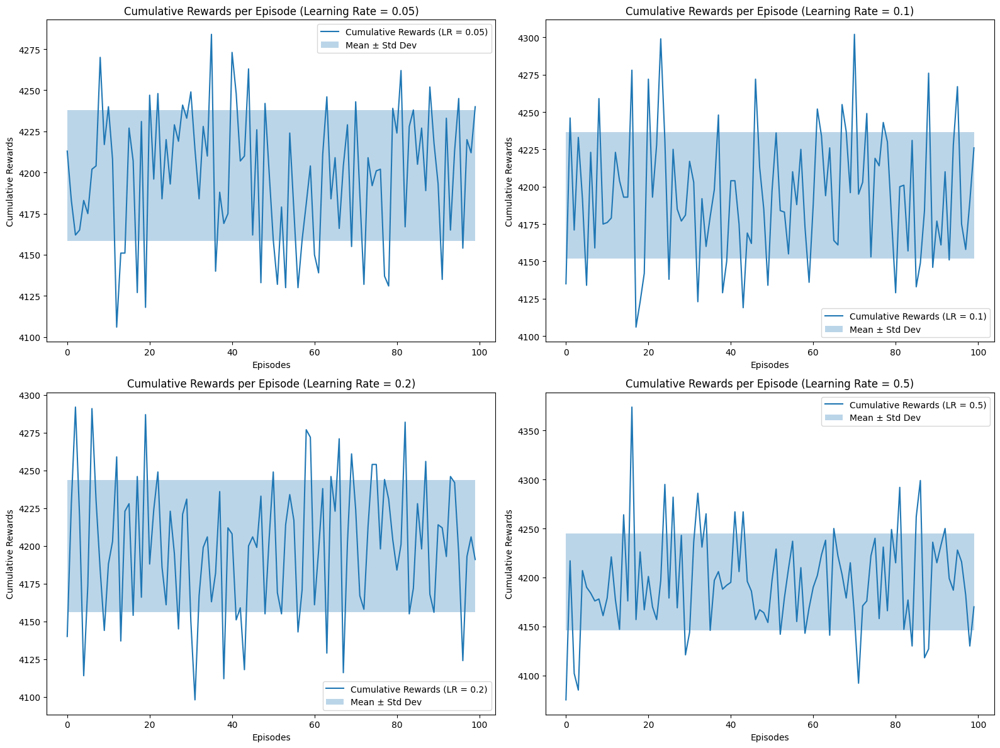

In [28]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=100, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(100):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 100

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Calculate mean and standard deviation of cumulative rewards
    mean_rewards = np.mean(cumulative_rewards)
    std_rewards = np.std(cumulative_rewards)

    # Plot the cumulative rewards with mean and standard deviation
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Cumulative Rewards (LR = {learning_rate})")
    plt.title(f"Cumulative Rewards per Episode (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    
    # Plot mean and standard deviation using fill_between
    plt.fill_between(range(num_episodes), mean_rewards - std_rewards, mean_rewards + std_rewards, alpha=0.3, label="Mean ± Std Dev")
    
    plt.legend()

plt.tight_layout()
plt.show()


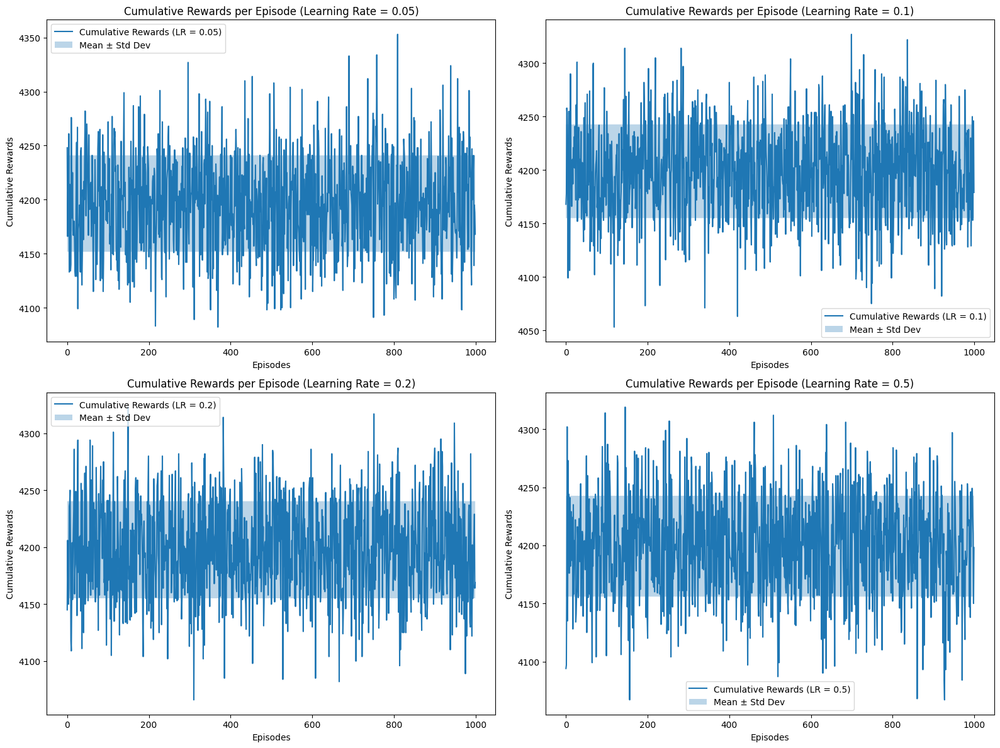

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=1000, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(100):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 1000

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Calculate mean and standard deviation of cumulative rewards
    mean_rewards = np.mean(cumulative_rewards)
    std_rewards = np.std(cumulative_rewards)

    # Plot the cumulative rewards with mean and standard deviation
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Cumulative Rewards (LR = {learning_rate})")
    plt.title(f"Cumulative Rewards per Episode (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    
    # Plot mean and standard deviation using fill_between
    plt.fill_between(range(num_episodes), mean_rewards - std_rewards, mean_rewards + std_rewards, alpha=0.3, label="Mean ± Std Dev")
    
    plt.legend()

plt.tight_layout()
plt.show()


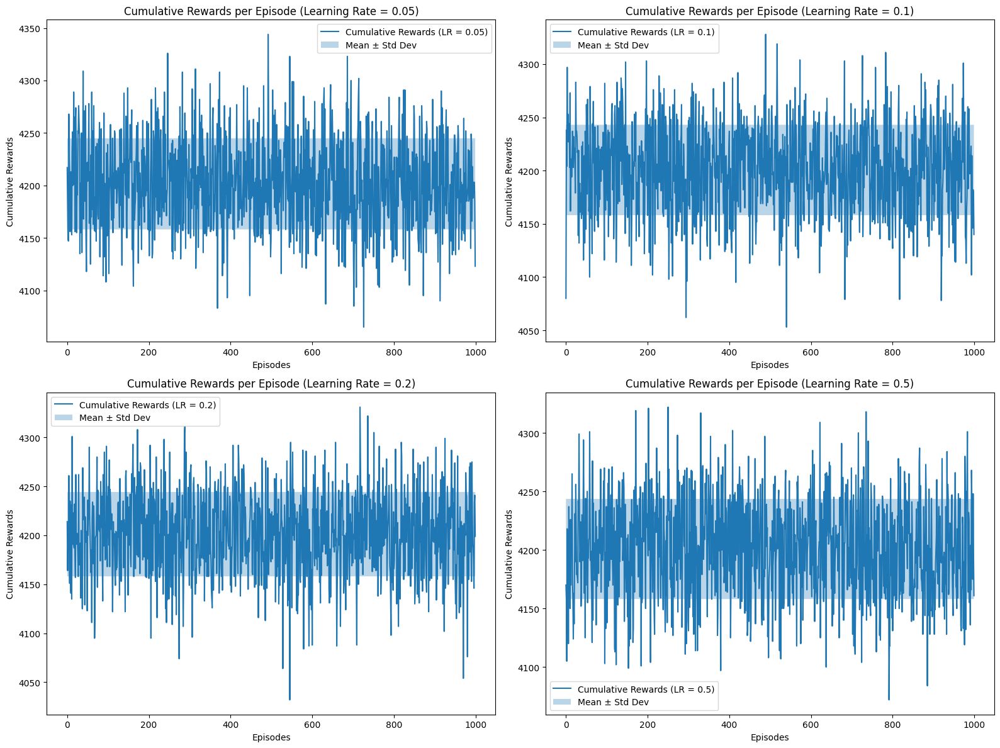

ValueError: data type must provide an itemsize

<Figure size 1200x800 with 0 Axes>

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=1000, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(100):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 1000
window_size = 20  # Window size for rolling mean and variance

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Calculate mean and standard deviation of cumulative rewards
    mean_rewards = np.mean(cumulative_rewards)
    std_rewards = np.std(cumulative_rewards)

    # Plot the cumulative rewards with mean and standard deviation
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Cumulative Rewards (LR = {learning_rate})")
    plt.title(f"Cumulative Rewards per Episode (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    
    # Plot mean and standard deviation using fill_between
    plt.fill_between(range(num_episodes), mean_rewards - std_rewards, mean_rewards + std_rewards, alpha=0.3, label="Mean ± Std Dev")
    
    plt.legend()

plt.tight_layout()
plt.show()

# Now, plot cumulative rewards with rolling mean and variance
plt.figure(figsize=(12, 8))

for lr, (cumulative_rewards, _, _) in results.items():
    # Calculate rolling mean and rolling variance
    rolling_mean = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')
    rolling_variance = np.convolve((cumulative_rewards - np.mean(cumulative_rewards)) ** 2, 
                                   np.ones(window_size) / window_size, mode='valid')
    
    # Define x-axis range for the valid window
    x_range = range(window_size - 1, num_episodes)
    
    # Plot the cumulative rewards
    plt.plot(range(num_episodes), cumulative_rewards, alpha=0.3, label=f"Learning Rate {lr} (Raw)", linestyle='dashed')
    
    # Plot the rolling mean
    plt.plot(x_range, rolling_mean, label=f"Learning Rate {lr} (Smoothed)")
    
    # Fill area between mean ± variance for the rolling window
    plt.fill_between(
        x_range,
        rolling_mean - np.sqrt(rolling_variance),  # Mean - Std Dev
        rolling_mean + np.sqrt(rolling_variance),  # Mean + Std Dev
        alpha=0.2
    )

# Configure plot details
plt.title("Cumulative Rewards Per Episode with Mean ± Std Dev (Rolling Window)")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.grid()
plt.show()


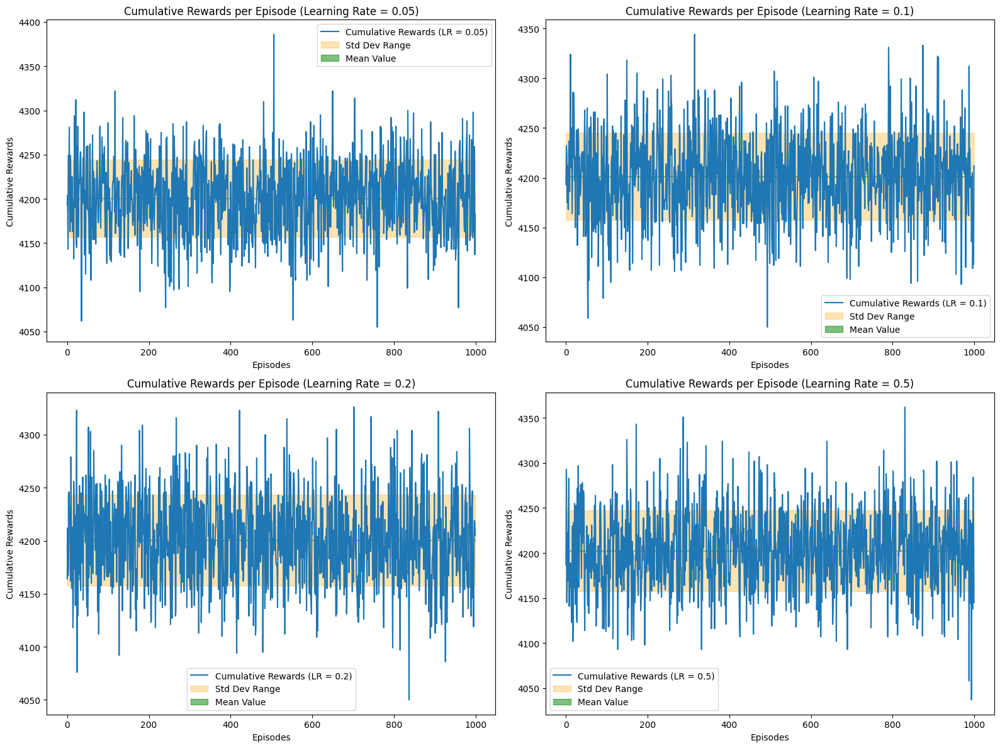

ValueError: data type must provide an itemsize

<Figure size 1200x800 with 0 Axes>

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=1000, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(100):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 1000
window_size = 20  # Window size for rolling mean and variance

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Calculate mean and standard deviation of cumulative rewards
    mean_rewards = np.mean(cumulative_rewards)
    std_rewards = np.std(cumulative_rewards)

    # Plot the cumulative rewards with mean and standard deviation
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Cumulative Rewards (LR = {learning_rate})")
    plt.title(f"Cumulative Rewards per Episode (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    
    # Plot mean and standard deviation using fill_between
    plt.fill_between(range(num_episodes), mean_rewards - std_rewards, mean_rewards + std_rewards, alpha=0.3, color='orange', label="Std Dev Range")
    
    # Plot mean with a different color (green)
    plt.fill_between(range(num_episodes), mean_rewards, mean_rewards, alpha=0.5, color='green', label="Mean Value")
    
    plt.legend()

plt.tight_layout()
plt.show()

# Now, plot cumulative rewards with rolling mean and variance
plt.figure(figsize=(12, 8))

for lr, (cumulative_rewards, _, _) in results.items():
    # Calculate rolling mean and rolling variance
    rolling_mean = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')
    rolling_variance = np.convolve((cumulative_rewards - np.mean(cumulative_rewards)) ** 2, 
                                   np.ones(window_size) / window_size, mode='valid')
    
    # Define x-axis range for the valid window
    x_range = range(window_size - 1, num_episodes)
    
    # Plot the cumulative rewards
    plt.plot(range(num_episodes), cumulative_rewards, alpha=0.3, label=f"Learning Rate {lr} (Raw)", linestyle='dashed')
    
    # Plot the rolling mean
    plt.plot(x_range, rolling_mean, label=f"Learning Rate {lr} (Smoothed)")
    
    # Fill area between mean ± variance for the rolling window with different colors
    plt.fill_between(
        x_range,
        rolling_mean - np.sqrt(rolling_variance),  # Mean - Std Dev
        rolling_mean + np.sqrt(rolling_variance),  # Mean + Std Dev
        alpha=0.2,
        color='blue',  # Color for variance
        label="Mean ± Std Dev"
    )

# Configure plot details
plt.title("Cumulative Rewards Per Episode with Mean ± Std Dev (Rolling Window)")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.grid()
plt.show()


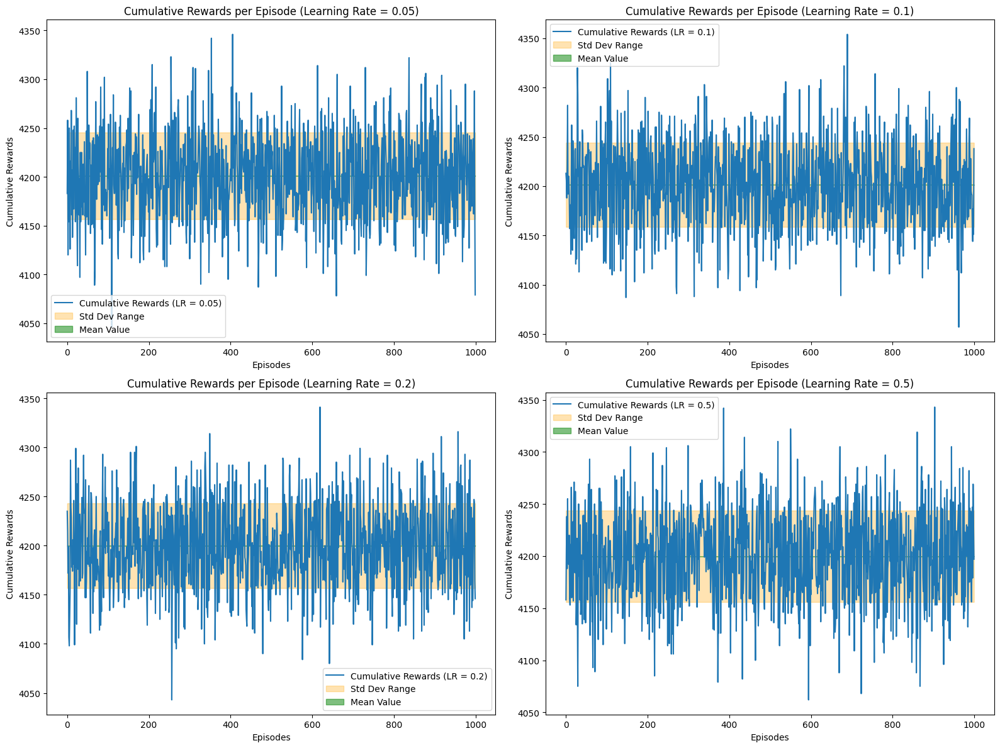

ValueError: data type must provide an itemsize

<Figure size 1200x800 with 0 Axes>

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Define states and actions
states = [
    "Visual Impairment - Low Engagement",
    "Visual Impairment - High Engagement",
    "Auditory Impairment - Low Engagement",
    "Auditory Impairment - High Engagement",
    "Learning Disability - Beginner Skill",
    "Learning Disability - Intermediate Skill",
    "Learning Disability - Advanced Skill",
]
actions = [
    "Enable Text-to-Speech",
    "Increase Font Size",
    "Switch to Audio Format",
    "Provide Visual Aids",
    "Introduce Interactive Task",
    "Offer Extra Time",
    "Provide Positive Reinforcement",
]

# Function to simulate Q-learning with exploration vs exploitation tracking
def simulate_q_learning(learning_rate, num_episodes=1000, discount_factor=0.9, epsilon=0.2):
    q_table = np.random.uniform(low=0, high=1, size=(len(states), len(actions)))  # Initialize Q-table with random values
    cumulative_rewards = []  # List to store cumulative rewards per episode
    exploration_percentage = []  # List to track exploration percentage
    exploitation_percentage = []  # List to track exploitation percentage

    # Simulate learning process over multiple episodes
    for episode in range(num_episodes):
        state_index = np.random.randint(0, len(states))  # Random initial state
        cumulative_reward = 0  # Track cumulative reward for the episode
        exploration_count = 0  # Count of exploration actions
        exploitation_count = 0  # Count of exploitation actions

        for _ in range(100):  # Simulate steps within each episode
            if np.random.rand() < epsilon:  # Exploration: random action
                action_index = np.random.randint(0, len(actions))
                exploration_count += 1
            else:  # Exploitation: select best action based on Q-value
                action_index = np.argmax(q_table[state_index])
                exploitation_count += 1

            reward = np.random.randint(35, 50)  # Random reward between 35 and 50
            next_state_index = np.random.randint(0, len(states))  # Random next state

            # Q-value update formula
            q_table[state_index, action_index] += learning_rate * (
                reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index, action_index]
            )

            # Update cumulative reward
            cumulative_reward += reward

            # Transition to next state
            state_index = next_state_index
        
        # Calculate exploration and exploitation percentages
        exploration_percentage.append(exploration_count / 100)  # Proportion of exploration actions
        exploitation_percentage.append(exploitation_count / 100)  # Proportion of exploitation actions
        cumulative_rewards.append(cumulative_reward)

    return cumulative_rewards, exploration_percentage, exploitation_percentage

# List of learning rates to test
learning_rates = [0.05, 0.1, 0.2, 0.5]
num_episodes = 1000
window_size = 20  # Window size for rolling mean and variance

# Create subplots for visualizing the results
plt.figure(figsize=(16, 12))

# Store results for each learning rate
results = {}

for idx, learning_rate in enumerate(learning_rates, 1):
    cumulative_rewards, exploration_percentage, exploitation_percentage = simulate_q_learning(learning_rate, num_episodes)
    
    # Store results
    results[learning_rate] = {
        "cumulative_rewards": cumulative_rewards,
        "exploration_percentage": exploration_percentage,
        "exploitation_percentage": exploitation_percentage
    }

    # Calculate mean and standard deviation of cumulative rewards
    mean_rewards = np.mean(cumulative_rewards)
    std_rewards = np.std(cumulative_rewards)

    # Plot the cumulative rewards with mean and standard deviation
    plt.subplot(2, 2, idx)
    plt.plot(range(num_episodes), cumulative_rewards, label=f"Cumulative Rewards (LR = {learning_rate})")
    plt.title(f"Cumulative Rewards per Episode (Learning Rate = {learning_rate})")
    plt.xlabel("Episodes")
    plt.ylabel("Cumulative Rewards")
    
    # Plot mean and standard deviation using fill_between
    plt.fill_between(range(num_episodes), mean_rewards - std_rewards, mean_rewards + std_rewards, alpha=0.3, color='orange', label="Std Dev Range")
    
    # Plot mean with a different color (green)
    plt.fill_between(range(num_episodes), mean_rewards, mean_rewards, alpha=0.5, color='green', label="Mean Value")
    
    plt.legend()

plt.tight_layout()
plt.show()

# Now, plot cumulative rewards with rolling mean and variance
plt.figure(figsize=(12, 8))

for lr, (cumulative_rewards, _, _) in results.items():
    # Ensure cumulative_rewards is a numpy array for correct convolution
    cumulative_rewards = np.array(cumulative_rewards)
    
    # Calculate rolling mean and rolling variance
    rolling_mean = np.convolve(cumulative_rewards, np.ones(window_size) / window_size, mode='valid')
    rolling_variance = np.convolve((cumulative_rewards - np.mean(cumulative_rewards)) ** 2, 
                                   np.ones(window_size) / window_size, mode='valid')
    
    # Define x-axis range for the valid window
    x_range = range(window_size - 1, num_episodes)
    
    # Plot the cumulative rewards
    plt.plot(range(num_episodes), cumulative_rewards, alpha=0.3, label=f"Learning Rate {lr} (Raw)", linestyle='dashed')
    
    # Plot the rolling mean
    plt.plot(x_range, rolling_mean, label=f"Learning Rate {lr} (Smoothed)")
    
    # Fill area between mean ± variance for the rolling window with different colors
    plt.fill_between(
        x_range,
        rolling_mean - np.sqrt(rolling_variance),  # Mean - Std Dev
        rolling_mean + np.sqrt(rolling_variance),  # Mean + Std Dev
        alpha=0.2,
        color='blue',  # Color for variance
        label="Mean ± Std Dev"
    )

# Configure plot details
plt.title("Cumulative Rewards Per Episode with Mean ± Std Dev (Rolling Window)")
plt.xlabel("Episodes")
plt.ylabel("Cumulative Rewards")
plt.legend()
plt.grid()
plt.show()
